### **Ультимативный фреймворк EDA и предобоработки для задач регрессии**

*составитель: сам автор :)*

---
#### **Этап 0: Первичная настройка и обзор данных**
1.  **Подготовка:** Импортировать необходимые библиотеки и загрузить данные.
2.  **Общая информация:** Изучить "паспорт" данных с помощью `.info()` и `.describe()`.
3.  **Очистка от дубликатов:** Найти и удалить полностью дублирующиеся строки (`.duplicated().sum()`).
4.  **Удаление неинформативных признаков:**
    *   Исключить признаки с "утечкой из будущего" (target leakage).
    *   Исключить идентификаторы (`ID`, `name`), если они не несут полезной информации для объединения или инжиниринга.
5.  **Анализ пропусков:** Оценить общее количество и долю пропусков по каждому признаку (`.isnull().sum()`).
6.  **Разделение признаков:** Создать списки числовых и категориальных признаков.

---
#### **Этап 1: Глубокий анализ вещественных признаков**
1.  **Анализ выбросов и распределений:**
    *   Для каждого признака построить `boxplot` и `countplot`/`histplot` для визуальной идентификации выбросов и понимания формы распределения.
    *   Удалить строки со значениями, которые являются логически невозможными (например, отрицательный возраст).
2.  **Заполнение пропусков:**
    *   **Ключевой шаг:** Перед любыми действиями **изучить документацию** (если она есть), чтобы понять природу пропусков.
        *   **Если пропуск — это осмысленное отсутствие (например, "нет гаража"):** Заполнить его соответствующим значением, чаще всего **нулём** (например, `GarageArea = 0`).
        *   **Если пропуск — это потеря данных:** Применить следующую стратегию:
            *   **> 50-60% пропусков:** Признак — кандидат на удаление. Перед этим провести дополнительный анализ: проверить корреляцию/визуальную связь с `y`. Провести эксперимент: обучить финальную модель с этим признаком (после импутации) и без него, сравнить качество на кросс-валидации.
            *   **20-50% пропусков:** Применить "умную" импутацию, например, с помощью `KNNImputer`.
            *   **< 5-10% пропусков:** Применить простую и робастную импутацию **медианой**.
3.  **Трансформация распределений:**
    *   После заполнения пропусков снова оценить распределения (`skew`, `kurt`).
    *   Для моделей, чувствительных к масштабу (линейные, SVM), привести сильно скошенные признаки к нормальному распределению с помощью `np.log1p`.
    *   Для древовидных моделей этот шаг не обязателен, но стоит провести эксперимент, сравнив качество модели на данных с трансформацией и без.
4.  **Анализ мультиколлинеарности:**
    *   Построить **тепловую карту матрицы корреляций** для быстрой оценки.
    *   Рассчитать **VIF** для глубокой диагностики скрытых линейных зависимостей.
    *   Для пар признаков с `|r| > 0.8-0.9` или `VIF > 5-10`: **удалить** тот признак, который **слабее коррелирует** с целевой переменной.
5.  **Анализ связи с целевой переменной:**
    *   Рассчитать корреляцию (Пирсона, Спирмена) с `y`.
    *   Признаки с очень низкой корреляцией проверить на **нелинейную зависимость** с помощью `scatterplot`. Если зависимости нет — признак является кандидатом на удаление.

---
#### **Этап 2: Глубокий анализ категориальных признаков**
1.  **Исследование распределений:**
    *   Построить `countplot` для каждого признака.
    *   **Удалить квазиконстантные** признаки (где одна категория > 98%).
2.  **Заполнение пропусков:**
    *   **Ключевой шаг:** Перед любыми действиями **изучить документацию** (если она есть).
        *   **Если пропуск — это осмысленное отсутствие (например, "нет аллеи"):** Заполнить его **новой, осмысленной категорией** (например, `'None'` или `'No_Alley'`).
        *   **Если пропуск — это потеря данных:** Применить следующую стратегию, аналогично числовым признакам: удаление при большом % пропусков, `KNNImputer` или заполнение **модой** для малого %.
3.  **Анализ связи с целевой переменной:**
    *   Построить `boxplot` (`x='category'`, `y='target'`). Если "ящики" для всех категорий находятся на одном уровне, признак — кандидат на удаление.
    *   Подтвердить визуальную гипотезу **статистически** с помощью **теста ANOVA** (p-value).
4.  **Обработка текстовых данных:** При наличии признаков с большим объемом текста (описания), применить техники NLP (`TF-IDF`, `Bag-of-Words`).
5.  **Кодирование:**
    *   **Порядковые признаки:** Закодировать вручную с помощью словаря.
    *   **Номинальные (< 5-6 категорий):** `One-Hot Encoding` с `drop_first=True`.
    *   **Номинальные (> 5-6 категорий):** `Mean Target Encoding` с кросс-валидацией и добавлением шума.

---
#### **Этап 3: Анализ целевой переменной (`y`)**
1.  **Исследование распределения:** Построить гистограмму и Q-Q plot для оценки близости к нормальному распределению. Рассчитать асимметрию (`skew`) и эксцесс (`kurt`).
2.  **Трансформация:** Если распределение сильно скошено, применить логарифмическую трансформацию (`np.log1p`) для его нормализации.
3.  **Обработка аномалий:** Изучить и, при необходимости, удалить объекты с аномальными или логически невозможными значениями (например, отрицательная цена).

---
#### **Этап 4: Инжиниринг признаков и финальная валидация**
1.  **Генерация признаков (Feature Engineering):**
    *   Создать осмысленные признаки на основе бизнес-логики (отношения, комбинации).
    *   Провести эксперименты с добавлением **полиномиальных признаков**, признаков на основе **дисперсии** или других математических функций.
2.  **Финальная проверка на мультиколлинеарность:**
    *   **Обязательно** повторно рассчитать корреляции и **VIF** после добавления новых и кодирования категориальных признаков. Устранить возникшие проблемы.
3.  **Анализ остатков (Residual Analysis):**
    *   Обучить простую baseline-модель (например, `Ridge`).
    *   Построить график **"Предсказания vs. Остатки"** для поиска гетероскедастичности и нелинейности.
    *   Построить графики **"Признак vs. Остатки"** для выявления неучтенных нелинейных зависимостей по конкретным признакам.
    *   При необходимости вернуться к этапам трансформации или генерации признаков.


# Этап 0: Первичная настройка и обзор данных

In [960]:
#Имппртирование необходимых библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor
import lightgbm
import xgboost
import catboost
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_squared_error as MSE
from sklearn.pipeline import Pipeline
from scipy.stats import f_oneway
import warnings
warnings.filterwarnings('ignore')

In [693]:
#Загрузка тренировочных данных
train_df = pd.read_csv("train.csv")
print(f"Размер тренировочных данных: {train_df.shape}")
train_df.head()

Размер тренировочных данных: (1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [694]:
#Загрузка тестовых данных
test_df = pd.read_csv("test.csv")
print(f"Размер тестовых данных: {test_df.shape}")
test_df.head()

Размер тестовых данных: (1459, 80)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [695]:
#Соединим тренировочные и тестовые данные для дальшейшей обработки
df = pd.concat([train_df, test_df], axis=0)
df.head()
print(f"Размер всех данных: {df.shape}")

Размер всех данных: (2919, 81)


In [696]:
#Общая информация о данных
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2919 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallCond  

In [697]:
#Основные статистики
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,2919.000000,2919.000000,2433.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2896.000000,2918.000000,...,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,1460.000000
mean,1460.000000,57.137718,69.305795,10168.114080,6.089072,5.564577,1971.312778,1984.264474,102.201312,441.423235,...,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,50.825968,6.213087,2007.792737,180921.195890
std,842.787043,42.517628,23.344905,7886.996359,1.409947,1.113131,30.291442,20.894344,179.334253,455.610826,...,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,567.402211,2.714762,1.314964,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,730.500000,20.000000,59.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129975.000000
50%,1460.000000,50.000000,68.000000,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,368.500000,...,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,2189.500000,70.000000,80.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,164.000000,733.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,2919.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


In [698]:
#Количество дубликатов
print(f"Количество дубликатов: {df.duplicated().sum()}")

Количество дубликатов: 0


In [699]:
#Переустановим индекс
df.reset_index(drop=True, inplace=True)
print(df.index)

RangeIndex(start=0, stop=2919, step=1)


### Новые колонки:
- **`AgeConstruction`** (Возраст постройки)  
  Рассчитывается как: `Текущий год - YearBuilt`  
  Показывает, сколько лет прошло с момента постройки дома.

- **`AgeLastRenovation`** (Возраст последнего ремонта)  
  Рассчитывается как: `Текущий год - YearRemodAdd`  
  Отражает, сколько лет прошло с последнего капитального ремонта.

- **`AgeGarage`** (Возраст гаража)  
  Рассчитывается как: `Текущий год - GarageYrBlt`  
  Показывает, сколько лет гаражу на момент продажи.

In [700]:
#Выделим новые признаки
df["AgeConstruction"] = df["YrSold"] - df["YearBuilt"]
df["AgeLastRenovation"] = df["YrSold"] - df["YearRemodAdd"]
df["AgeGarage"] = df["YrSold"] - df["GarageYrBlt"]
df.drop(["YearBuilt", "YearRemodAdd", "GarageYrBlt"], axis=1, inplace=True)

#Посмотрим на новые колонки
df[["AgeConstruction", "AgeLastRenovation", "AgeGarage"]]
print("Добавление новых колонок и удаление старых прошло успешно!")

Добавление новых колонок и удаление старых прошло успешно!


#### Удаление колонок MoSold и YrSold, а также id
- Удаляем данные колонки, так как MoSold - месяц продажи, YrSold - год продажи. Информация о будующих признаков
- Удаляем колонки id

In [701]:
df.drop(["MoSold", "YrSold", "Id"], axis=1, inplace=True)
print("Данные колонки были успешно удалены!")

Данные колонки были успешно удалены!


In [702]:
#Посмотрим на пропуски в данных
is_null_col = df.isna().sum()
is_null_col_normalize = df.isna().sum() / len(df)
is_null_df = pd.DataFrame({"Количество пропусков": is_null_col, "Процент пропусков": is_null_col_normalize})
is_null_df

,Количество пропусков,Процент пропусков
MSSubClass,0,0.000000
MSZoning,4,0.001370
LotFrontage,486,0.166495
LotArea,0,0.000000
Street,0,0.000000
...,...,...
SaleCondition,0,0.000000
SalePrice,1459,0.499829
AgeConstruction,0,0.000000
AgeLastRenovation,0,0.000000


In [703]:
#Разделим колонки на вещественных и категорильаные
df_num_columns = df[df.columns[df.dtypes != object]]
df_cat_columns = pd.concat([df[df.columns[df.dtypes == object]], df["SalePrice"]], axis=1)
print(f"Общее количество колонок: {df_num_columns.shape[1] + df_cat_columns.shape[1] - 1}")

Общее количество колонок: 78


# Этап 1: Глубокий анализ вещественных признаков

In [704]:
#Функция, которая отрисовывает boxplot и основные статистики о колонке
def drow_boxplot(df, col):
    print("----------------------------------")
    print(df[col].describe())
    print("----------------------------------")
    fig = plt.figure(figsize=(2, 1.75), dpi=300)
    plt.title(col)
    plt.ylabel("Значение")
    sns.boxplot(data=df, y=col, color="violet")
    plt.show()

----------------------------------
count    2919.000000
mean       57.137718
std        42.517628
min        20.000000
25%        20.000000
50%        50.000000
75%        70.000000
max       190.000000
Name: MSSubClass, dtype: float64
----------------------------------


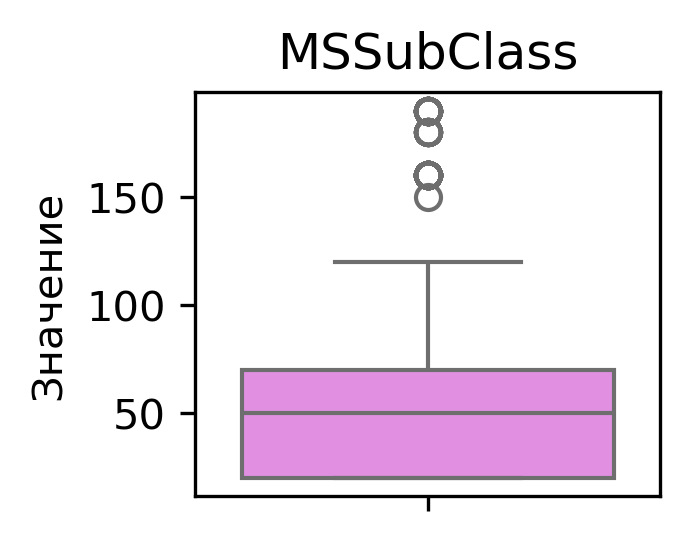

----------------------------------
count    2433.000000
mean       69.305795
std        23.344905
min        21.000000
25%        59.000000
50%        68.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64
----------------------------------


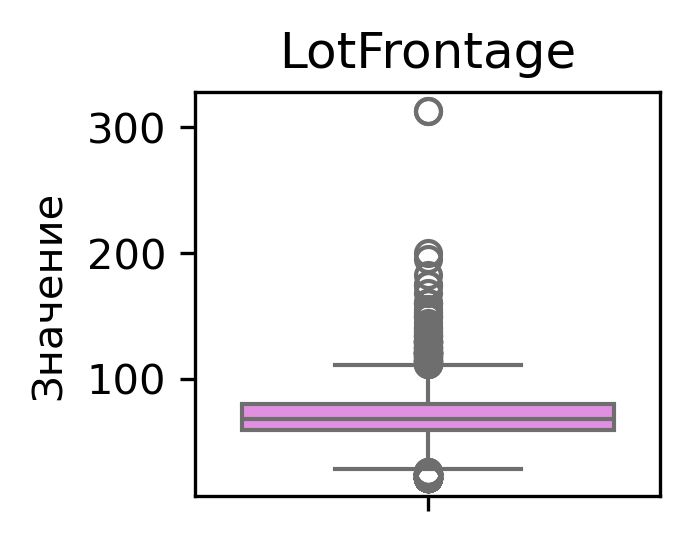

----------------------------------
count      2919.000000
mean      10168.114080
std        7886.996359
min        1300.000000
25%        7478.000000
50%        9453.000000
75%       11570.000000
max      215245.000000
Name: LotArea, dtype: float64
----------------------------------


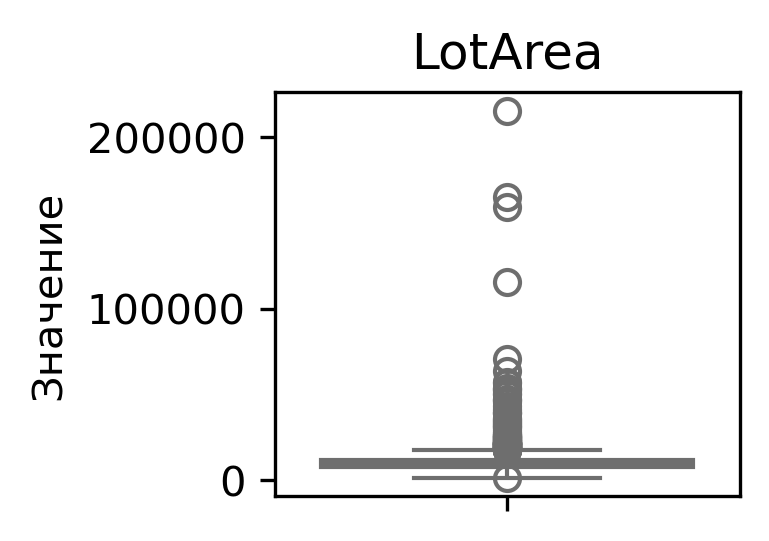

----------------------------------
count    2919.000000
mean        6.089072
std         1.409947
min         1.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        10.000000
Name: OverallQual, dtype: float64
----------------------------------


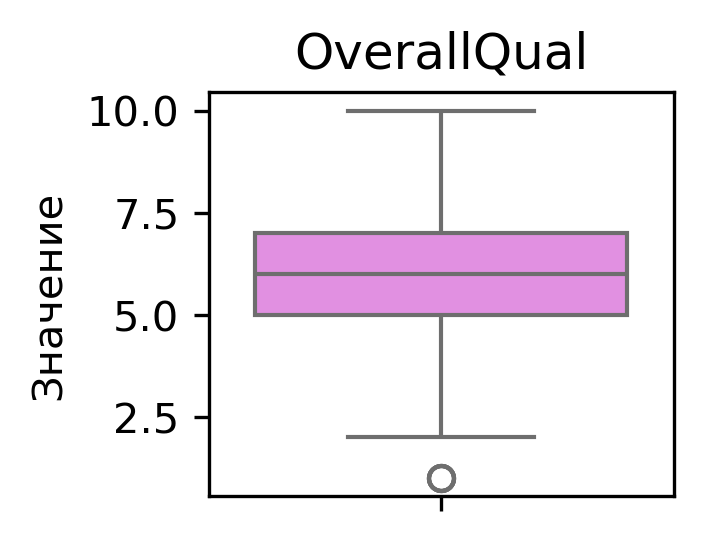

----------------------------------
count    2919.000000
mean        5.564577
std         1.113131
min         1.000000
25%         5.000000
50%         5.000000
75%         6.000000
max         9.000000
Name: OverallCond, dtype: float64
----------------------------------


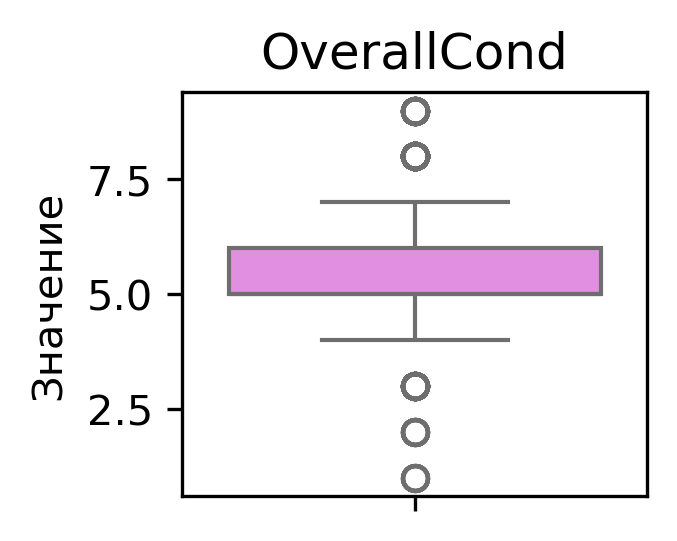

----------------------------------
count    2896.000000
mean      102.201312
std       179.334253
min         0.000000
25%         0.000000
50%         0.000000
75%       164.000000
max      1600.000000
Name: MasVnrArea, dtype: float64
----------------------------------


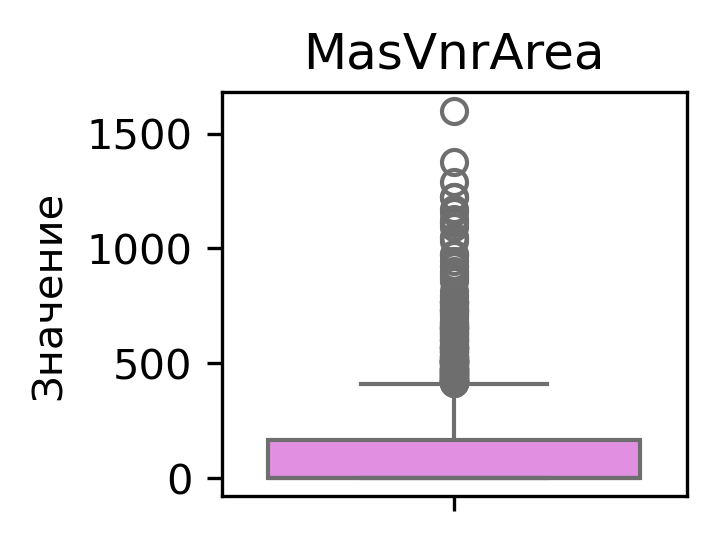

----------------------------------
count    2918.000000
mean      441.423235
std       455.610826
min         0.000000
25%         0.000000
50%       368.500000
75%       733.000000
max      5644.000000
Name: BsmtFinSF1, dtype: float64
----------------------------------


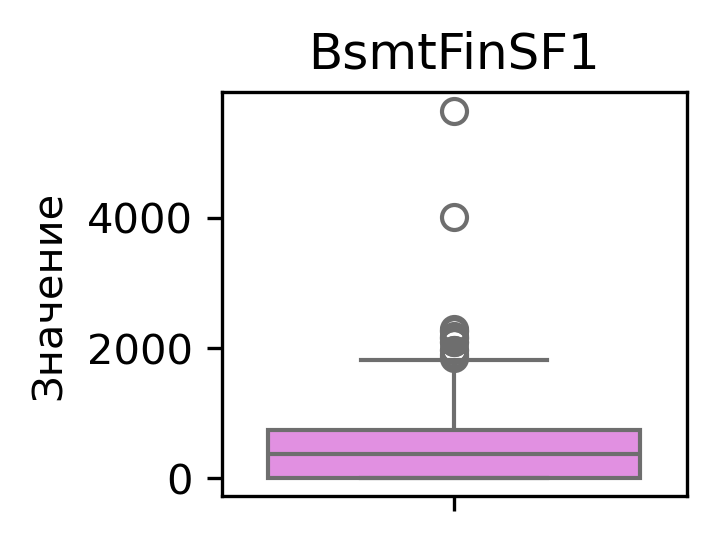

----------------------------------
count    2918.000000
mean       49.582248
std       169.205611
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1526.000000
Name: BsmtFinSF2, dtype: float64
----------------------------------


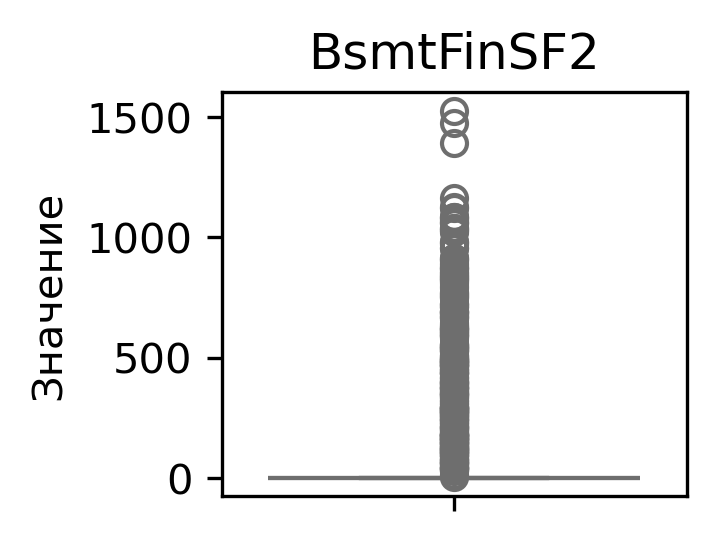

----------------------------------
count    2918.000000
mean      560.772104
std       439.543659
min         0.000000
25%       220.000000
50%       467.000000
75%       805.500000
max      2336.000000
Name: BsmtUnfSF, dtype: float64
----------------------------------


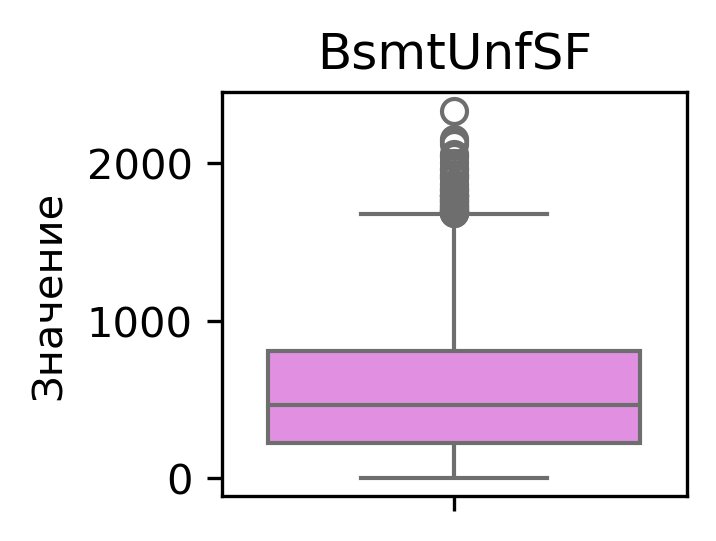

----------------------------------
count    2918.000000
mean     1051.777587
std       440.766258
min         0.000000
25%       793.000000
50%       989.500000
75%      1302.000000
max      6110.000000
Name: TotalBsmtSF, dtype: float64
----------------------------------


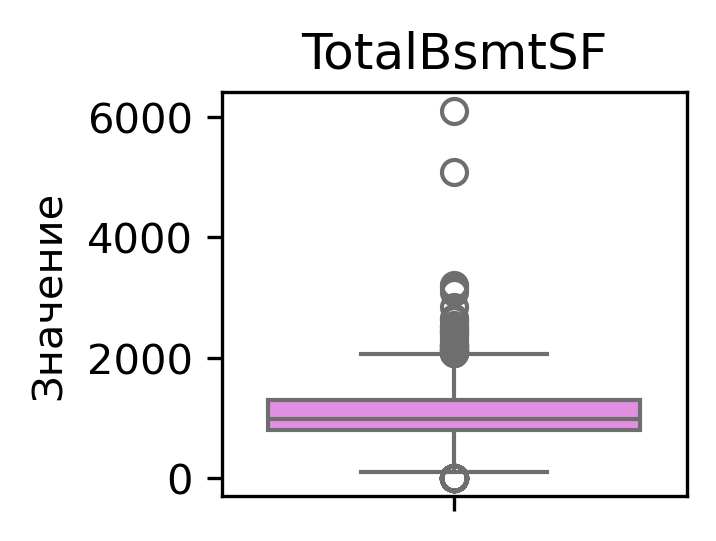

----------------------------------
count    2919.000000
mean     1159.581706
std       392.362079
min       334.000000
25%       876.000000
50%      1082.000000
75%      1387.500000
max      5095.000000
Name: 1stFlrSF, dtype: float64
----------------------------------


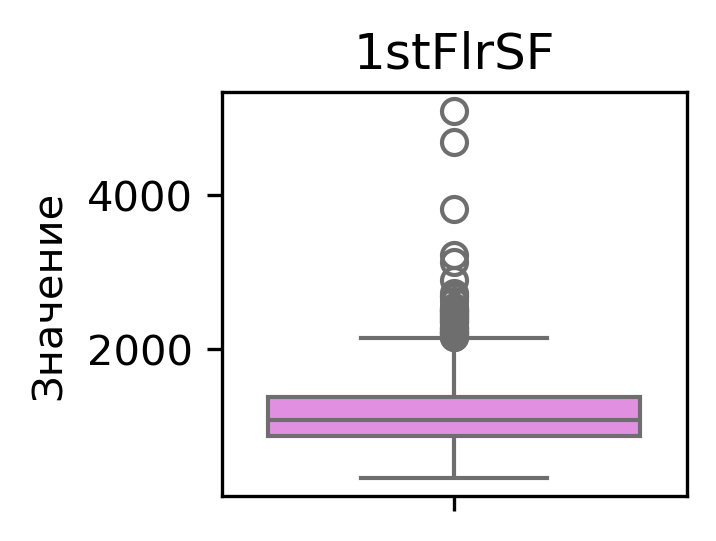

----------------------------------
count    2919.000000
mean      336.483727
std       428.701456
min         0.000000
25%         0.000000
50%         0.000000
75%       704.000000
max      2065.000000
Name: 2ndFlrSF, dtype: float64
----------------------------------


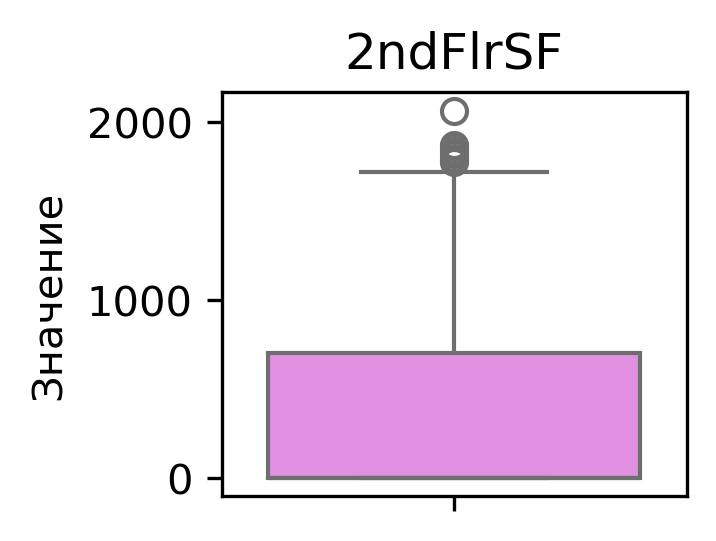

----------------------------------
count    2919.000000
mean        4.694416
std        46.396825
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1064.000000
Name: LowQualFinSF, dtype: float64
----------------------------------


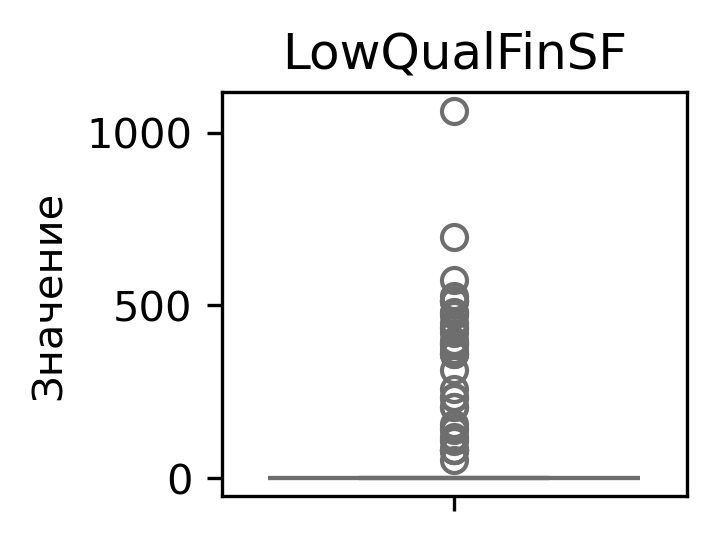

----------------------------------
count    2919.000000
mean     1500.759849
std       506.051045
min       334.000000
25%      1126.000000
50%      1444.000000
75%      1743.500000
max      5642.000000
Name: GrLivArea, dtype: float64
----------------------------------


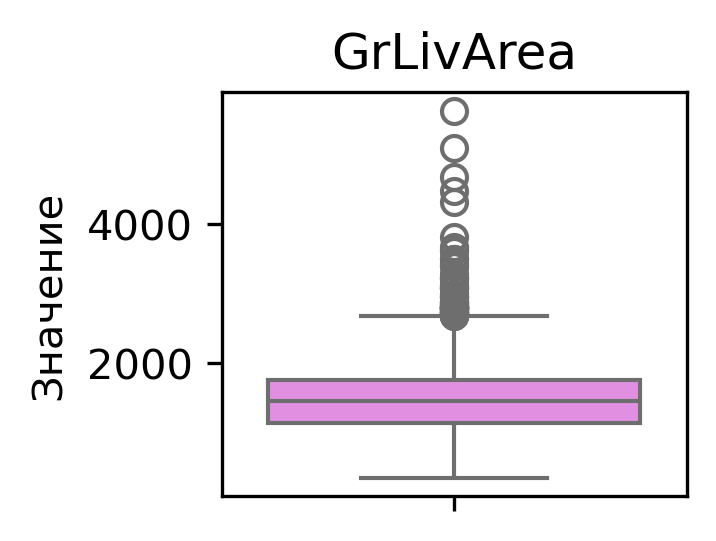

----------------------------------
count    2917.000000
mean        0.429894
std         0.524736
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         3.000000
Name: BsmtFullBath, dtype: float64
----------------------------------


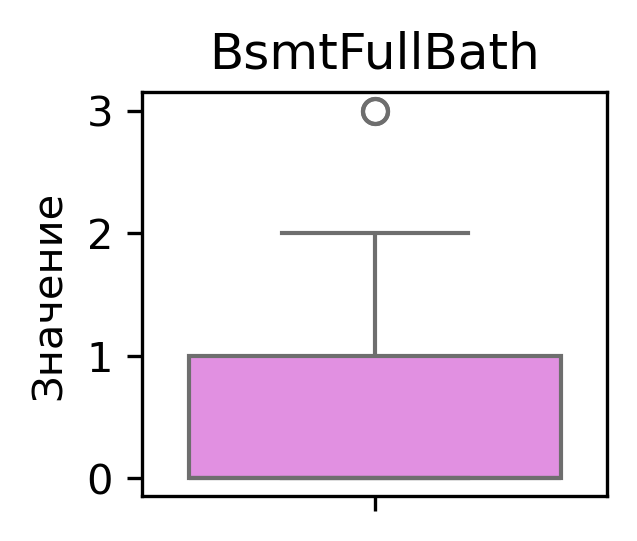

----------------------------------
count    2917.000000
mean        0.061364
std         0.245687
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         2.000000
Name: BsmtHalfBath, dtype: float64
----------------------------------


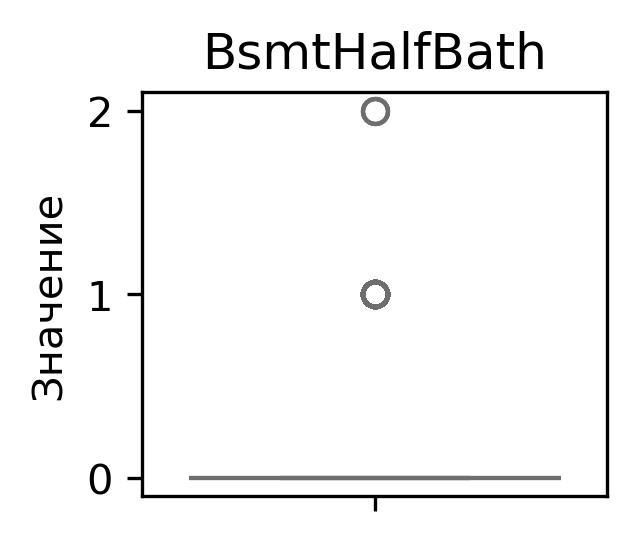

----------------------------------
count    2919.000000
mean        1.568003
std         0.552969
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         4.000000
Name: FullBath, dtype: float64
----------------------------------


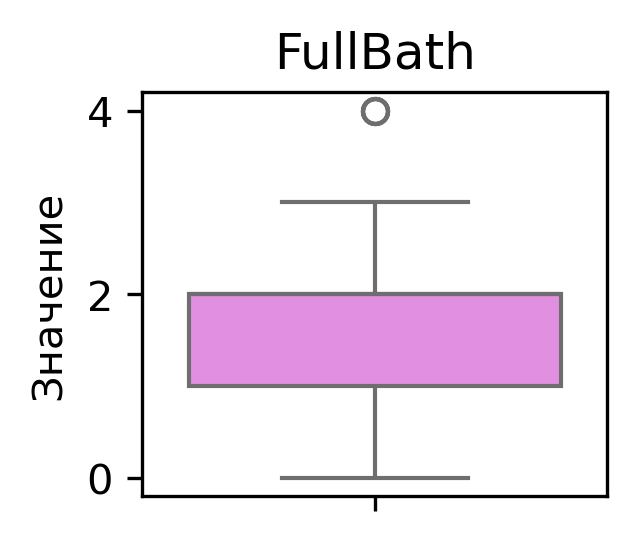

----------------------------------
count    2919.000000
mean        0.380267
std         0.502872
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: HalfBath, dtype: float64
----------------------------------


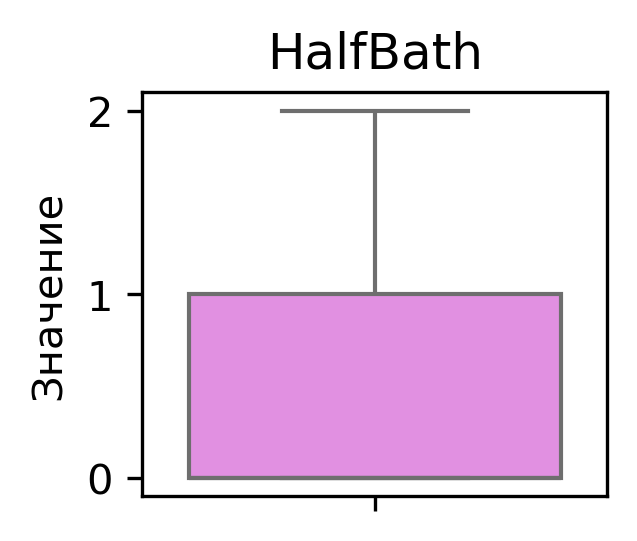

----------------------------------
count    2919.000000
mean        2.860226
std         0.822693
min         0.000000
25%         2.000000
50%         3.000000
75%         3.000000
max         8.000000
Name: BedroomAbvGr, dtype: float64
----------------------------------


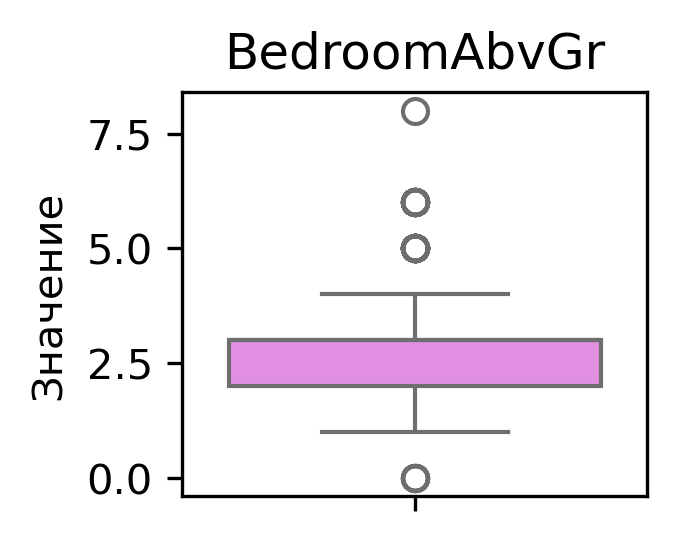

----------------------------------
count    2919.000000
mean        1.044536
std         0.214462
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         3.000000
Name: KitchenAbvGr, dtype: float64
----------------------------------


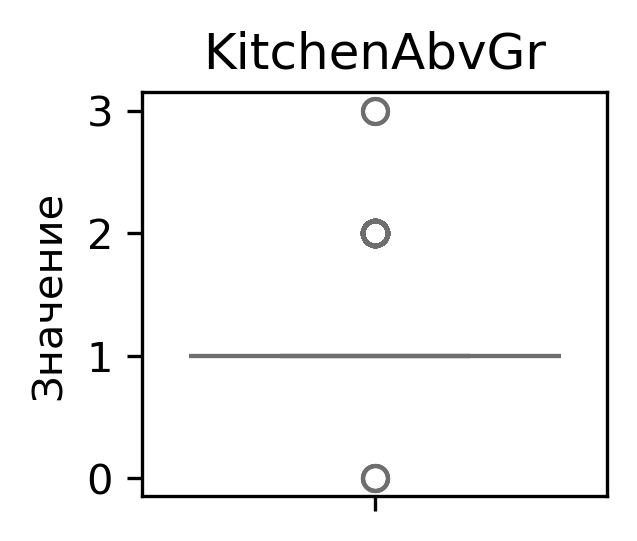

----------------------------------
count    2919.000000
mean        6.451524
std         1.569379
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        15.000000
Name: TotRmsAbvGrd, dtype: float64
----------------------------------


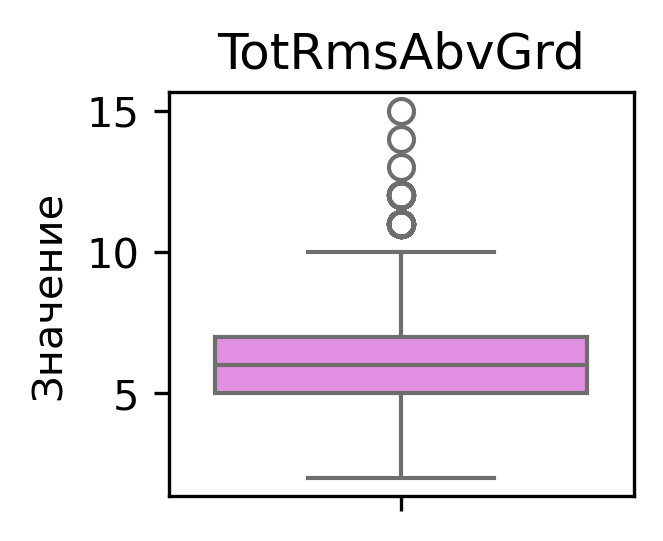

----------------------------------
count    2919.000000
mean        0.597122
std         0.646129
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         4.000000
Name: Fireplaces, dtype: float64
----------------------------------


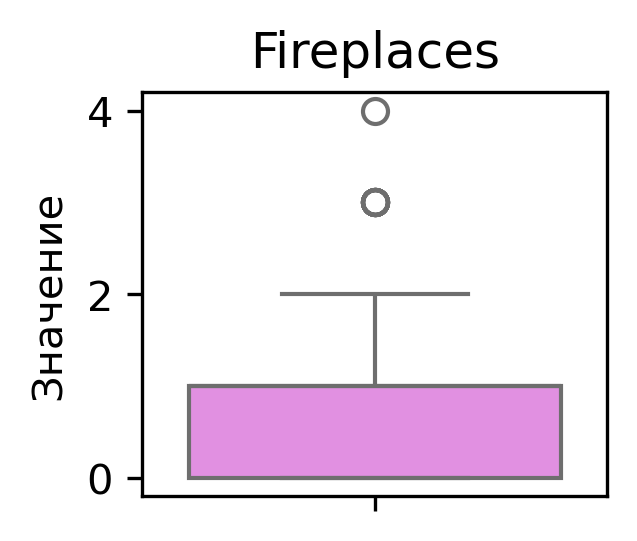

----------------------------------
count    2918.000000
mean        1.766621
std         0.761624
min         0.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         5.000000
Name: GarageCars, dtype: float64
----------------------------------


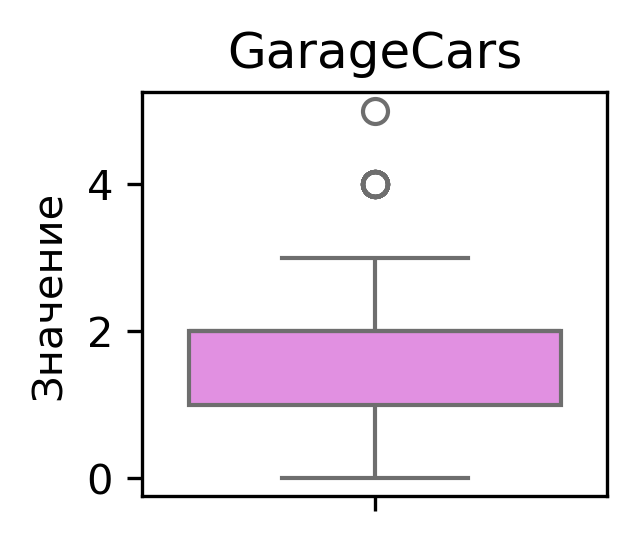

----------------------------------
count    2918.000000
mean      472.874572
std       215.394815
min         0.000000
25%       320.000000
50%       480.000000
75%       576.000000
max      1488.000000
Name: GarageArea, dtype: float64
----------------------------------


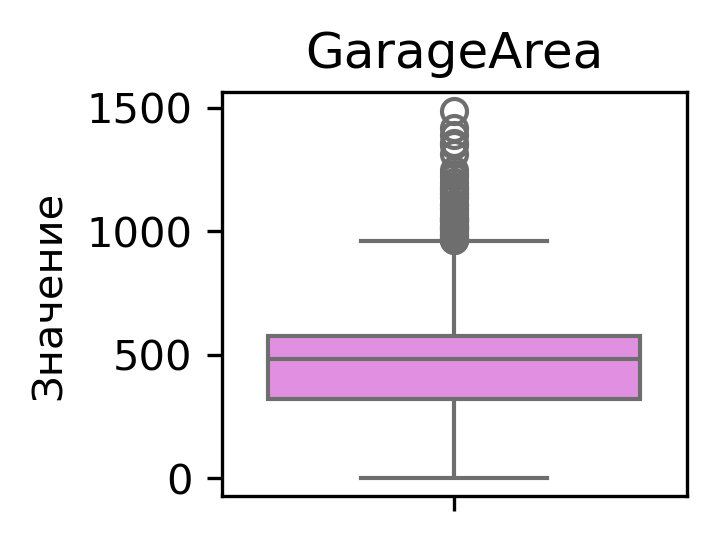

----------------------------------
count    2919.000000
mean       93.709832
std       126.526589
min         0.000000
25%         0.000000
50%         0.000000
75%       168.000000
max      1424.000000
Name: WoodDeckSF, dtype: float64
----------------------------------


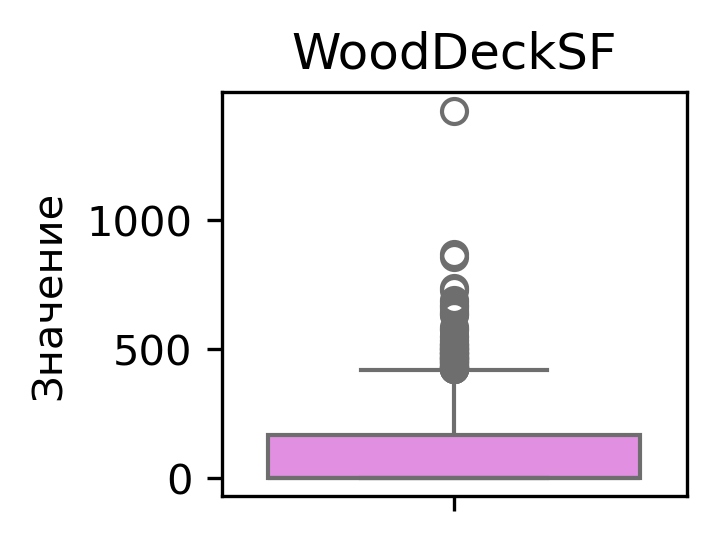

----------------------------------
count    2919.000000
mean       47.486811
std        67.575493
min         0.000000
25%         0.000000
50%        26.000000
75%        70.000000
max       742.000000
Name: OpenPorchSF, dtype: float64
----------------------------------


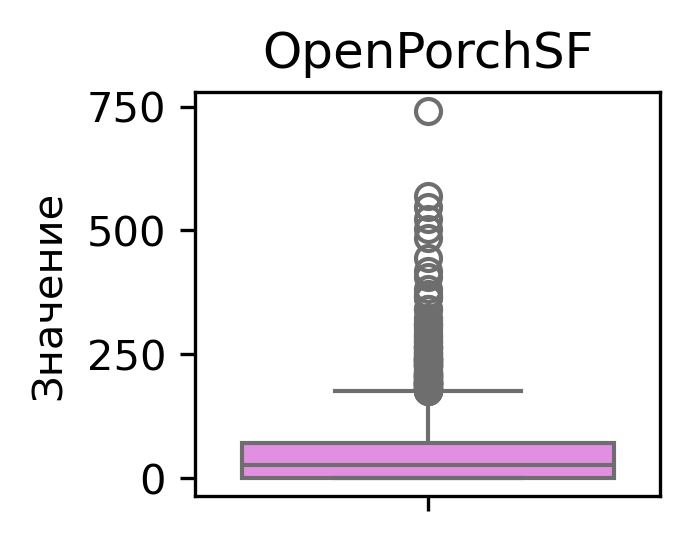

----------------------------------
count    2919.000000
mean       23.098321
std        64.244246
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      1012.000000
Name: EnclosedPorch, dtype: float64
----------------------------------


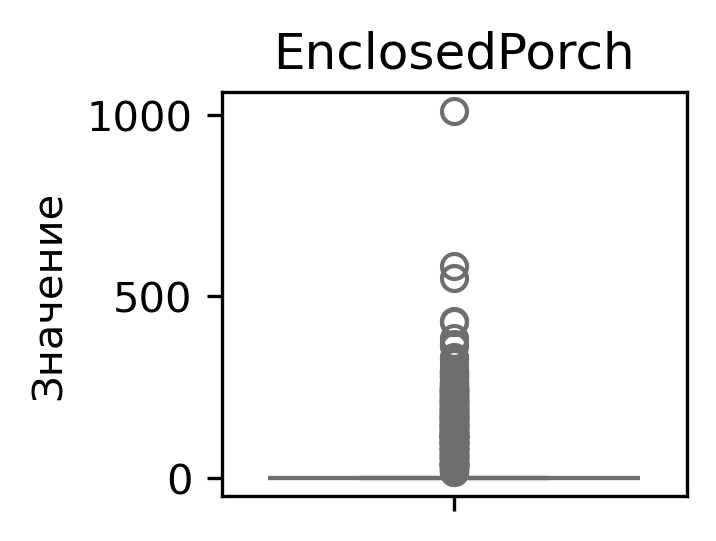

----------------------------------
count    2919.000000
mean        2.602261
std        25.188169
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       508.000000
Name: 3SsnPorch, dtype: float64
----------------------------------


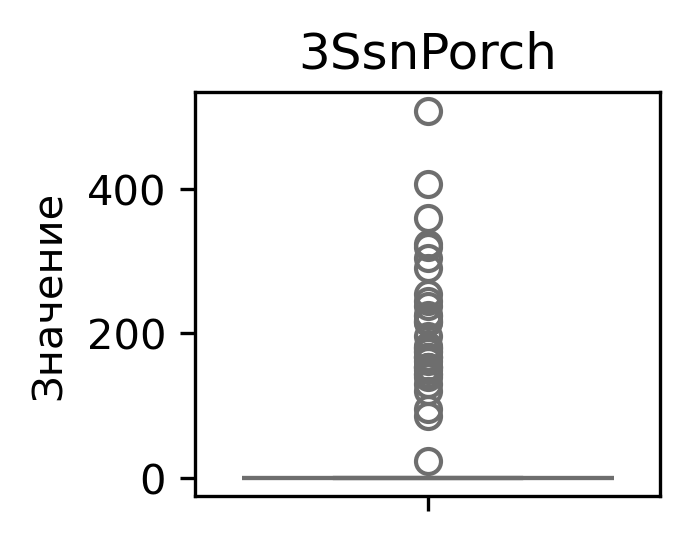

----------------------------------
count    2919.000000
mean       16.062350
std        56.184365
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       576.000000
Name: ScreenPorch, dtype: float64
----------------------------------


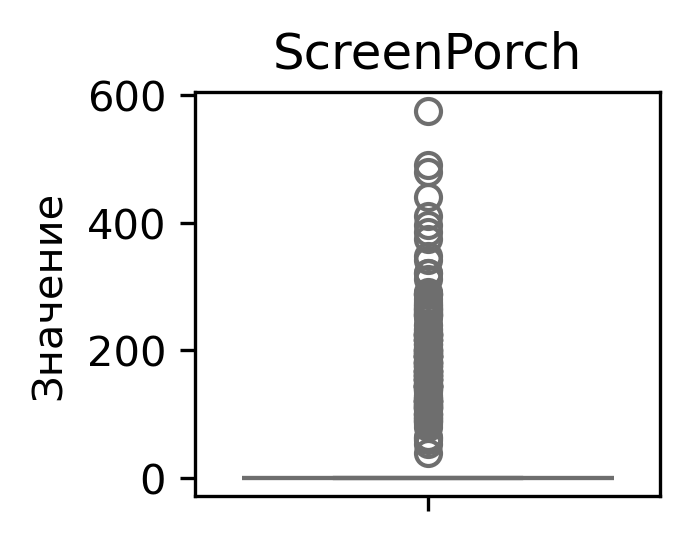

----------------------------------
count    2919.000000
mean        2.251799
std        35.663946
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max       800.000000
Name: PoolArea, dtype: float64
----------------------------------


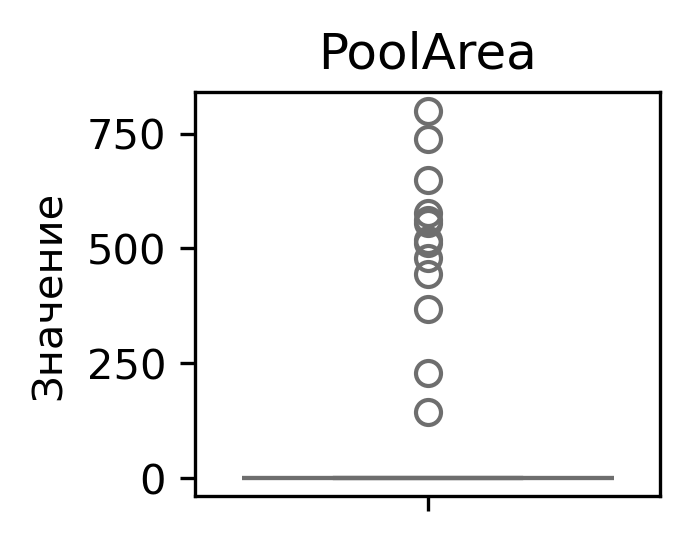

----------------------------------
count     2919.000000
mean        50.825968
std        567.402211
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      17000.000000
Name: MiscVal, dtype: float64
----------------------------------


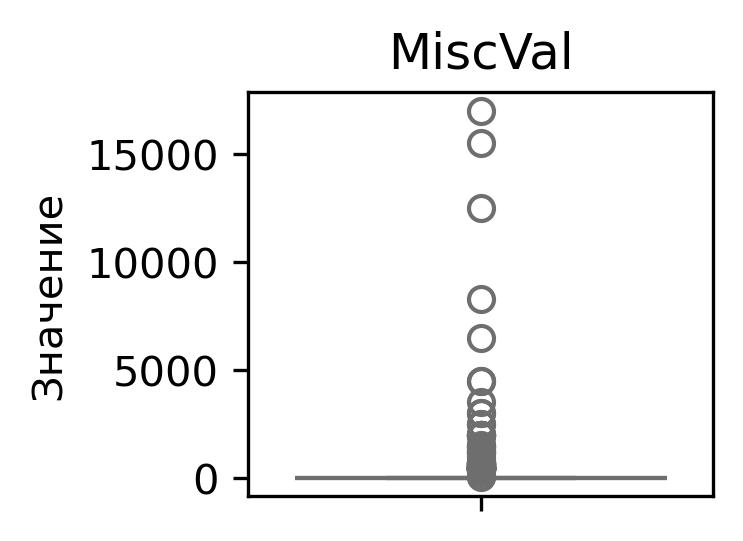

----------------------------------
count    2919.000000
mean       36.479959
std        30.336182
min        -1.000000
25%         7.000000
50%        35.000000
75%        54.500000
max       136.000000
Name: AgeConstruction, dtype: float64
----------------------------------


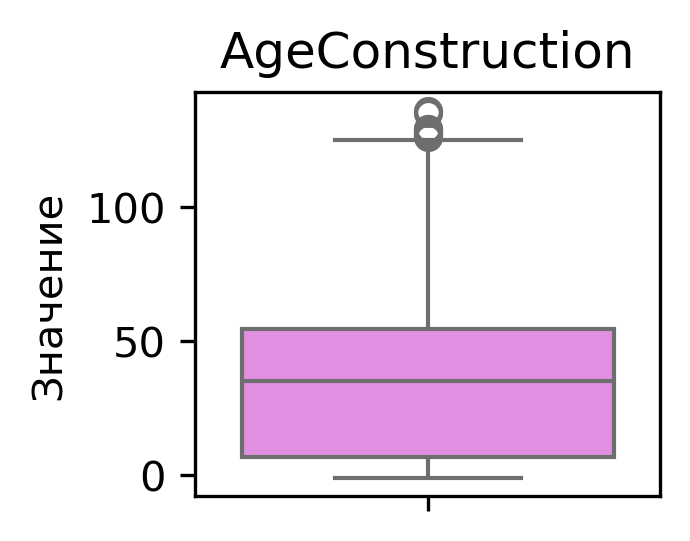

----------------------------------
count    2919.000000
mean       23.528263
std        20.892061
min        -2.000000
25%         4.000000
50%        15.000000
75%        43.000000
max        60.000000
Name: AgeLastRenovation, dtype: float64
----------------------------------


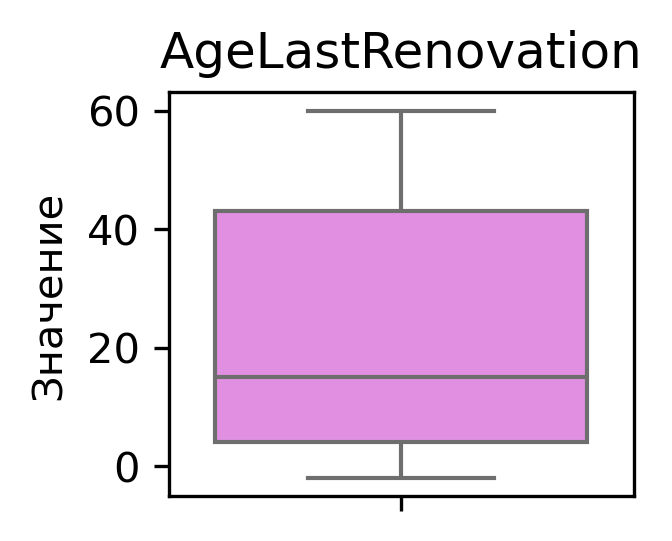

----------------------------------
count    2760.000000
mean       29.676087
std        25.613957
min      -200.000000
25%         6.000000
50%        29.000000
75%        48.000000
max       114.000000
Name: AgeGarage, dtype: float64
----------------------------------


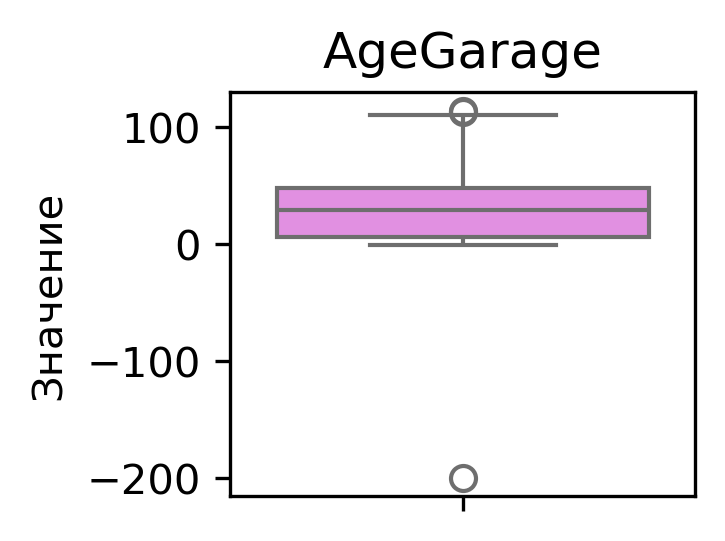

In [705]:
#Отрисуем ящики с усами
for col in df_num_columns.drop("SalePrice", axis=1).columns:
    drow_boxplot(df, col)
#Результат, все значения находятся в пределал нормы

In [706]:
#Функция, которая отрисовывает гистограмму распределений
def drow_barplot(data):
    fig = plt.figure(figsize=(5, 4), dpi=300)
    plt.title("График процентного соотношения пропусков")
    plt.ylabel("Процент пропусков")
    sns.barplot(data=data, palette="hls")
    plt.xticks(rotation=60)
    plt.show()

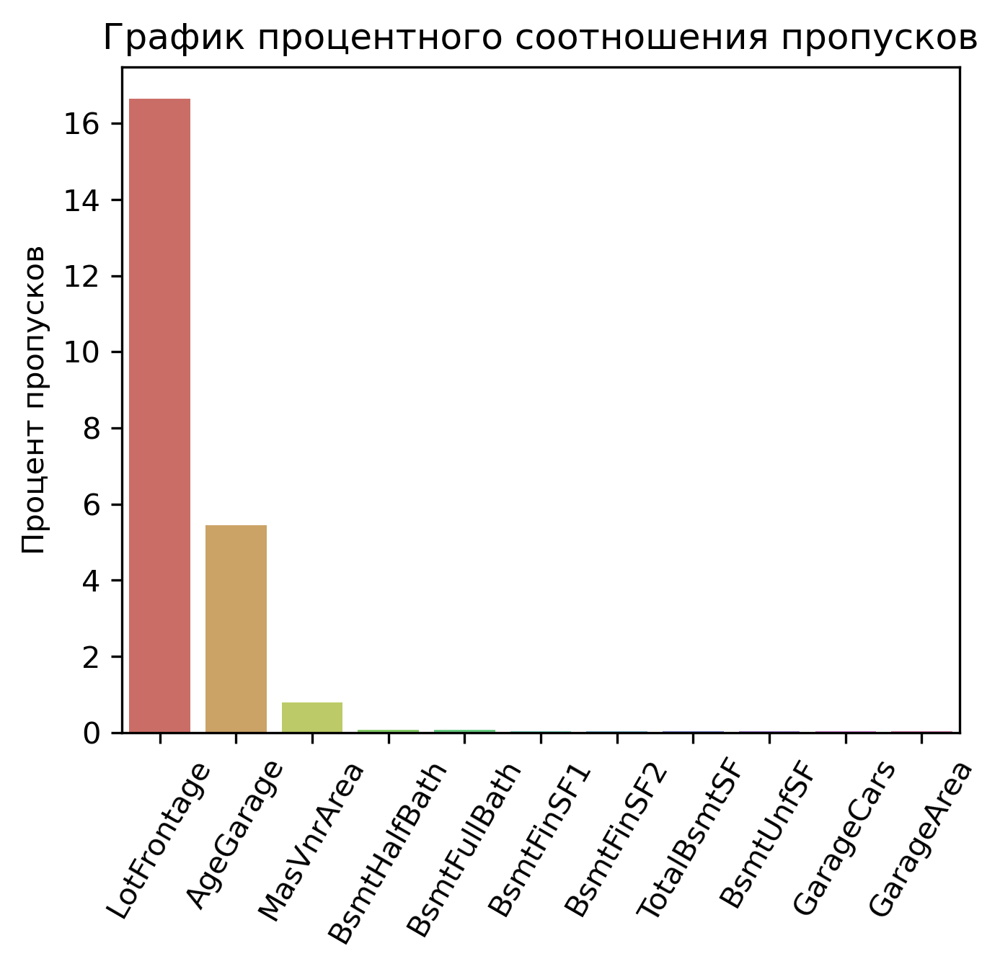

In [707]:
#Посмотрим на пропуски в данных 
is_null_col_normalize = pd.DataFrame({"Процент пропусков": np.round(df_num_columns.drop("SalePrice", axis=1).isna().sum() / len(df_num_columns) * 100, 3)})

is_null_col_normalize = is_null_col_normalize[is_null_col_normalize["Процент пропусков"]>0].sort_values(by="Процент пропусков", ascending=False)
drow_barplot(is_null_col_normalize["Процент пропусков"])

#### Результат
- Пропуски в данных есть, но исходя из документации, отсутсвие значения говорит, что какой-либо атрибут у дома отсутсвует, а не просто потеря данных

#### Стратегия заполнения пропусков
Попробовать 2 стратегии, после чего выбрать ту стратегию, которая лучше всего работает
- Заполнение пропусков с помощью KNN, так как процент пропусков не такой большой, выберем оптимальное количество соседей
- Заполнение пропусков нулем

In [708]:
#Для начала попробуем заполнить пропуски нулём
df_num_columns_copy = df_num_columns.copy()
for col in is_null_col_normalize.index.values:
    df_num_columns_copy[col].fillna(0, inplace=True)

split = KFold(n_splits=10, shuffle=True, random_state=42)
list_error = []
for train_index, val_index in split.split(X_notna):
    X_train, X_val = X_notna.iloc[train_index], X_notna.iloc[val_index]
    y_train, y_val = y_notna.iloc[train_index], y_notna.iloc[val_index]
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)

    model = Ridge()
    model.fit(X_train_scaled, y_train)

    predict = model.predict(X_val_scaled)
    list_error.append(MSE(y_val, model.predict(X_val_scaled)))
min_error_fill_zero = round(float(np.mean(np.array(list_error))), 3)
print(f"Ошибка в данных заполненая нулем: {min_error_fill_zero}")

Ошибка в данных заполненая нулем: 1413914583.256


In [709]:
#Получим колонки с очень маленьким и большим процентами пропусков
cols_min_fillna = is_null_col_normalize[(is_null_col_normalize["Процент пропусков"]>0) & (is_null_col_normalize["Процент пропусков"]<0.1)].index
cols_max_fillna = is_null_col_normalize[(is_null_col_normalize["Процент пропусков"]>0.1)].index

In [710]:
#Заполнение пропусков с маленьким процентов колонок
for col in cols_min_fillna:
    df_num_columns[col].fillna(df_num_columns[col].mean(), inplace=True)
print("Пропуски были успешно заполнены!")

Пропуски были успешно заполнены!


In [711]:
#Эксперимент, который подбирает оптимальное количество соседей для заполнения пропусков
split = KFold(n_splits=10, shuffle=True, random_state=42)
list_errors = []
for n_neighbor in range(2, 15):
    df_num_columns_copy = df_num_columns.copy()
    for col in cols_max_fillna:
        train_index, test_index = df_num_columns_copy[df_num_columns[col].notna()].index, df_num_columns_copy[df_num_columns_copy[col].isnull()].index
        X_train = df_num_columns_copy.drop(["LotFrontage", "AgeGarage", "MasVnrArea", "SalePrice"], axis=1).loc[train_index]
        y_train = df_num_columns_copy.loc[train_index][col]

        X_missing = df_num_columns_copy.drop(["LotFrontage", "AgeGarage", "MasVnrArea", "SalePrice"], axis=1).loc[test_index]

        fillna_model = KNeighborsRegressor(n_neighbors=n_neighbor)
        fillna_model.fit(X_train, y_train)
        
        df_num_columns_copy.loc[test_index, col] = fillna_model.predict(X_missing)

        
    X_notna = df_num_columns_copy[df_num_columns_copy["SalePrice"].notna()].drop("SalePrice", axis=1)
    y_notna = df_num_columns_copy[df_num_columns_copy["SalePrice"].notna()]["SalePrice"]
    list_error = []
    for train_index, val_index in split.split(X_notna):
        X_train, X_val = X_notna.iloc[train_index], X_notna.iloc[val_index]
        y_train, y_val = y_notna.iloc[train_index], y_notna.iloc[val_index]
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        model = Ridge()
        model.fit(X_train_scaled, y_train)

        predict = model.predict(X_val_scaled)
        list_error.append(MSE(y_val, model.predict(X_val_scaled)))
    list_errors.append(round(float(np.mean(np.array(list_error))), 3))

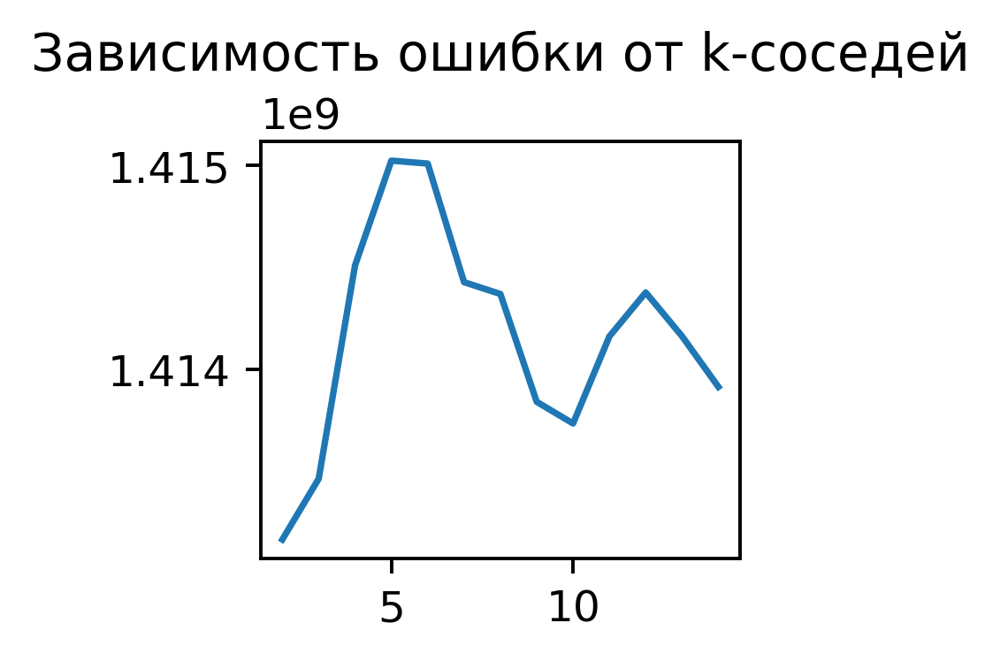

In [712]:
#График, который покажет зависимость соседей от ошибки базовой модели
fig = plt.figure(figsize=(2, 1.75), dpi=350)
plt.title("Зависимость ошибки от k-соседей")
plt.plot(list(range(2, 15)), list_errors)
plt.show()

In [713]:
print(f"Ошибка в данных заполненая нулем: {min_error_fill_zero}")
print(f"  Ошибка в данных заполненая KNN: {min(list_errors)}")
#Видно, что с помощью KNN ошибка стала немного меньше, тогда в качестве заполнения пропусков оставим KNN

Ошибка в данных заполненая нулем: 1413914583.256
  Ошибка в данных заполненая KNN: 1413166592.995


In [714]:
#Из график видно, что лучшее количество соседей k=2, хоть ошибка разница ошибки
for col in cols_max_fillna:
    train_index, test_index = df_num_columns[df_num_columns[col].notna()].index, df_num_columns[df_num_columns[col].isnull()].index
    X_train = df_num_columns.drop(["LotFrontage", "AgeGarage", "MasVnrArea", "SalePrice"], axis=1).loc[train_index]
    y_train = df_num_columns.loc[train_index][col]

    X_missing = df_num_columns.drop(["LotFrontage", "AgeGarage", "MasVnrArea", "SalePrice"], axis=1).loc[test_index]

    fillna_model = KNeighborsRegressor(n_neighbors=3)
    fillna_model.fit(X_train, y_train)
        
    df_num_columns.loc[test_index, col] = fillna_model.predict(X_missing)
print("Все пропуски были заполнены!")

Все пропуски были заполнены!


In [715]:
#Посморим суммарное количество пропусков
print(f"Суммарное количество пропусков: {df_num_columns.drop("SalePrice", axis=1).isna().sum().sum()}")

Суммарное количество пропусков: 0


In [716]:
#Посмотрим распределение вещественных колонок
def drow_histplot(df, col):
    print("----------------------------------")
    print(col)
    print(f"Ассиметрия равна: {df[col].skew()}")
    print(f"Эксцесс равен: {df[col].kurt()}")
    print("----------------------------------")
    fig = plt.figure(figsize=(2, 1.75), dpi=300)
    plt.title(col)
    plt.ylabel("Значение")
    sns.histplot(data=df, x=col, color="violet")
    plt.show()

----------------------------------
MSSubClass
Ассиметрия равна: 1.3761646373261713
Эксцесс равен: 1.4578274774335522
----------------------------------


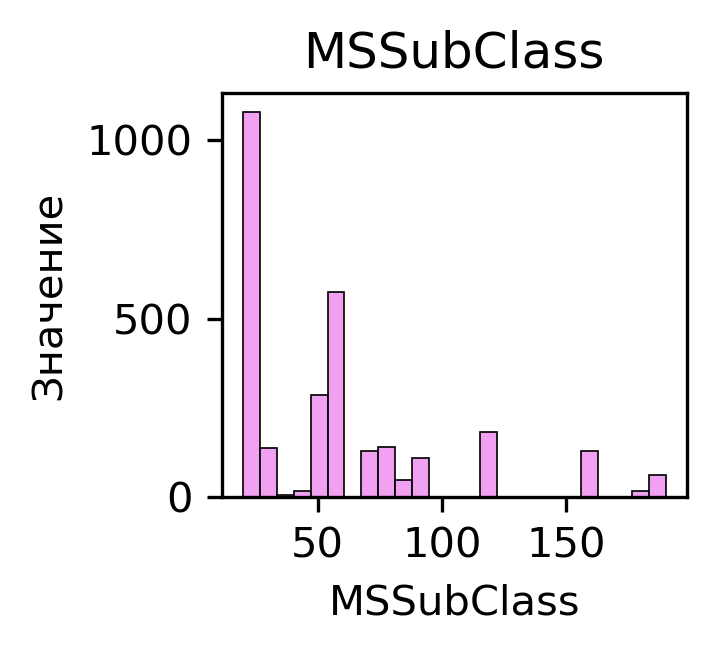

----------------------------------
LotFrontage
Ассиметрия равна: 1.3963226979432803
Эксцесс равен: 10.46989209642274
----------------------------------


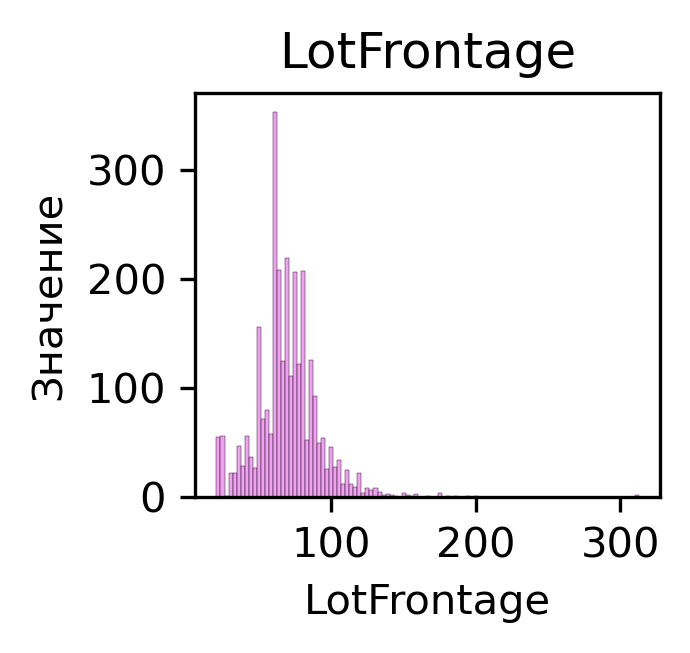

----------------------------------
LotArea
Ассиметрия равна: 12.829024853018762
Эксцесс равен: 264.95231013978935
----------------------------------


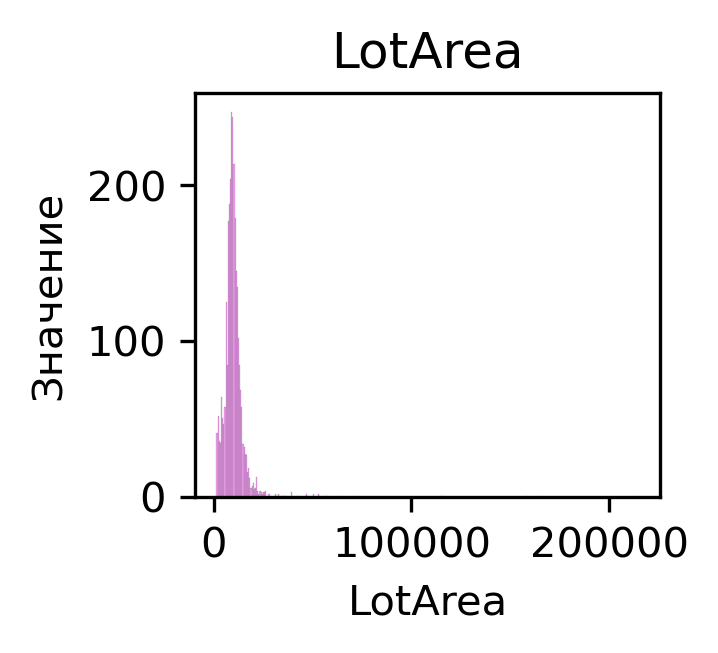

----------------------------------
OverallQual
Ассиметрия равна: 0.19721180528040133
Эксцесс равен: 0.06721935990514183
----------------------------------


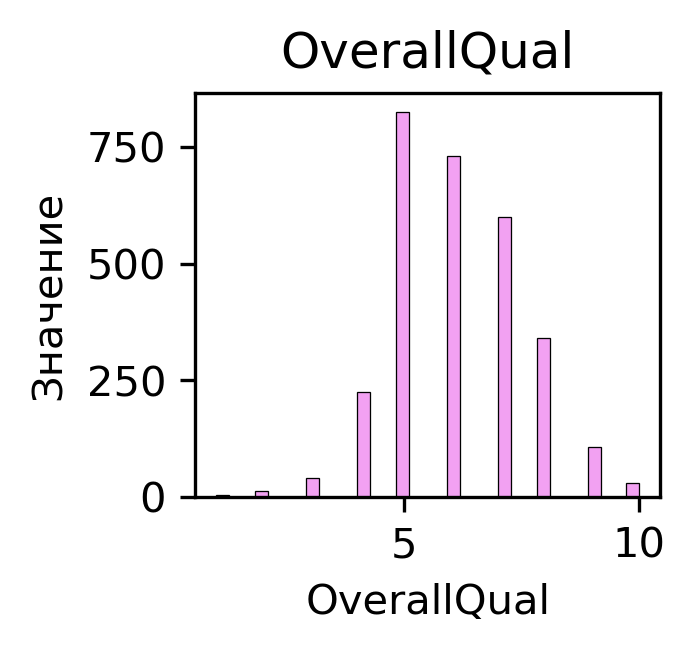

----------------------------------
OverallCond
Ассиметрия равна: 0.5706053117352524
Эксцесс равен: 1.4794473338247043
----------------------------------


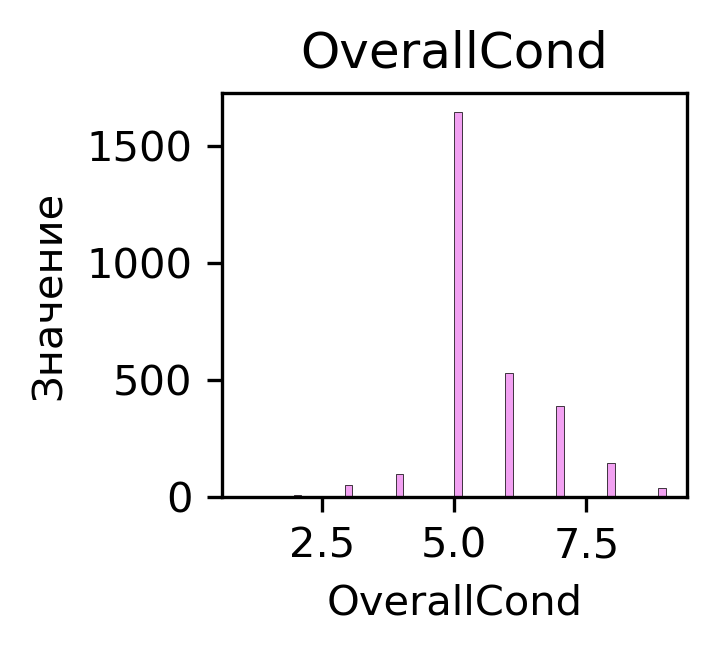

----------------------------------
MasVnrArea
Ассиметрия равна: 2.6021654014922486
Эксцесс равен: 9.278221189900812
----------------------------------


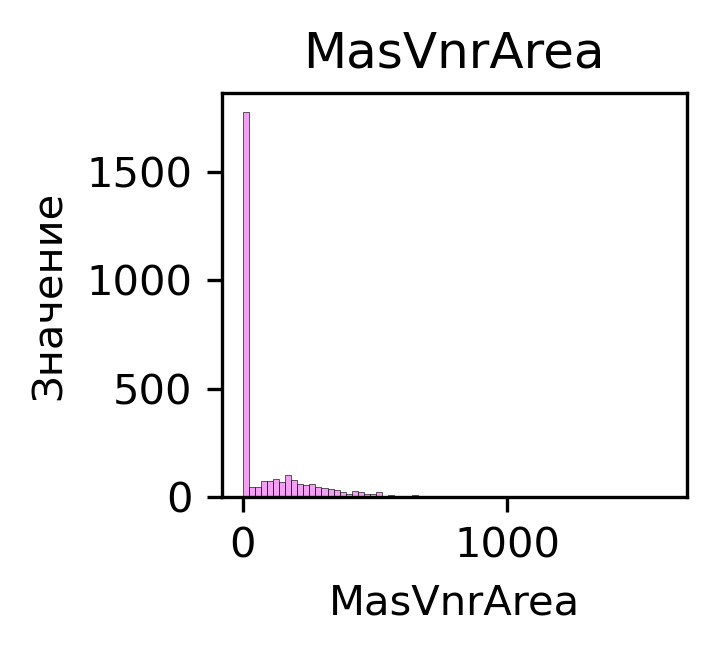

----------------------------------
BsmtFinSF1
Ассиметрия равна: 1.4259663133939777
Эксцесс равен: 6.9082227827048674
----------------------------------


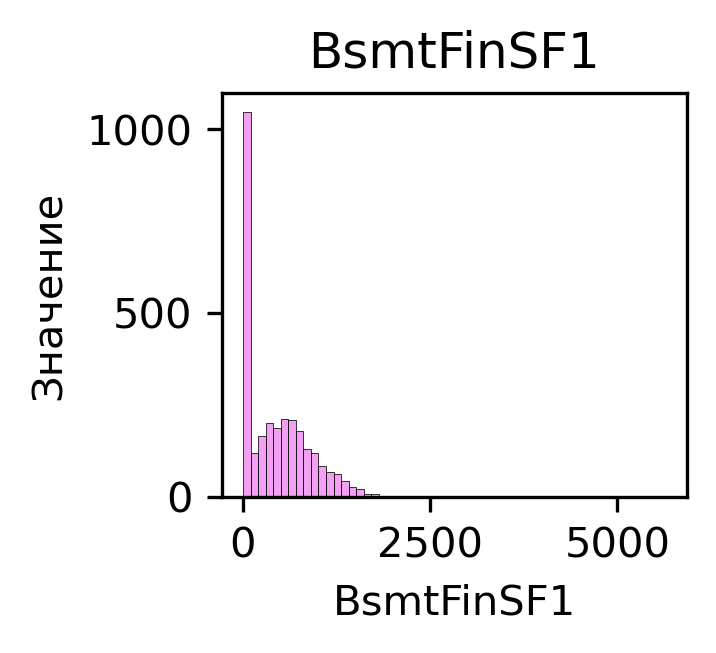

----------------------------------
BsmtFinSF2
Ассиметрия равна: 4.148165577295465
Эксцесс равен: 18.84401240631164
----------------------------------


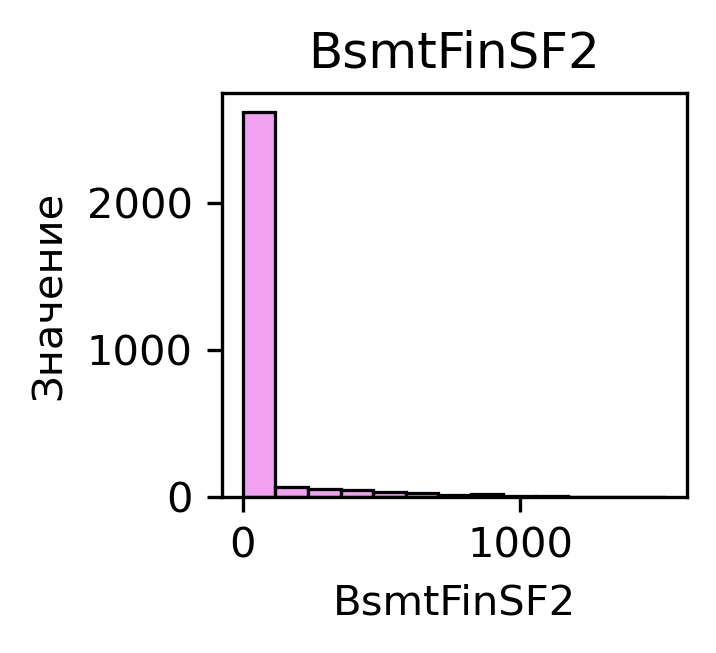

----------------------------------
BsmtUnfSF
Ассиметрия равна: 0.9199811341094662
Эксцесс равен: 0.4047834426600594
----------------------------------


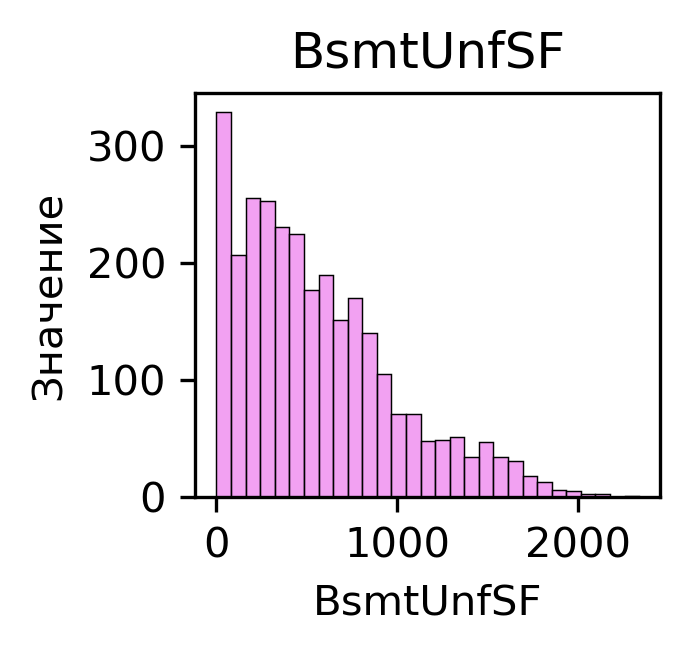

----------------------------------
TotalBsmtSF
Ассиметрия равна: 1.1630815127320877
Эксцесс равен: 9.155258353595077
----------------------------------


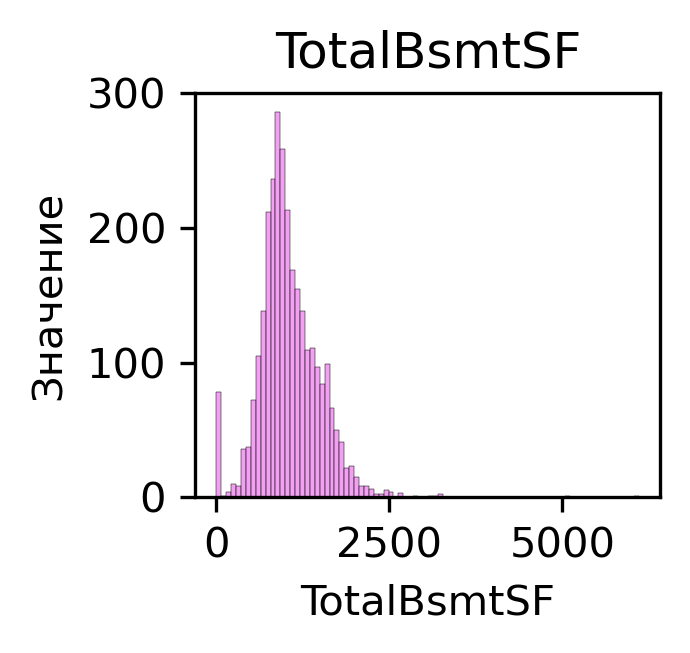

----------------------------------
1stFlrSF
Ассиметрия равна: 1.4703601055379227
Эксцесс равен: 6.956479038030847
----------------------------------


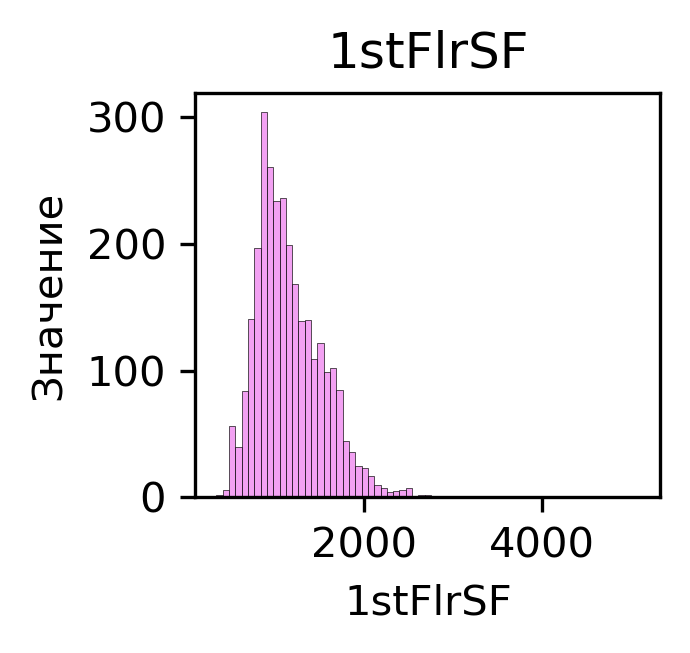

----------------------------------
2ndFlrSF
Ассиметрия равна: 0.8621178325657642
Эксцесс равен: -0.4222606698937579
----------------------------------


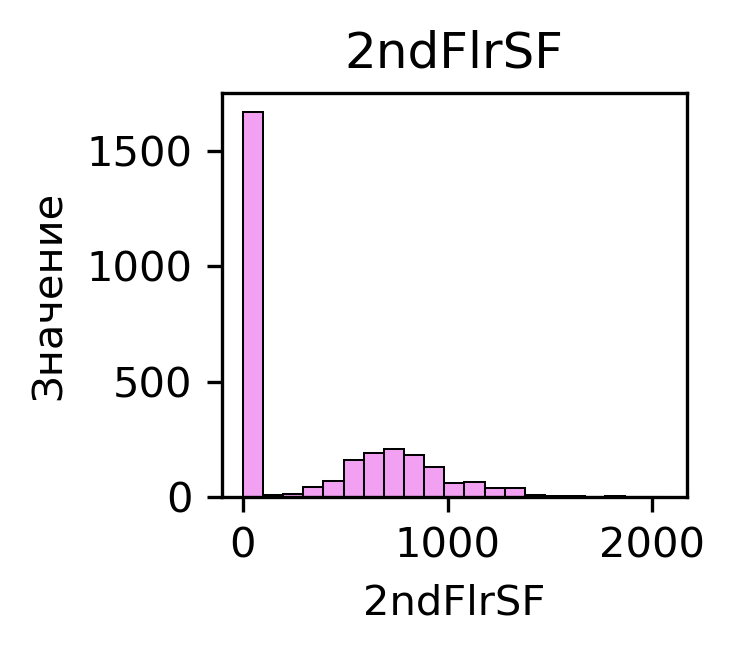

----------------------------------
LowQualFinSF
Ассиметрия равна: 12.094977192517302
Эксцесс равен: 174.93281241177277
----------------------------------


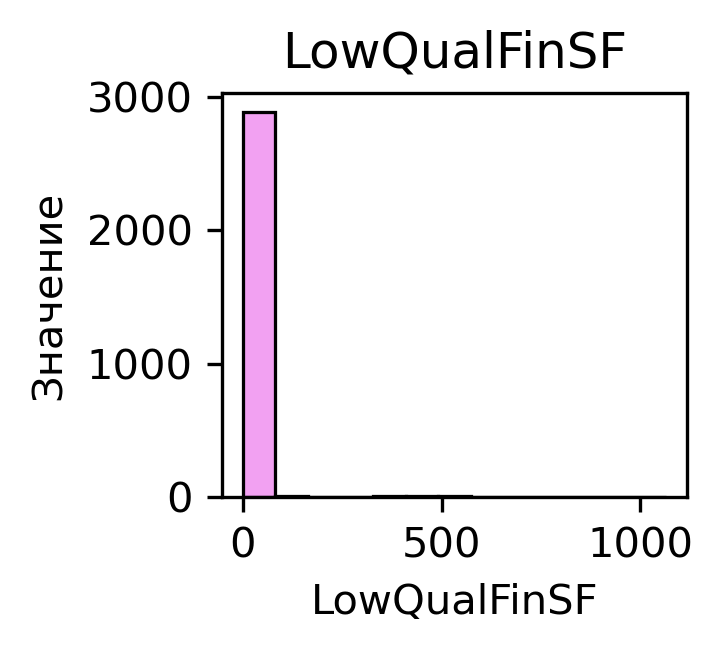

----------------------------------
GrLivArea
Ассиметрия равна: 1.2700104075191514
Эксцесс равен: 4.121603735289667
----------------------------------


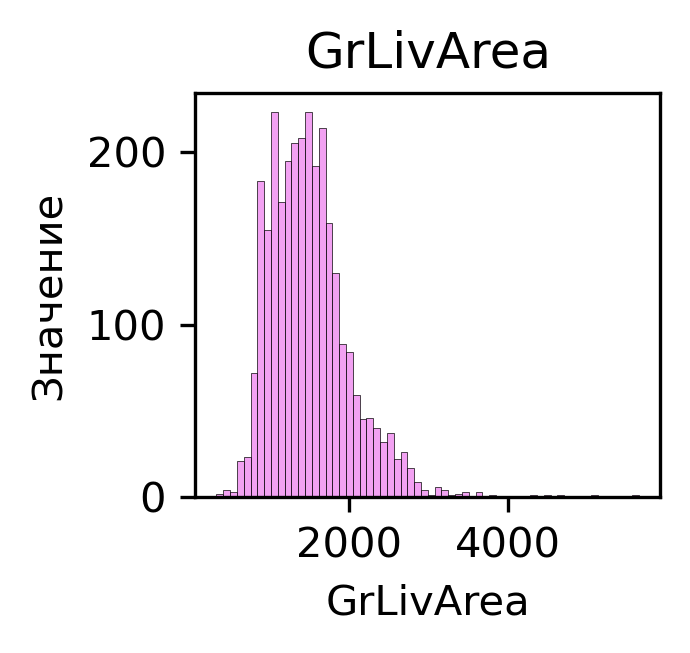

----------------------------------
BsmtFullBath
Ассиметрия равна: 0.6242758814822765
Эксцесс равен: -0.7341393834089489
----------------------------------


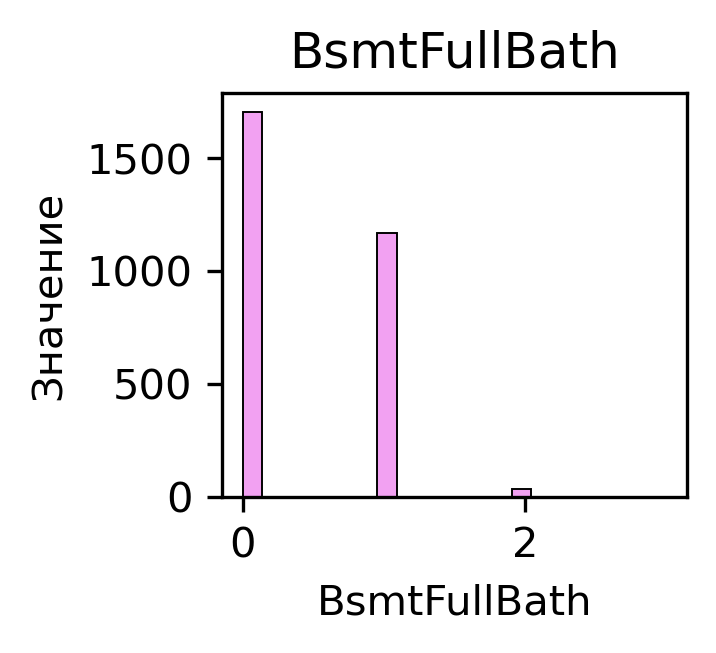

----------------------------------
BsmtHalfBath
Ассиметрия равна: 3.933364556433547
Эксцесс равен: 14.86029983527975
----------------------------------


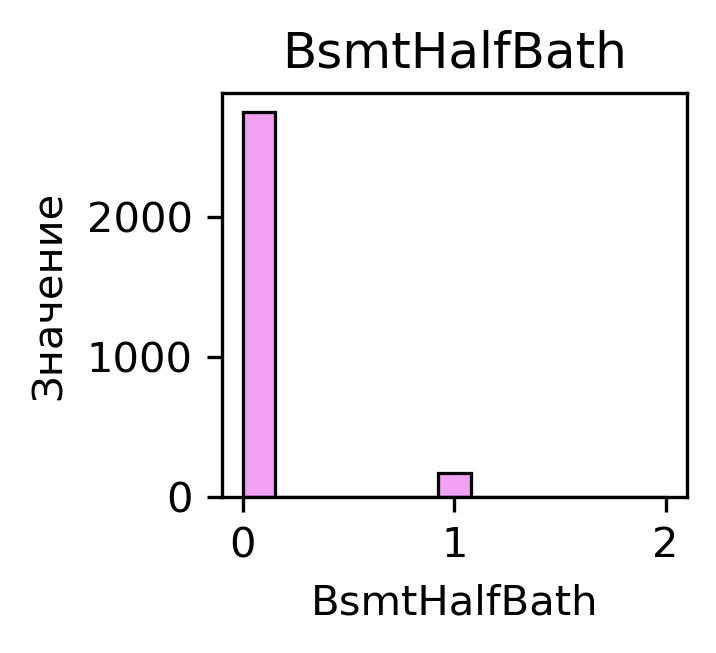

----------------------------------
FullBath
Ассиметрия равна: 0.16769191818882379
Эксцесс равен: -0.5381293607434401
----------------------------------


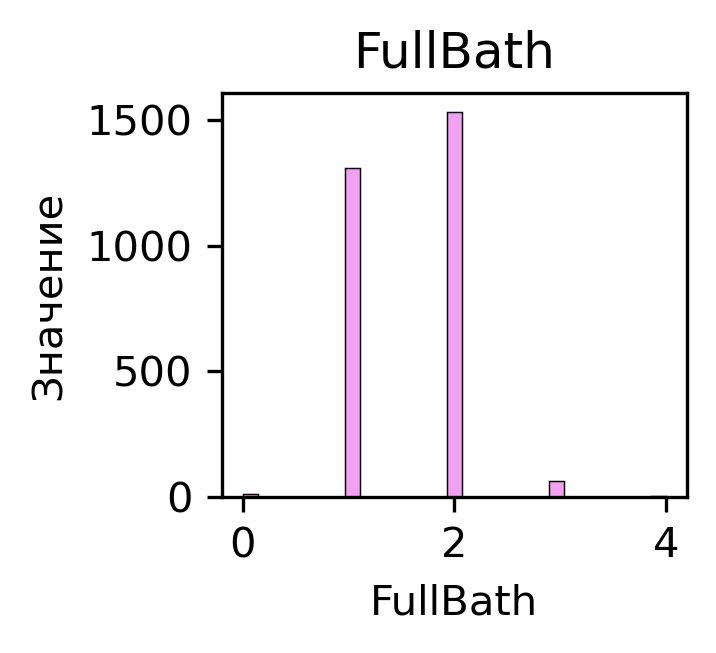

----------------------------------
HalfBath
Ассиметрия равна: 0.6949236492716564
Эксцесс равен: -1.0334464798987986
----------------------------------


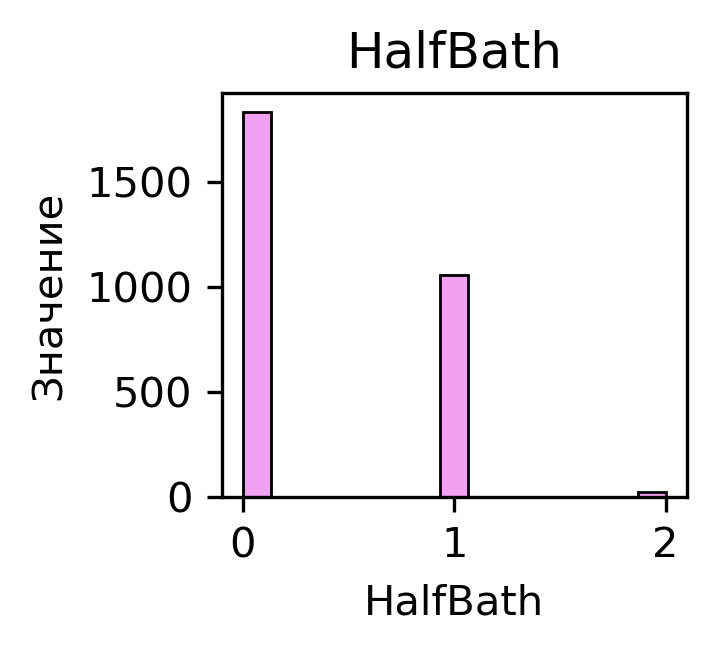

----------------------------------
BedroomAbvGr
Ассиметрия равна: 0.32649214927079917
Эксцесс равен: 1.9414037478968682
----------------------------------


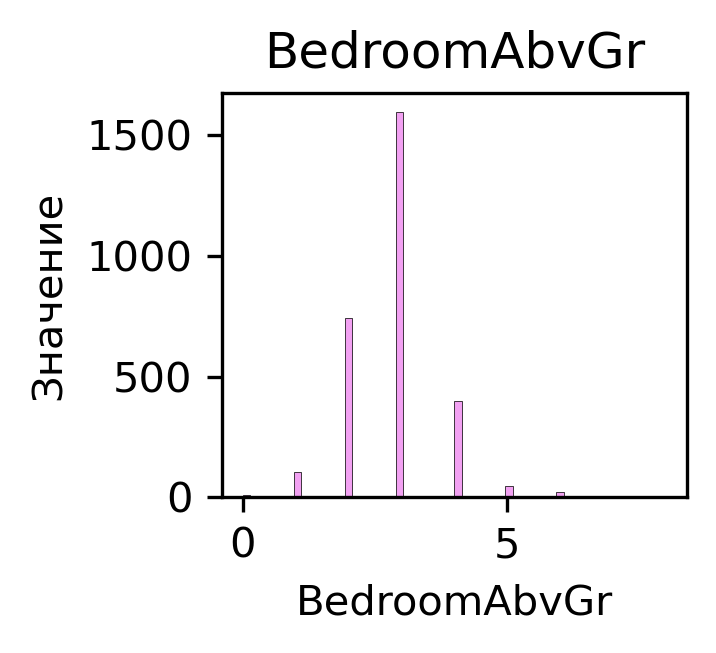

----------------------------------
KitchenAbvGr
Ассиметрия равна: 4.304466641562935
Эксцесс равен: 19.77793659070052
----------------------------------


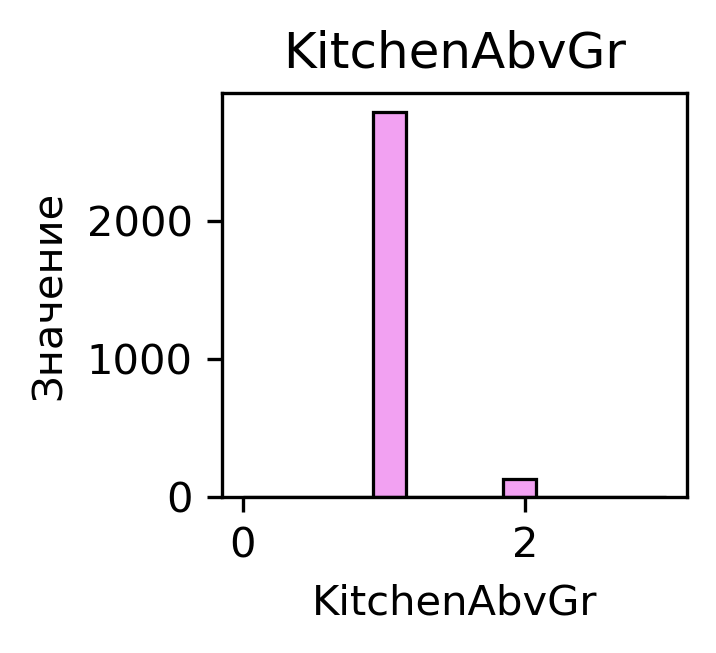

----------------------------------
TotRmsAbvGrd
Ассиметрия равна: 0.7587568676624701
Эксцесс равен: 1.169063585207879
----------------------------------


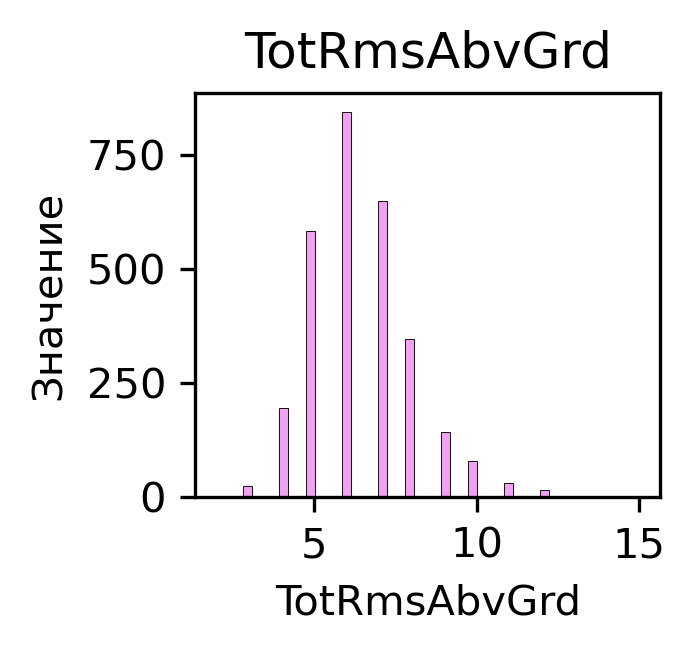

----------------------------------
Fireplaces
Ассиметрия равна: 0.733871770878103
Эксцесс равен: 0.07642384075687625
----------------------------------


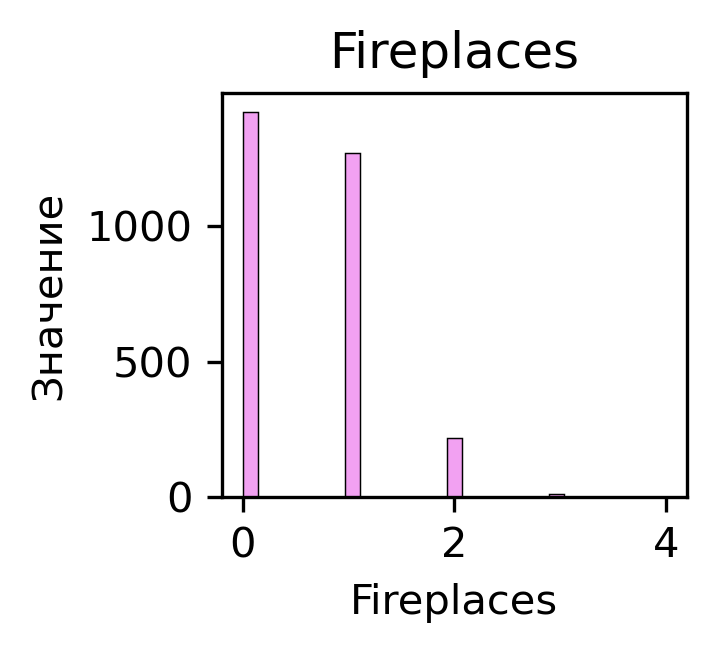

----------------------------------
GarageCars
Ассиметрия равна: -0.2184101430838651
Эксцесс равен: 0.2393077637476564
----------------------------------


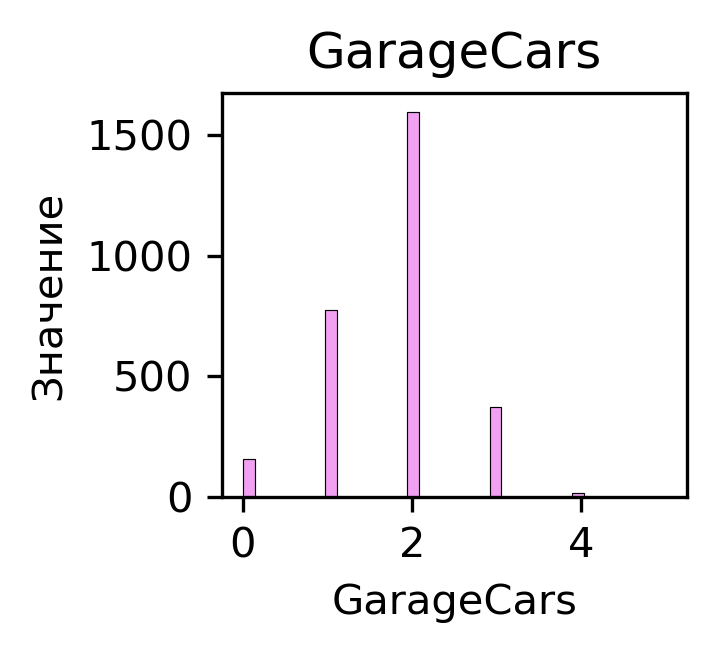

----------------------------------
GarageArea
Ассиметрия равна: 0.24134181815803954
Эксцесс равен: 0.9411328710919817
----------------------------------


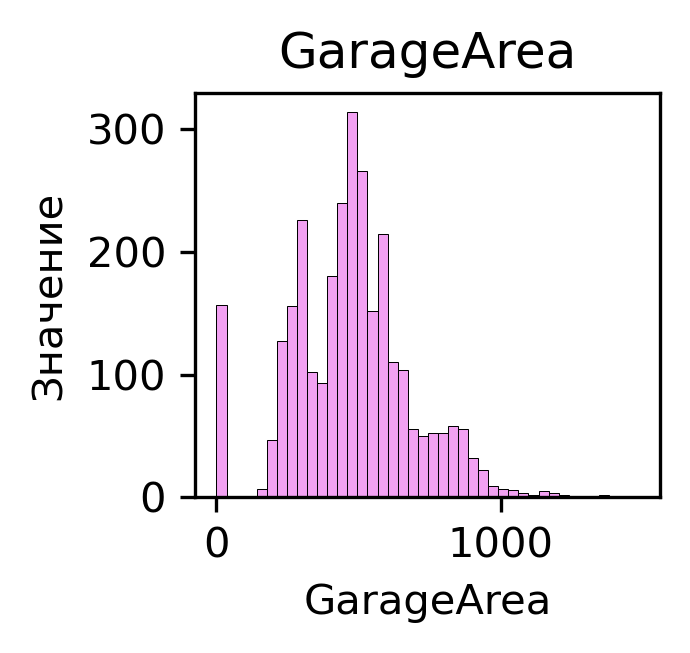

----------------------------------
WoodDeckSF
Ассиметрия равна: 1.8433802126628294
Эксцесс равен: 6.741550189823774
----------------------------------


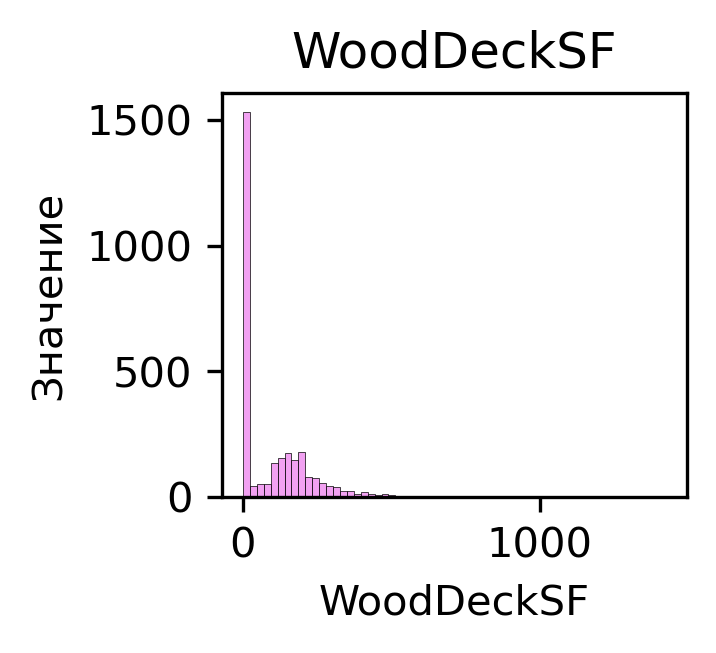

----------------------------------
OpenPorchSF
Ассиметрия равна: 2.5364173160468444
Эксцесс равен: 10.937352524991375
----------------------------------


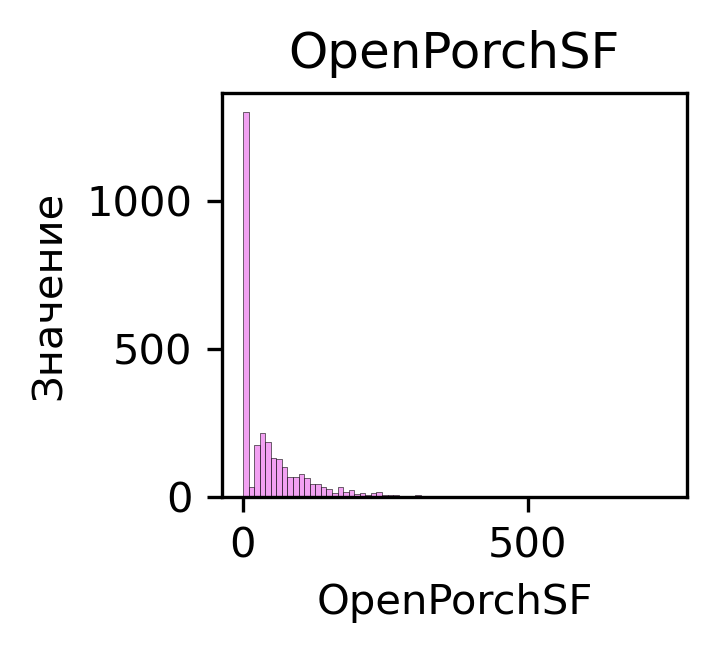

----------------------------------
EnclosedPorch
Ассиметрия равна: 4.005950070504265
Эксцесс равен: 28.377908922009446
----------------------------------


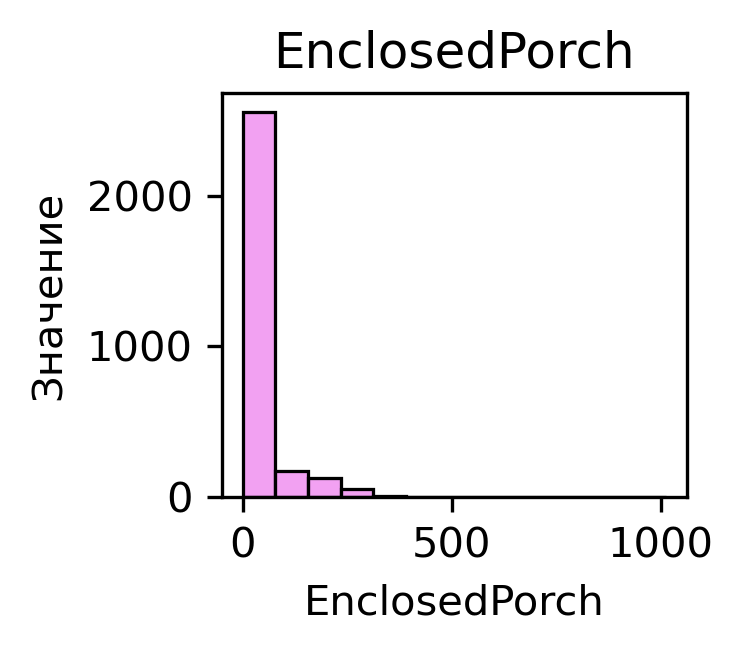

----------------------------------
3SsnPorch
Ассиметрия равна: 11.381914394786643
Эксцесс равен: 149.4098342664387
----------------------------------


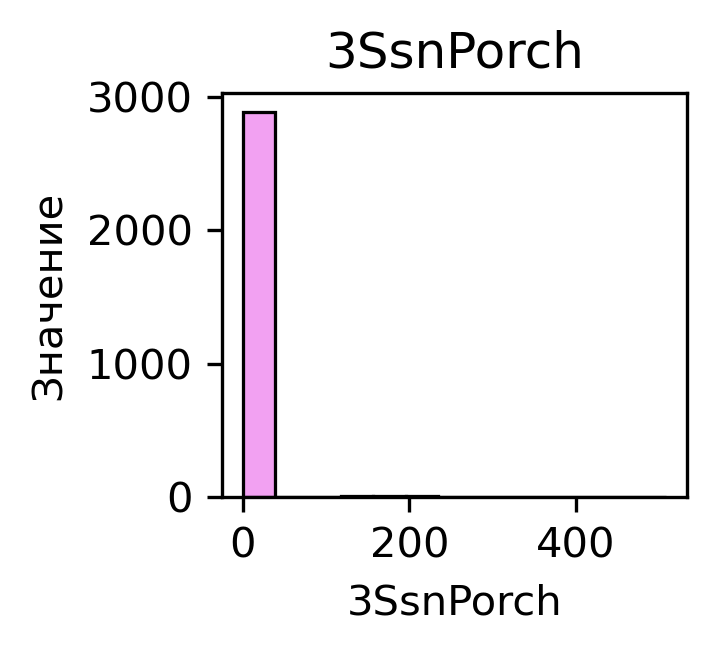

----------------------------------
ScreenPorch
Ассиметрия равна: 3.948723141292199
Эксцесс равен: 17.77670360587794
----------------------------------


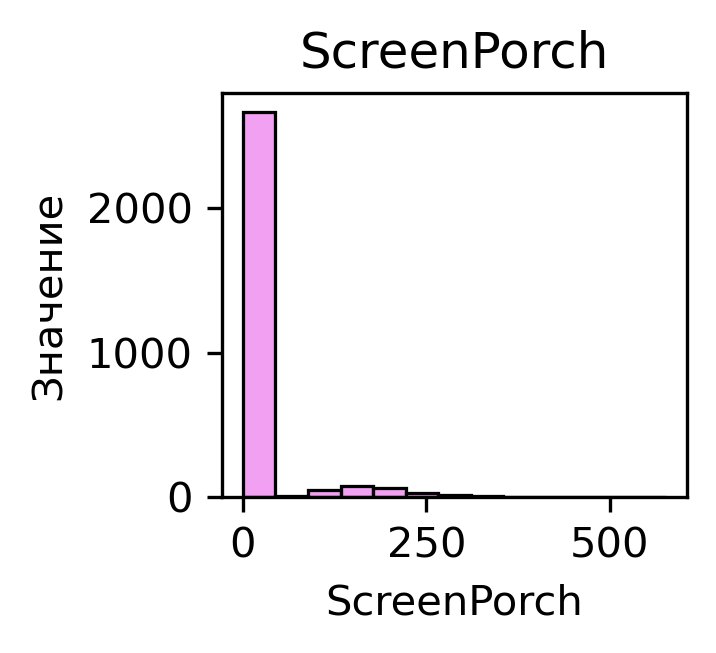

----------------------------------
PoolArea
Ассиметрия равна: 16.9070172435751
Эксцесс равен: 298.6331435760181
----------------------------------


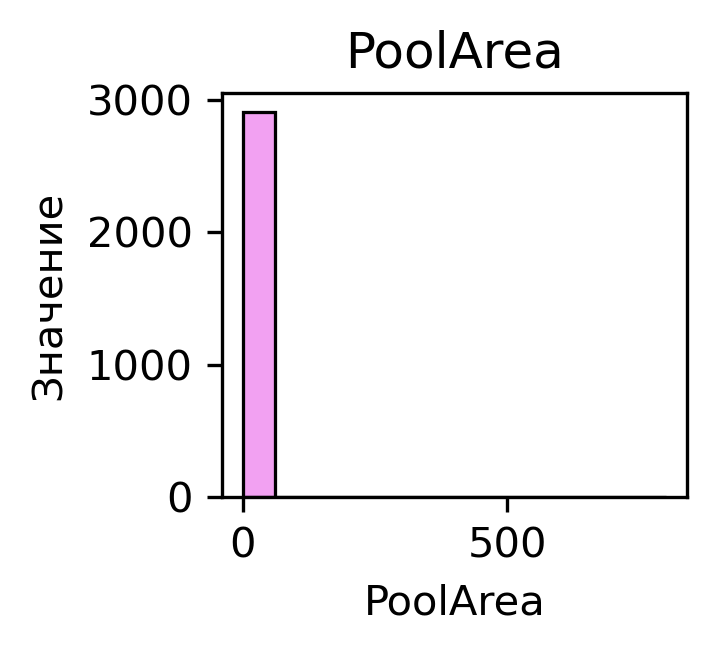

----------------------------------
MiscVal
Ассиметрия равна: 21.958480324447216
Эксцесс равен: 564.0745817668892
----------------------------------


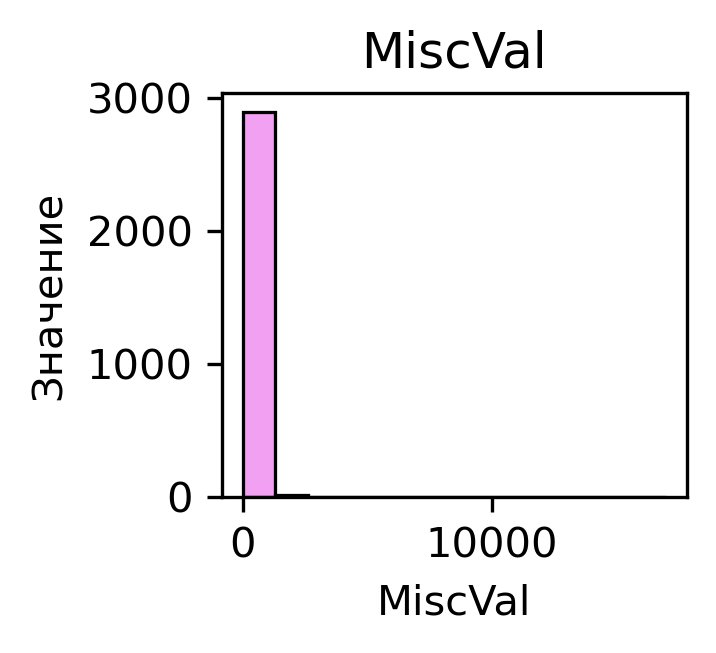

----------------------------------
AgeConstruction
Ассиметрия равна: 0.5989172094419118
Эксцесс равен: -0.50288668706941
----------------------------------


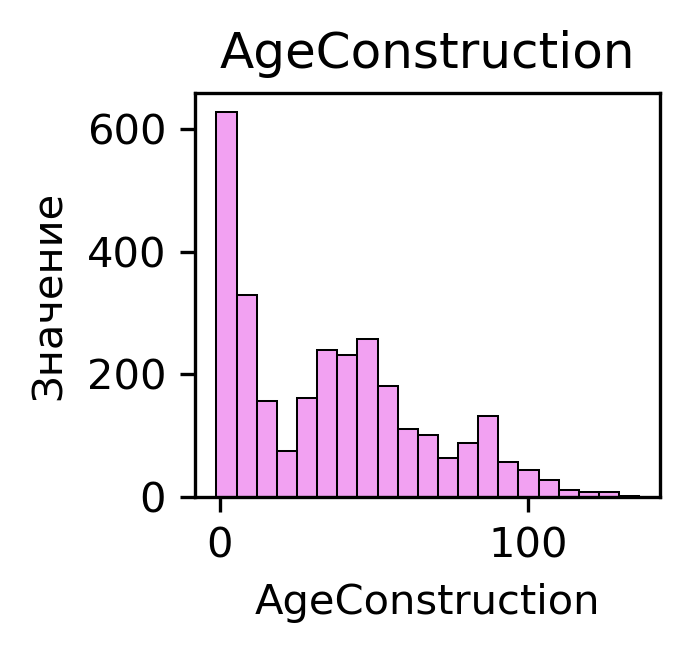

----------------------------------
AgeLastRenovation
Ассиметрия равна: 0.45045772488857305
Эксцесс равен: -1.3379412822582566
----------------------------------


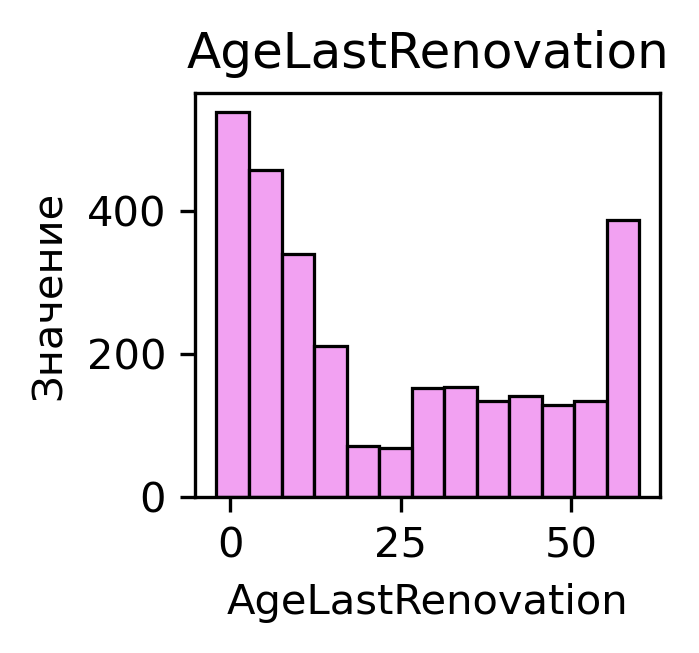

----------------------------------
AgeGarage
Ассиметрия равна: 0.3163146262343943
Эксцесс равен: 1.588165011110207
----------------------------------


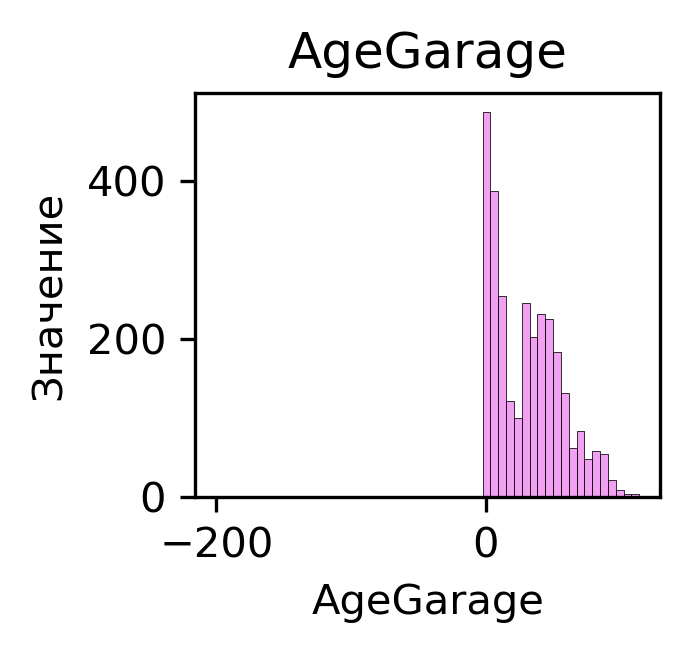

In [717]:
for col in df_num_columns.drop("SalePrice", axis=1).columns:
    drow_histplot(df_num_columns, col)

In [718]:
#Запишем колонки, которых потенцильано нужно логарифмирование, если конечно будем использовать линейнную модель
potencial_log_cols = ["LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", "TotalBsmtSF", "1stFlrSF", "OpenPorchSF"]

In [719]:
#Посмотрим попарную корреляция между колонками
fig = plt.figure(figsize=(20, 20), dpi=450)
plt.title("Тепловая карта")
sns.heatmap(df_num_columns.corr(), annot=True, linewidths=1)
plt.show()

In [720]:
#Отбер пару самых коррелирующих признаков
#Видно, что корреляция между признаками есть
num_columns = df_num_columns.drop("SalePrice", axis=1).columns
dict_corr = dict()
for i in range(len(num_columns)):
    for j in range(i, len(num_columns)):
        if i != j:
            dict_corr[f"{num_columns[i]}-{num_columns[j]}"] = round(float(df[[num_columns[i], num_columns[j]]].corr().iloc[0][1]), 3)

sorted_items = sorted(dict_corr.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items[:5]

[('GarageCars-GarageArea', 0.89),
 ('AgeConstruction-AgeGarage', 0.835),
 ('GrLivArea-TotRmsAbvGrd', 0.808),
 ('TotalBsmtSF-1stFlrSF', 0.802),
 ('BedroomAbvGr-TotRmsAbvGrd', 0.67)]

In [721]:
#Сравним признаки 'GarageCars-GarageArea'
print(f"Корреляция колонки GarageCars: {round(float(df_num_columns[["GarageCars", "SalePrice"]].corr().iloc[0][1]), 3)}")
print(f"Корреляция колонки GarageArea: {round(float(df_num_columns[["GarageArea", "SalePrice"]].corr().iloc[0][1]), 3)}")
df_num_columns.drop("GarageArea", axis=1, inplace=True)

Корреляция колонки GarageCars: 0.64
Корреляция колонки GarageArea: 0.623


In [722]:
#Сравним признаки 'AgeConstruction-AgeGarage'
print(f"Корреляция колонки AgeConstruction: {round(float(df_num_columns[["AgeConstruction", "SalePrice"]].corr().iloc[0][1]), 3)}")
print(f"Корреляция колонки AgeGarage: {round(float(df_num_columns[["AgeGarage", "SalePrice"]].corr().iloc[0][1]), 3)}")
df_num_columns.drop("AgeGarage", axis=1, inplace=True)

Корреляция колонки AgeConstruction: -0.523
Корреляция колонки AgeGarage: -0.507


In [723]:
#Сравним признаки 'GrLivArea-TotRmsAbvGrd'
print(f"Корреляция колонки GrLivArea: {round(float(df_num_columns[["GrLivArea", "SalePrice"]].corr().iloc[0][1]), 3)}")
print(f"Корреляция колонки TotRmsAbvGrd: {round(float(df_num_columns[["TotRmsAbvGrd", "SalePrice"]].corr().iloc[0][1]), 3)}")
df_num_columns.drop("TotRmsAbvGrd", axis=1, inplace=True)

Корреляция колонки GrLivArea: 0.709
Корреляция колонки TotRmsAbvGrd: 0.534


In [724]:
#Сравним признаки 'TotalBsmtSF-1stFlrSF'
print(f"Корреляция колонки TotalBsmtSF: {round(float(df_num_columns[["TotalBsmtSF", "SalePrice"]].corr().iloc[0][1]), 3)}")
print(f"Корреляция колонки 1stFlrSF: {round(float(df_num_columns[["1stFlrSF", "SalePrice"]].corr().iloc[0][1]), 3)}")
#Оставим обе колонки, так как у них не такая сильная корреляция между собой и довольно высокая с целевым значением

Корреляция колонки TotalBsmtSF: 0.614
Корреляция колонки 1stFlrSF: 0.606


In [725]:
#Пересчитаем
num_columns = df_num_columns.drop("SalePrice", axis=1).columns
dict_corr = dict()
for i in range(len(num_columns)):
    for j in range(i, len(num_columns)):
        if i != j:
            dict_corr[f"{num_columns[i]}-{num_columns[j]}"] = round(float(df[[num_columns[i], num_columns[j]]].corr().iloc[0][1]), 3)

sorted_items = sorted(dict_corr.items(), key=lambda item: abs(item[1]), reverse=True)
sorted_items[:3]

[('TotalBsmtSF-1stFlrSF', 0.802),
 ('2ndFlrSF-GrLivArea', 0.655),
 ('BsmtFinSF1-BsmtFullBath', 0.639)]

In [726]:
#Функция, которая отрисовывает scatterplot
def drow_scatterplot(df, col, corr=None):
    plt.figure(figsize=(2.5, 2.2), dpi=300)
    plt.title(f"Корреляция: {corr}")
    sns.scatterplot(data=df, x=col, y="SalePrice")
    plt.show()

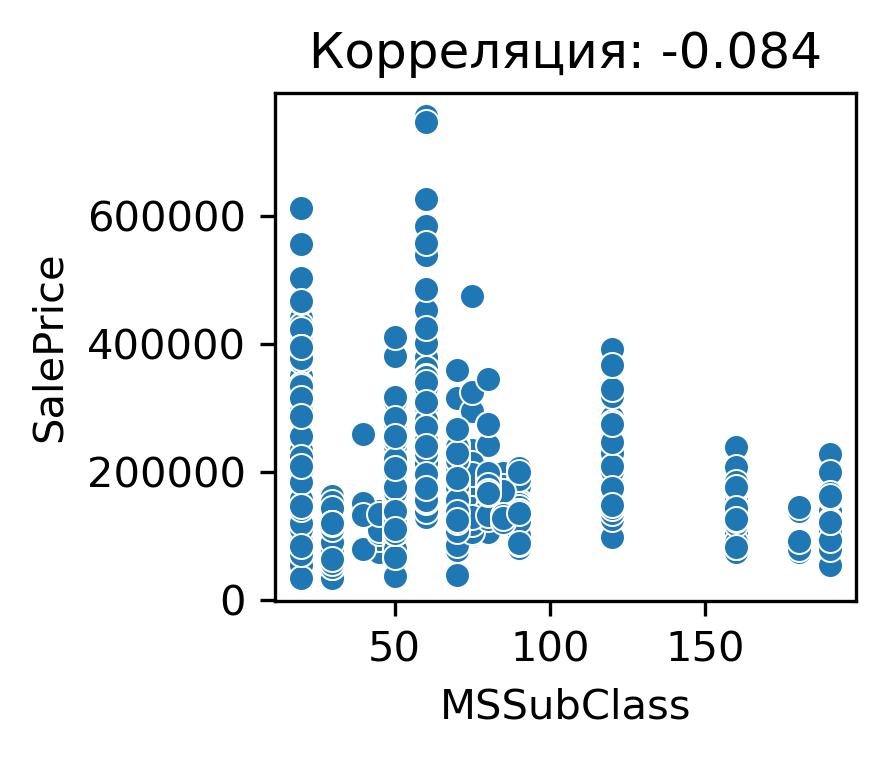

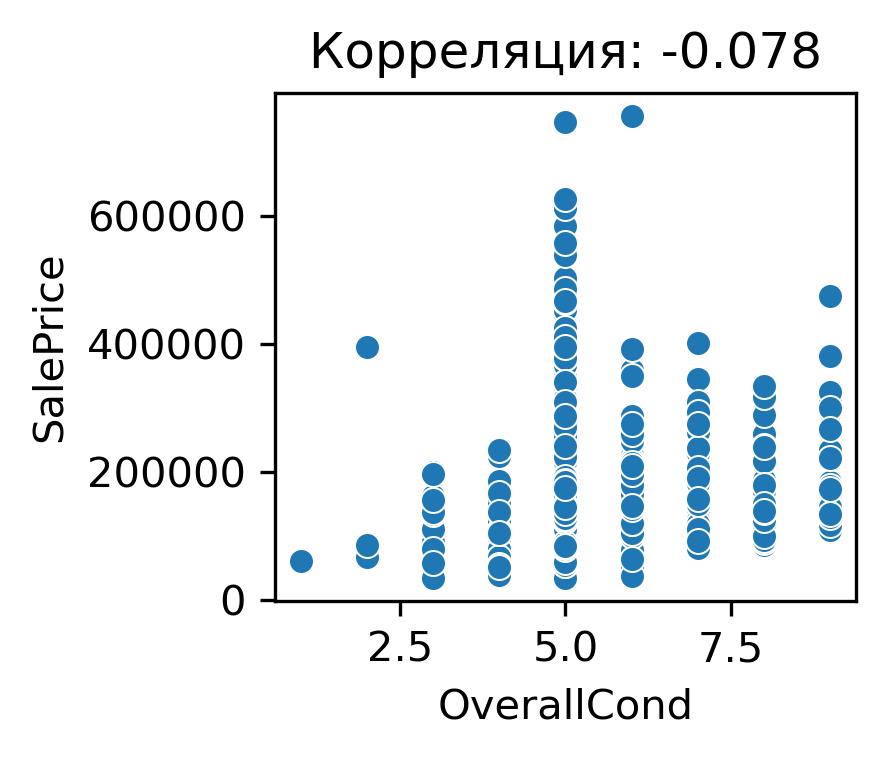

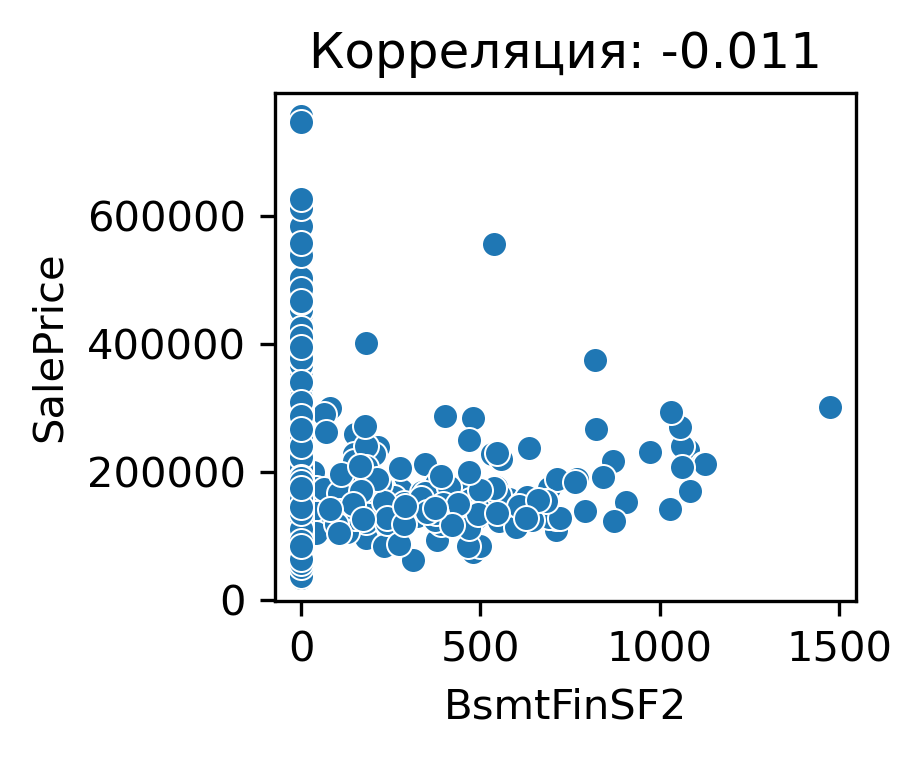

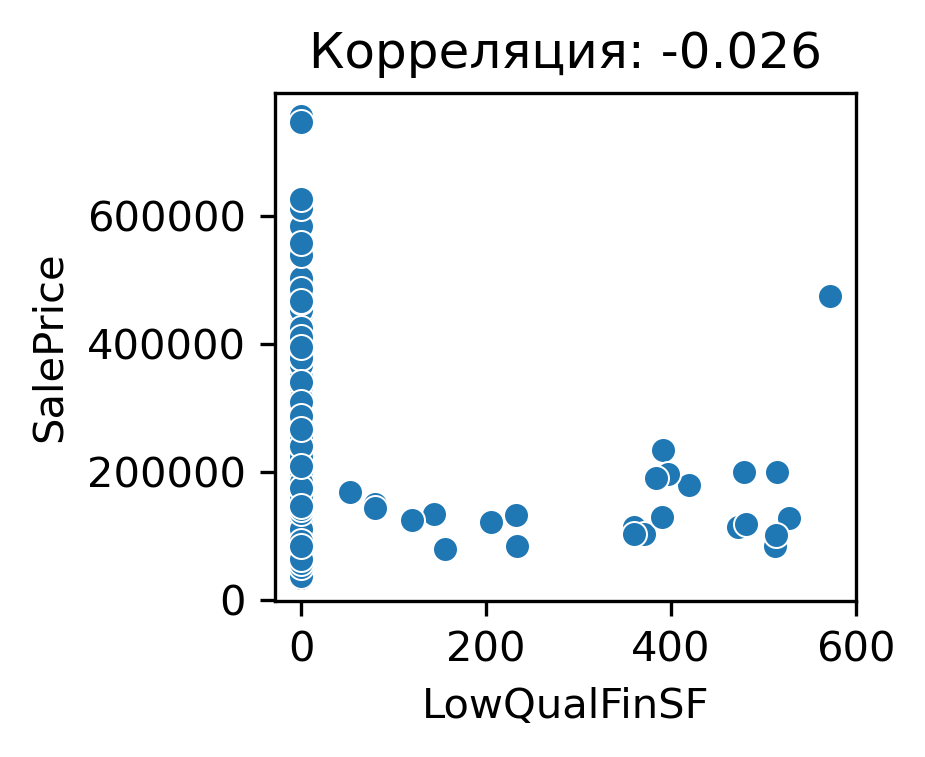

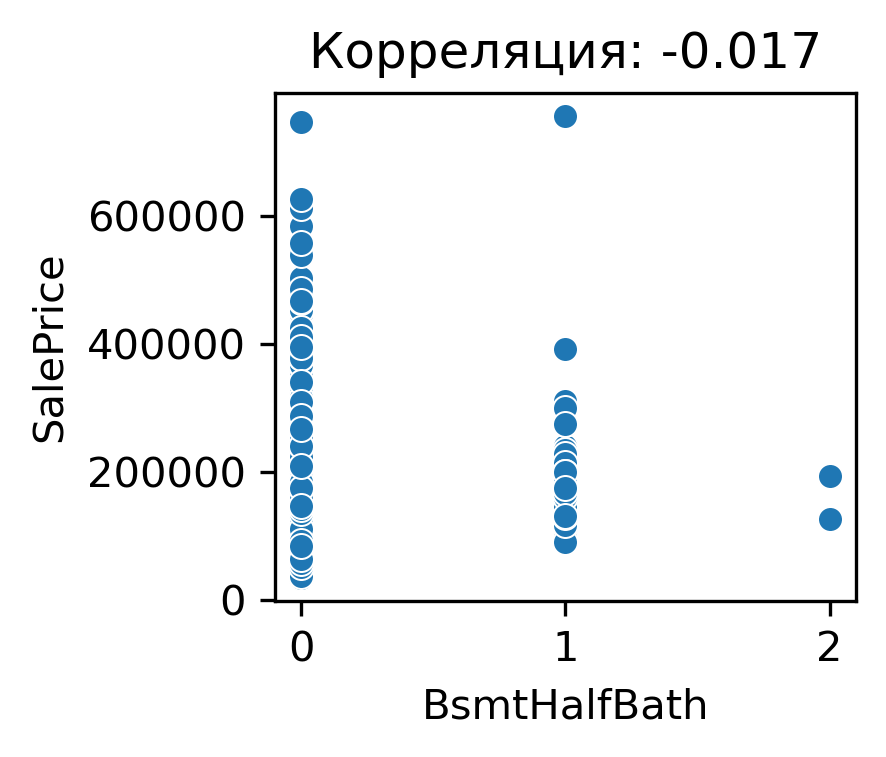

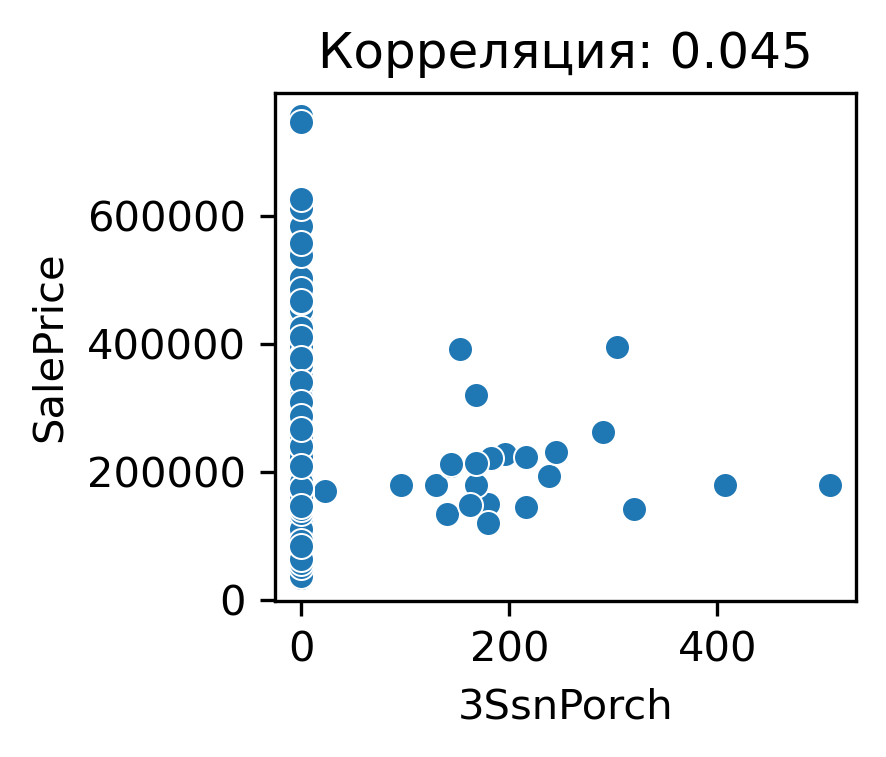

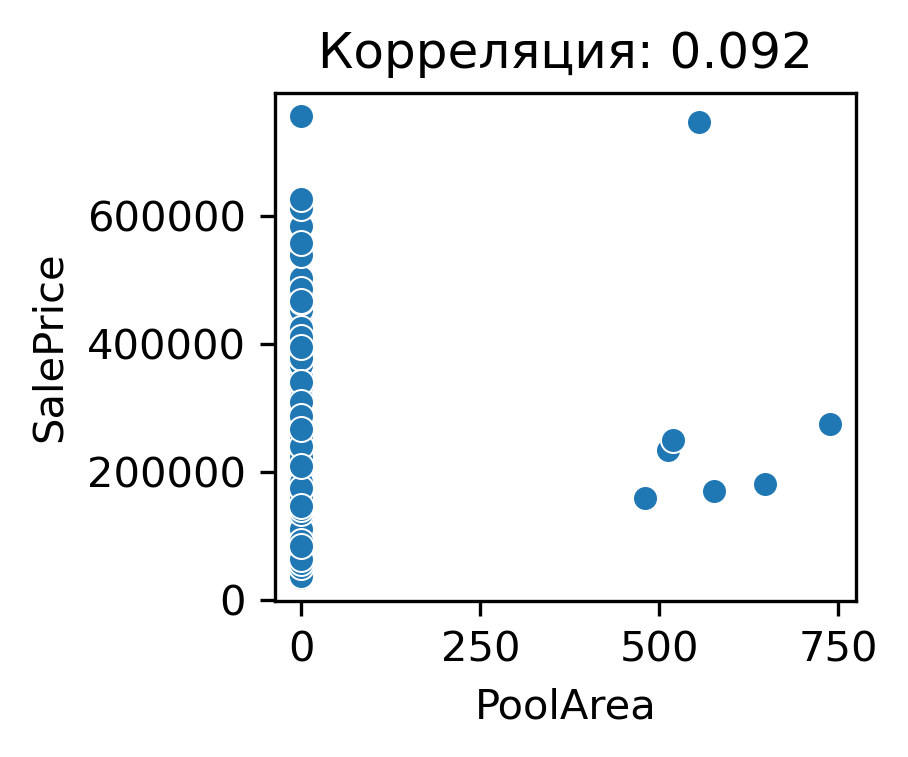

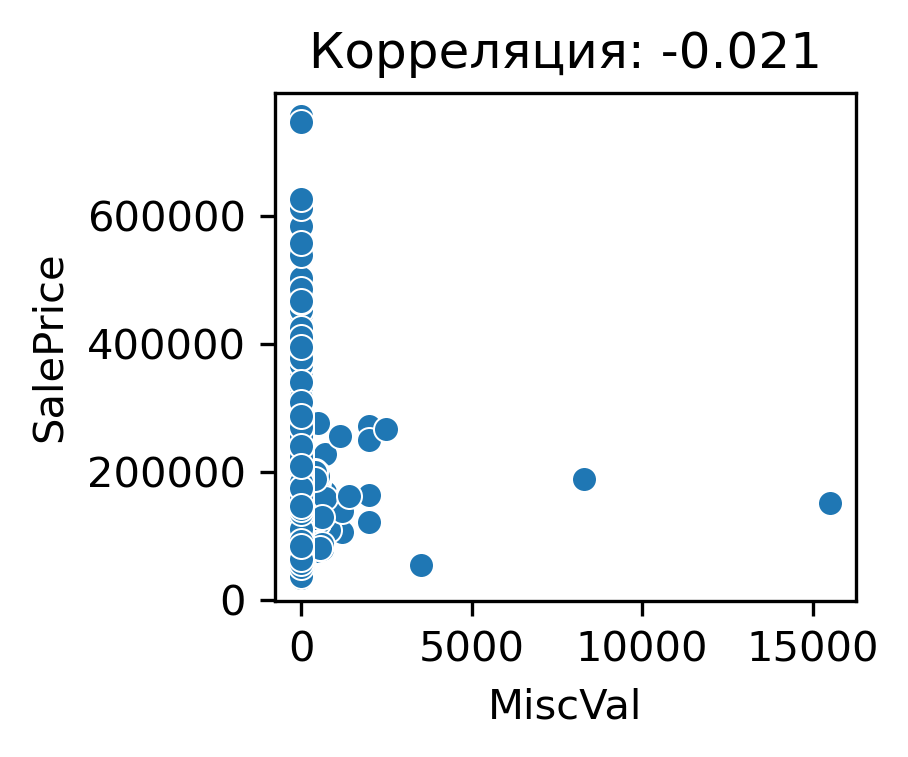

In [727]:
corr_cols_target = df_num_columns.corr()["SalePrice"]
for col in corr_cols_target.index:
    if abs(float(corr_cols_target[col])) <= 0.1:
        drow_scatterplot(df_num_columns, col, round(float(corr_cols_target[col]), 3))
#Видно, что зависимость есть просто она нелинейная, так как некоторые признаки, являются дискретными

In [728]:
#Посмотрим потенциально дискретные признаки
potencial_cat_cols = df_num_columns.nunique().sort_values()

In [729]:
#Запишем потенциально вещественные признаки, если количество уникальных значений <= 10
list_potencial_cat_cols = []
for col in potencial_cat_cols.index:
    if potencial_cat_cols[col] <= 10:
        list_potencial_cat_cols.append(col)

In [730]:
#Функция, которая показывает фактор инфляции дисперсии
def check_VIF(df):
    new_df = df.drop("SalePrice", axis=1)
    columns = []
    list_VIF = []
    for col in new_df.columns:
        X, y = new_df.drop(col, axis=1), new_df[col]
        model = LinearRegression()

        model.fit(X, y)
        error = MSE(y, model.predict(X))
        R_2 = 1 - (error / y.var())
        VIF = round(float(1 / (1 - R_2 + 10**(-6))), 3)
        if VIF >= 5:
            list_VIF.append(VIF)
            columns.append(col)
    df_VIF = pd.DataFrame({"VIF": list_VIF}, index=columns)
    print(df_VIF)

In [731]:
#Проверка на VIF
check_VIF(df_num_columns)
#Видно, что некоторые признаки получаны, как линейные коомбинации других признаков, попробуем убрать признак

                    VIF
BsmtFinSF1    1000000.0
BsmtFinSF2    1000000.0
BsmtUnfSF     1000000.0
TotalBsmtSF   1000000.0
1stFlrSF      1000000.0
2ndFlrSF      1000000.0
LowQualFinSF  1000000.0
GrLivArea     1000000.0


In [732]:
#Рассмотрим колонки с префиксом Bsmt
df_num_columns[["BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "SalePrice"]].corr()["SalePrice"]

BsmtFinSF1     0.386420
BsmtFinSF2    -0.011378
BsmtUnfSF      0.214479
TotalBsmtSF    0.613581
SalePrice      1.000000
Name: SalePrice, dtype: float64

In [733]:
#Выкинем признак BsmtFinSF2, так как у него самая слабая связь с целевой переменной, учитывая то что на scatterplot у него самая слабая связь
df_num_columns.drop("BsmtFinSF2", axis=1, inplace=True)
print("Признак BsmtFinSF2 успешно удалён!")

Признак BsmtFinSF2 успешно удалён!


In [734]:
check_VIF(df_num_columns)

                      VIF
BsmtFinSF1          8.336
BsmtUnfSF           8.137
TotalBsmtSF        10.624
1stFlrSF      1000000.000
2ndFlrSF      1000000.000
LowQualFinSF  1000000.000
GrLivArea     1000000.000


In [735]:
#Расмотрим колонки с прифексом SF
df_num_columns[["1stFlrSF", "2ndFlrSF", "LowQualFinSF", "SalePrice"]].corr()["SalePrice"]

1stFlrSF        0.605852
2ndFlrSF        0.319334
LowQualFinSF   -0.025606
SalePrice       1.000000
Name: SalePrice, dtype: float64

In [736]:
#Удалим признак LowQualFinSF, так как он имеет худшую корреляцию между целевым значением
df_num_columns.drop("LowQualFinSF", axis=1, inplace=True)
print("Признак LowQualFinSF был успешно удалён!")

Признак LowQualFinSF был успешно удалён!


In [737]:
check_VIF(df_num_columns)

                 VIF
BsmtFinSF1     8.336
BsmtUnfSF      8.137
TotalBsmtSF   10.624
1stFlrSF      79.036
2ndFlrSF      91.680
GrLivArea    124.458


In [738]:
df[["BsmtFinSF1", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "2ndFlrSF", "GrLivArea", "SalePrice"]].corr()["SalePrice"]

BsmtFinSF1     0.386420
BsmtUnfSF      0.214479
TotalBsmtSF    0.613581
1stFlrSF       0.605852
2ndFlrSF       0.319334
GrLivArea      0.708624
SalePrice      1.000000
Name: SalePrice, dtype: float64

In [739]:
#Удалим 2 данных признака, чтобы убрать проблему мультиколлениарности
check_VIF(df_num_columns.drop(["2ndFlrSF", "BsmtUnfSF"], axis=1))

             VIF
GrLivArea  5.973


In [740]:
df_num_columns.drop(["2ndFlrSF", "BsmtUnfSF"], axis=1, inplace=True)
print("Данные признаки были успешно удалены!")

Данные признаки были успешно удалены!


# Этап 2: Глубокий анализ категориальных признаков

In [741]:
#Функция, которая отрисовывает частут появляния того или иного признака
def drow_countplot(df, col):
    print(df[col].value_counts(normalize=True))
    fig = plt.figure(figsize=(2.5, 2), dpi=300)
    plt.title(col)
    plt.ylabel("Значение")
    sns.countplot(data=df, x=col, palette="hls")
    plt.xticks(rotation=60)
    plt.show()

MSZoning
RL         0.777015
RM         0.157804
FV         0.047684
RH         0.008919
C (all)    0.008576
Name: proportion, dtype: float64


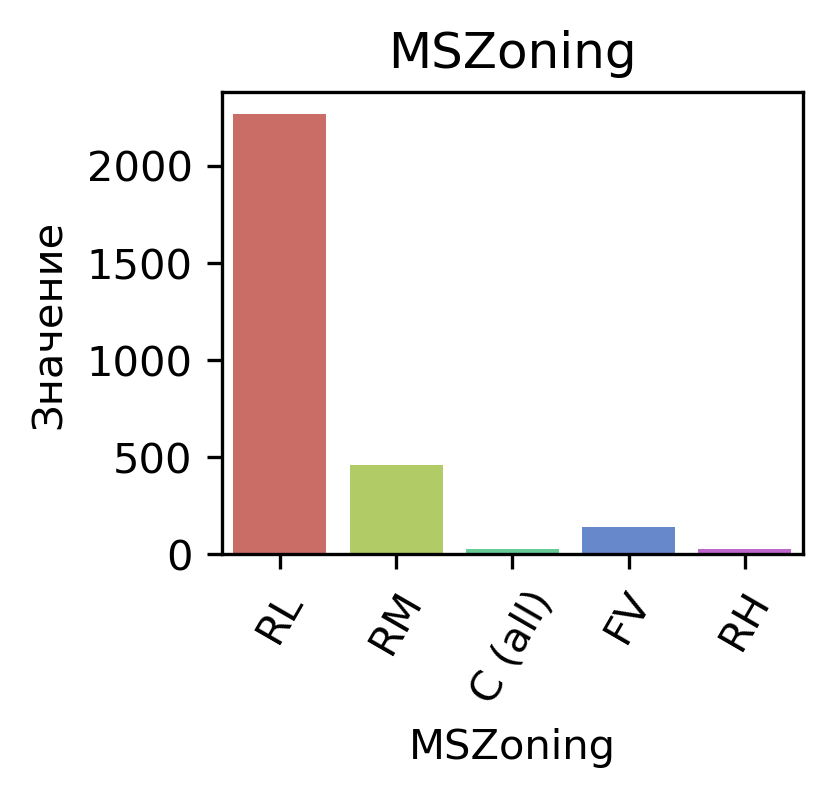

Street
Pave    0.995889
Grvl    0.004111
Name: proportion, dtype: float64


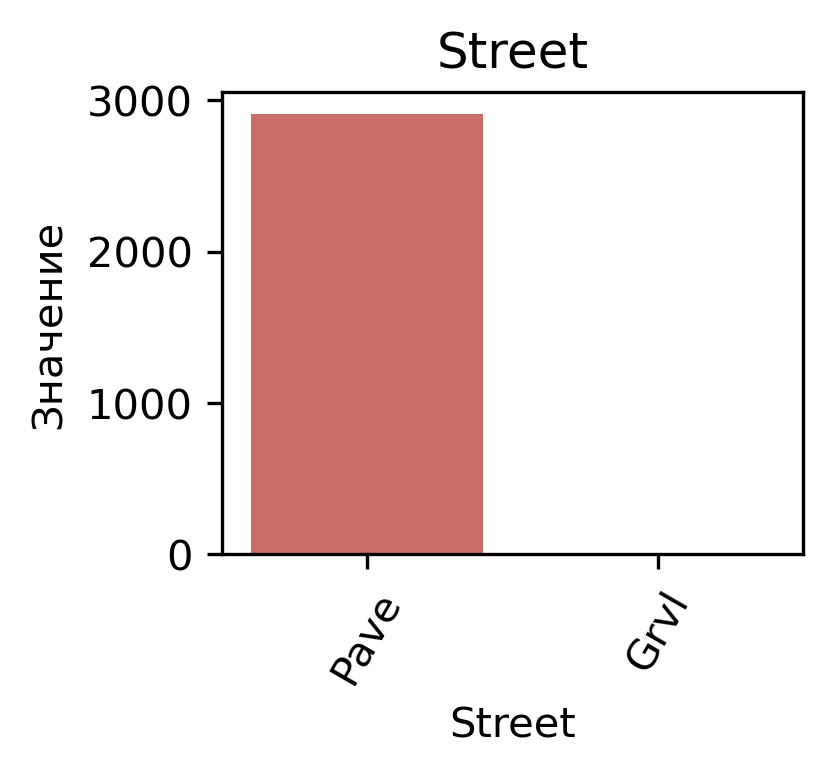

Alley
Grvl    0.606061
Pave    0.393939
Name: proportion, dtype: float64


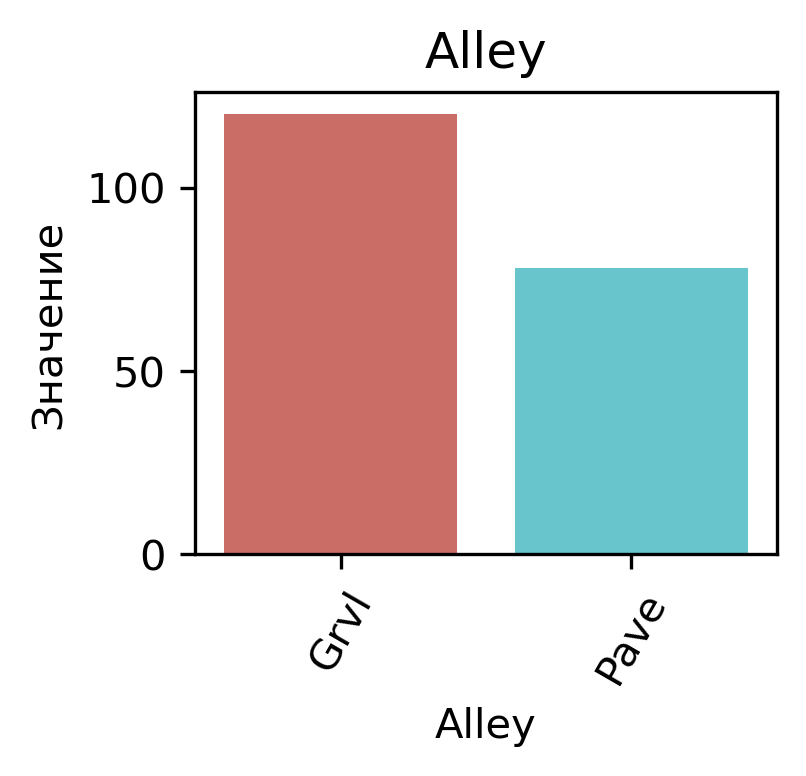

LotShape
Reg    0.636862
IR1    0.331620
IR2    0.026036
IR3    0.005481
Name: proportion, dtype: float64


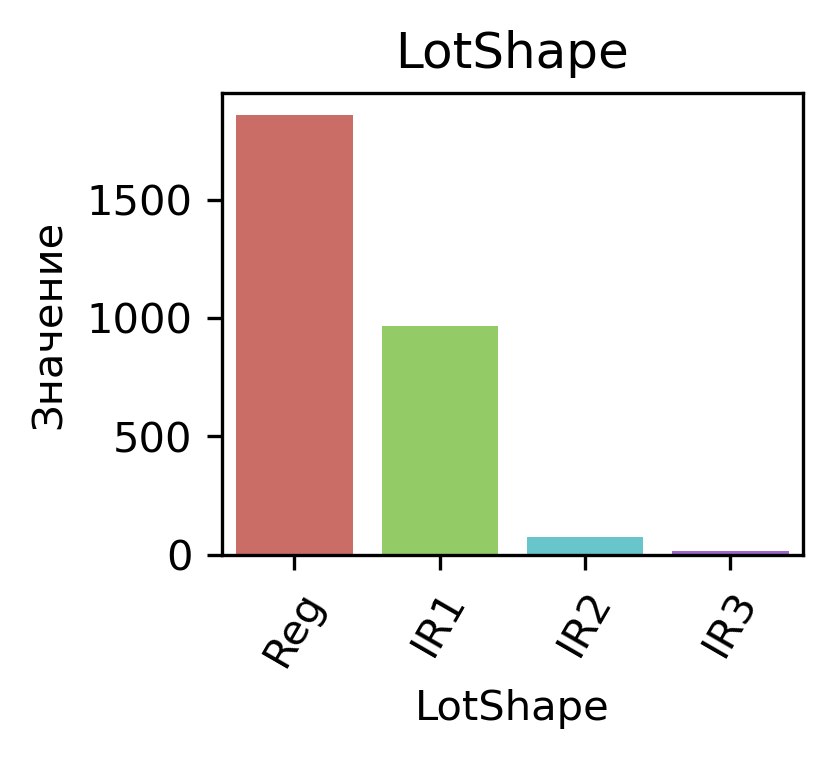

LandContour
Lvl    0.898253
HLS    0.041110
Bnk    0.040082
Low    0.020555
Name: proportion, dtype: float64


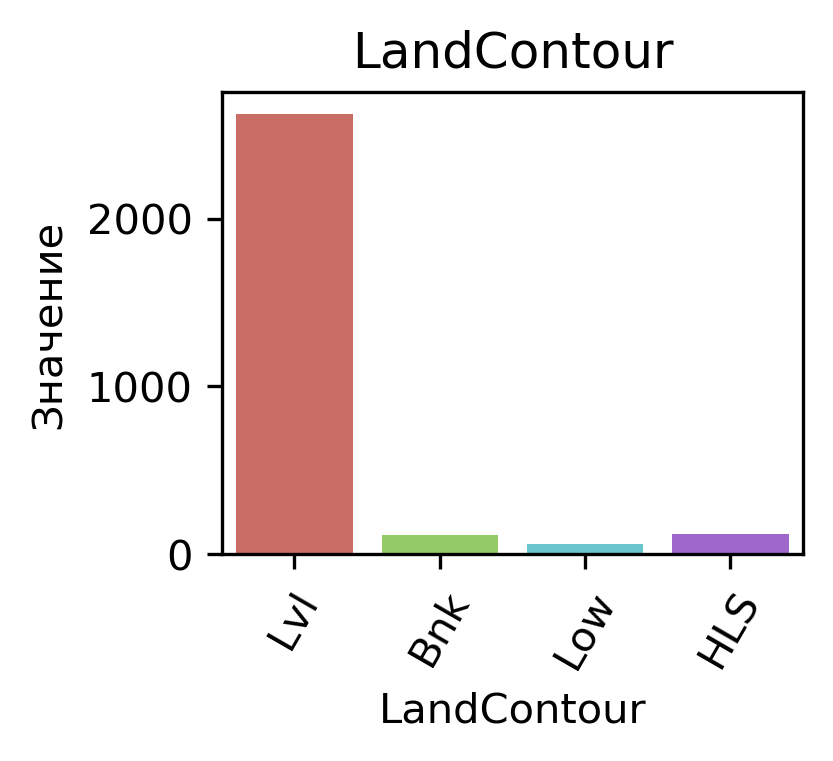

Utilities
AllPub    0.999657
NoSeWa    0.000343
Name: proportion, dtype: float64


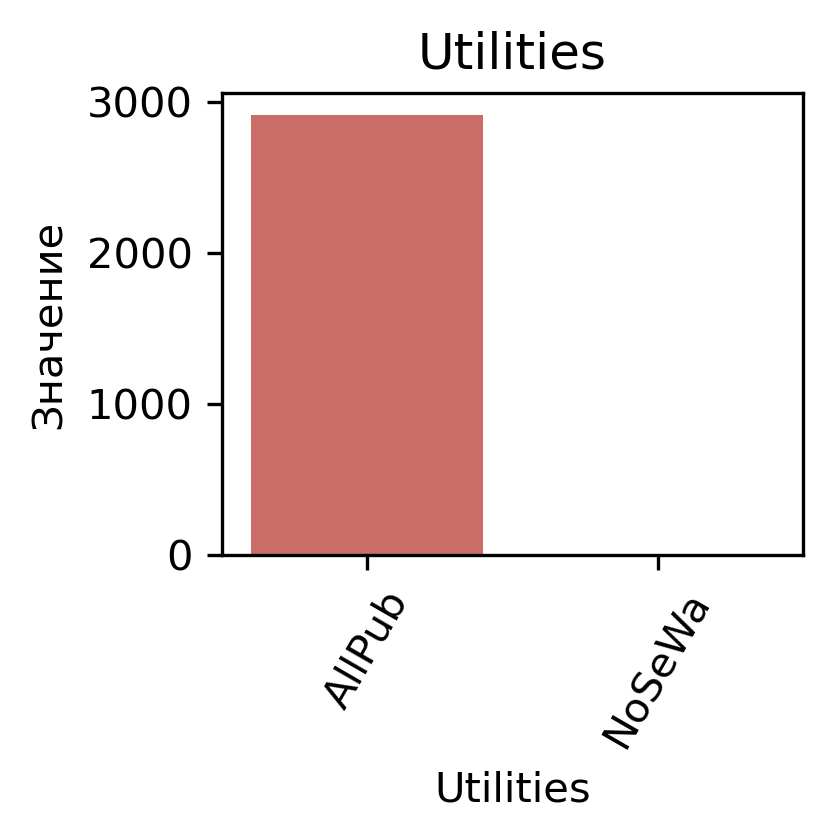

LotConfig
Inside     0.730730
Corner     0.175060
CulDSac    0.060295
FR2        0.029120
FR3        0.004796
Name: proportion, dtype: float64


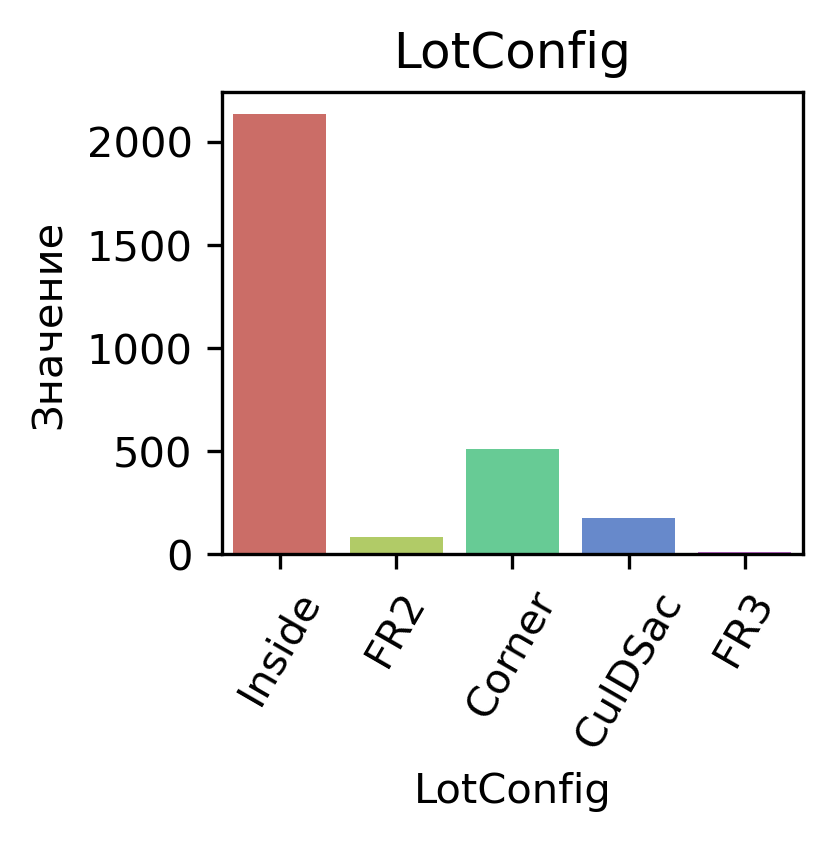

LandSlope
Gtl    0.951696
Mod    0.042823
Sev    0.005481
Name: proportion, dtype: float64


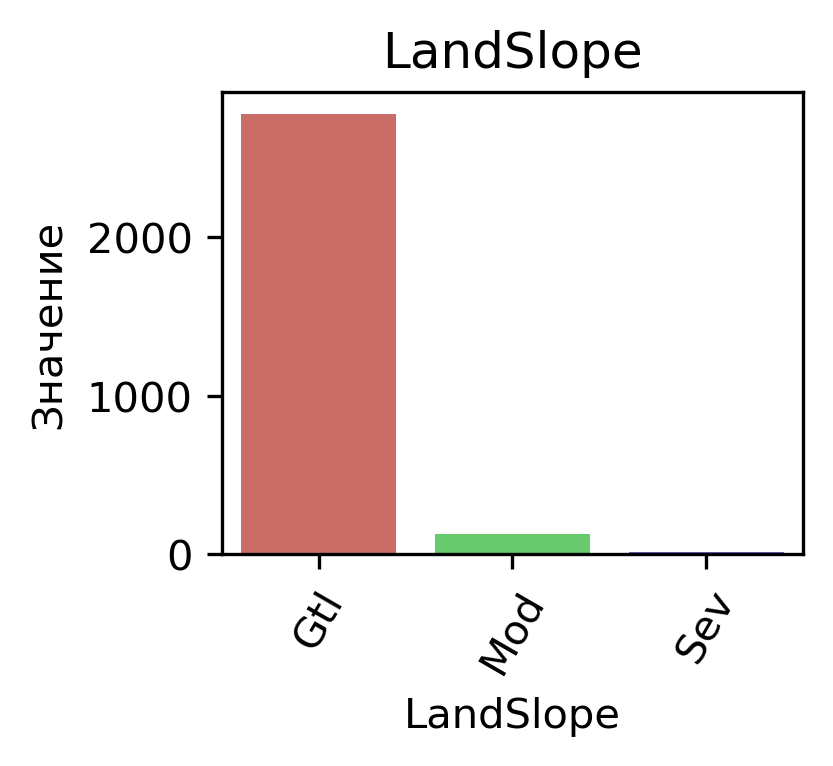

Neighborhood
NAmes      0.151764
CollgCr    0.091470
OldTown    0.081877
Edwards    0.066461
Somerst    0.062350
NridgHt    0.056869
Gilbert    0.056526
Sawyer     0.051730
NWAmes     0.044878
SawyerW    0.042823
Mitchel    0.039054
BrkSide    0.036999
Crawfor    0.035286
IDOTRR     0.031860
Timber     0.024666
NoRidge    0.024323
StoneBr    0.017472
SWISU      0.016444
ClearCr    0.015074
MeadowV    0.012676
BrDale     0.010277
Blmngtn    0.009592
Veenker    0.008222
NPkVill    0.007879
Blueste    0.003426
Name: proportion, dtype: float64


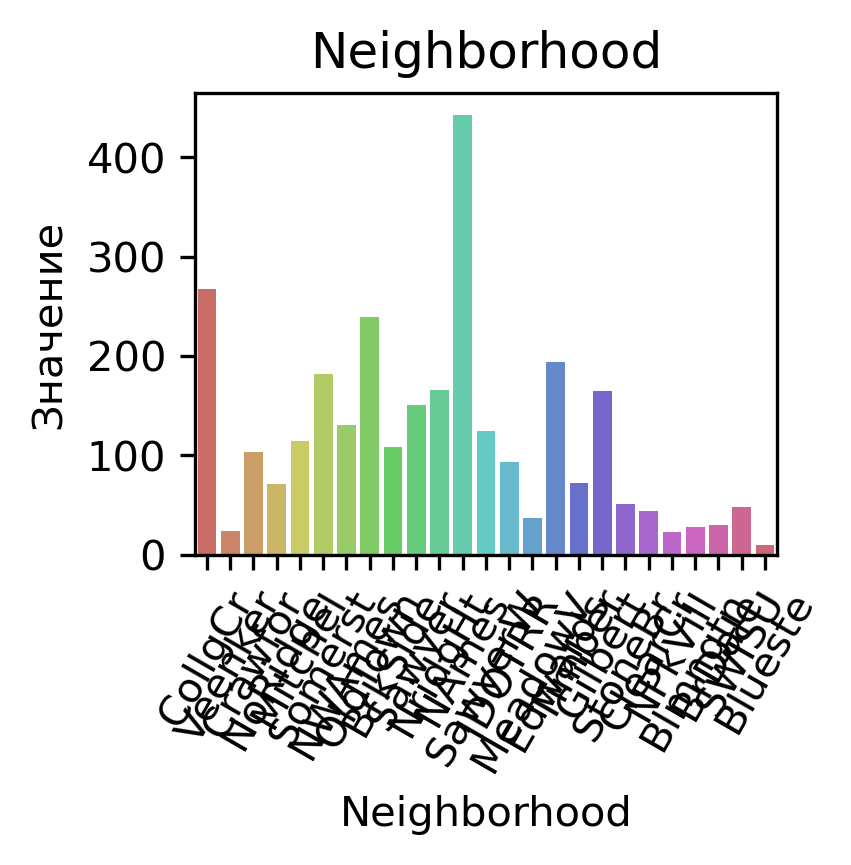

Condition1
Norm      0.860226
Feedr     0.056184
Artery    0.031518
RRAn      0.017129
PosN      0.013361
RRAe      0.009592
PosA      0.006852
RRNn      0.003083
RRNe      0.002055
Name: proportion, dtype: float64


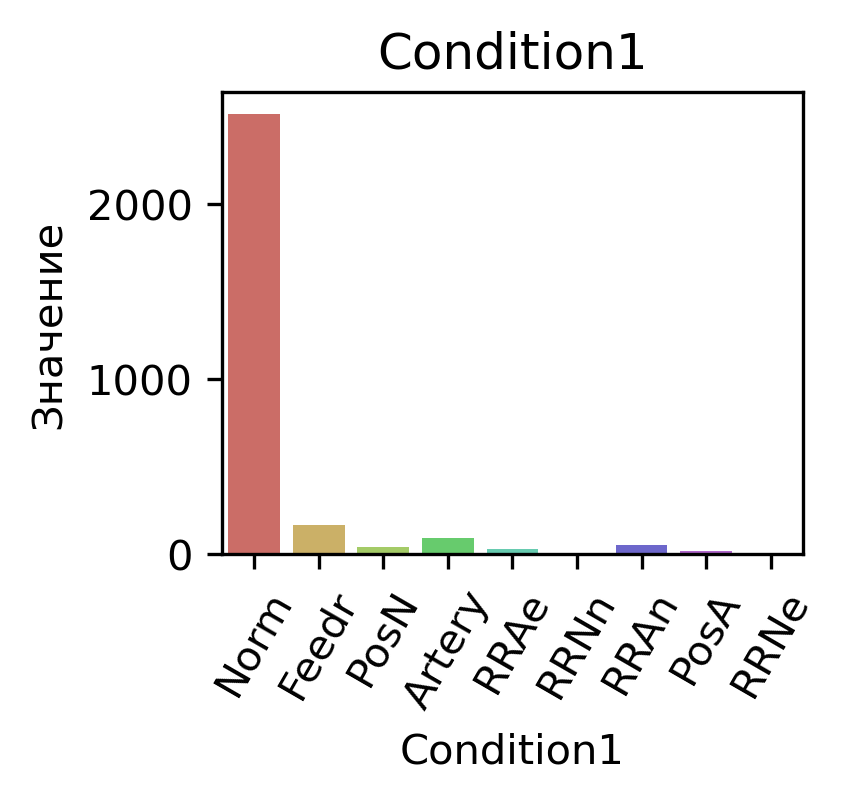

Condition2
Norm      0.989723
Feedr     0.004454
Artery    0.001713
PosN      0.001370
PosA      0.001370
RRNn      0.000685
RRAn      0.000343
RRAe      0.000343
Name: proportion, dtype: float64


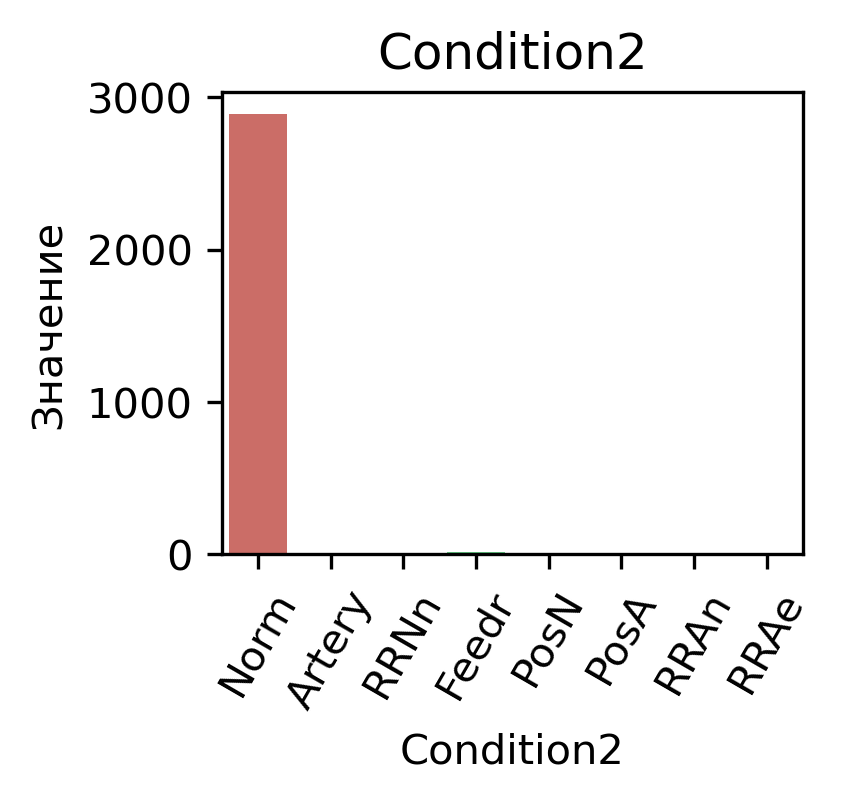

BldgType
1Fam      0.830764
TwnhsE    0.077766
Duplex    0.037342
Twnhs     0.032888
2fmCon    0.021240
Name: proportion, dtype: float64


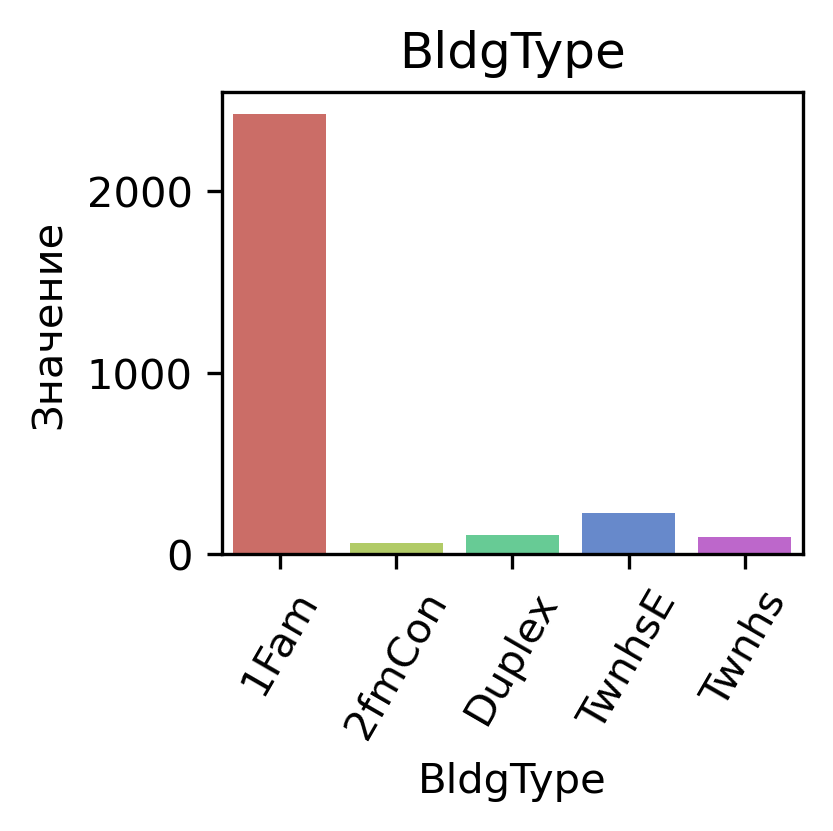

HouseStyle
1Story    0.503940
2Story    0.298732
1.5Fin    0.107571
SLvl      0.043851
SFoyer    0.028434
2.5Unf    0.008222
1.5Unf    0.006509
2.5Fin    0.002741
Name: proportion, dtype: float64


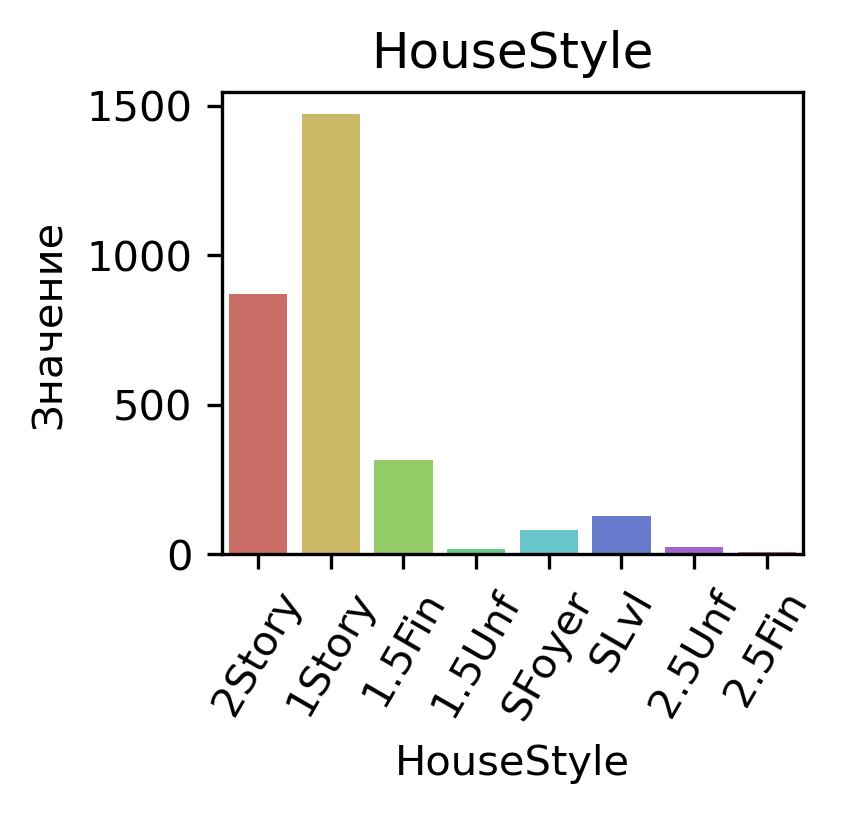

RoofStyle
Gable      0.791367
Hip        0.188763
Gambrel    0.007537
Flat       0.006852
Mansard    0.003768
Shed       0.001713
Name: proportion, dtype: float64


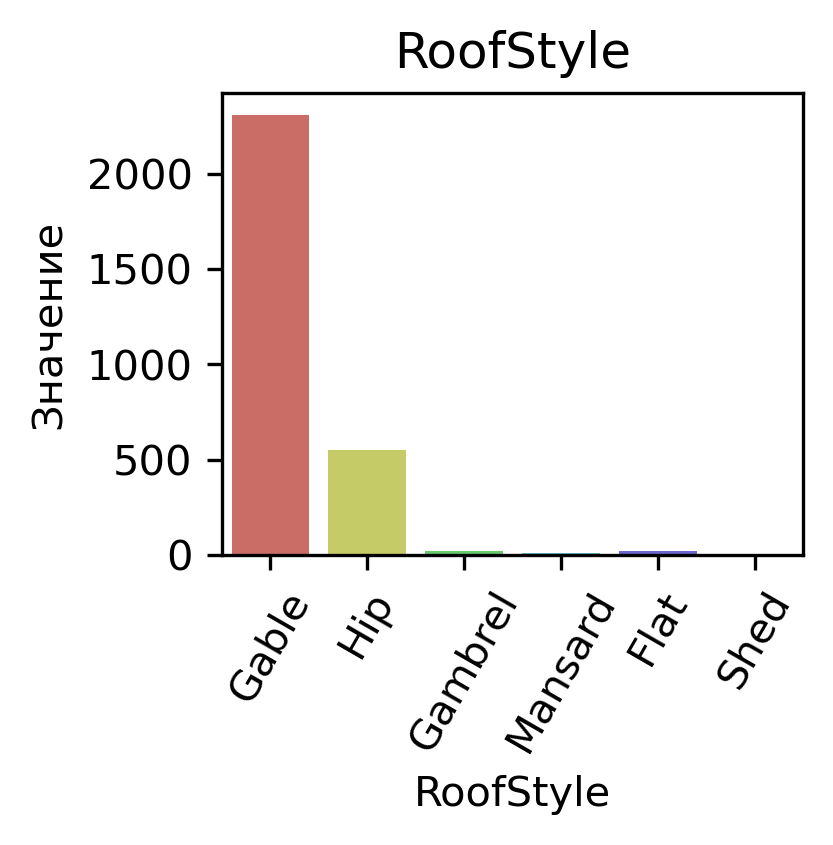

RoofMatl
CompShg    0.985269
Tar&Grv    0.007879
WdShake    0.003083
WdShngl    0.002398
Metal      0.000343
Membran    0.000343
Roll       0.000343
ClyTile    0.000343
Name: proportion, dtype: float64


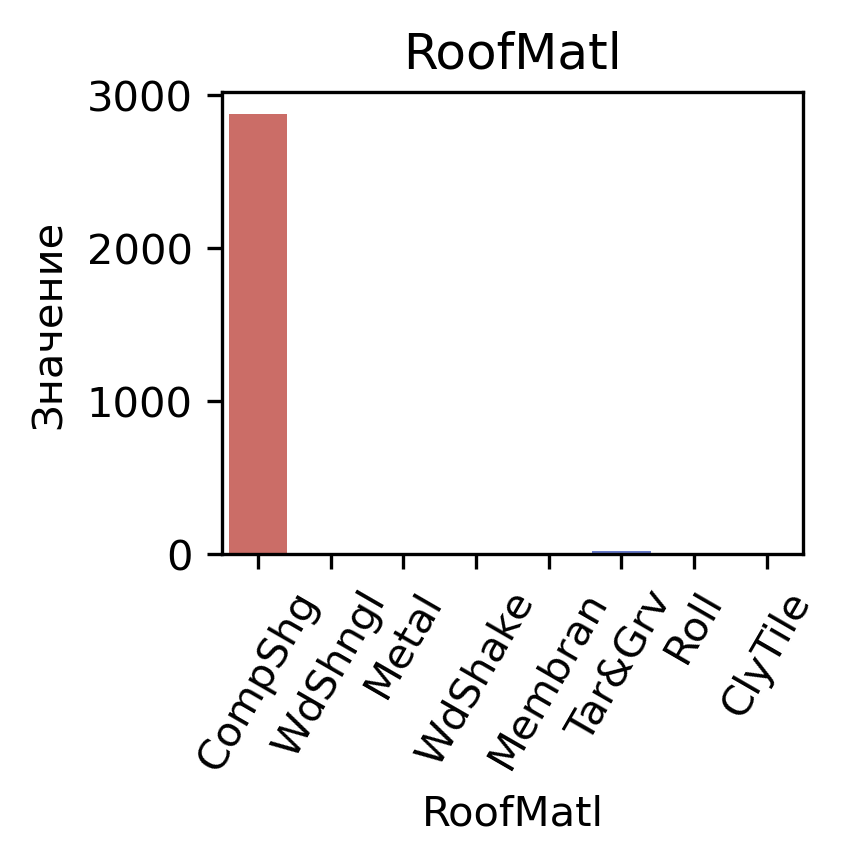

Exterior1st
VinylSd    0.351268
MetalSd    0.154215
HdBoard    0.151474
Wd Sdng    0.140850
Plywood    0.075737
CemntBd    0.043180
BrkFace    0.029815
WdShing    0.019191
AsbShng    0.015079
Stucco     0.014736
BrkComm    0.002056
AsphShn    0.000685
Stone      0.000685
CBlock     0.000685
ImStucc    0.000343
Name: proportion, dtype: float64


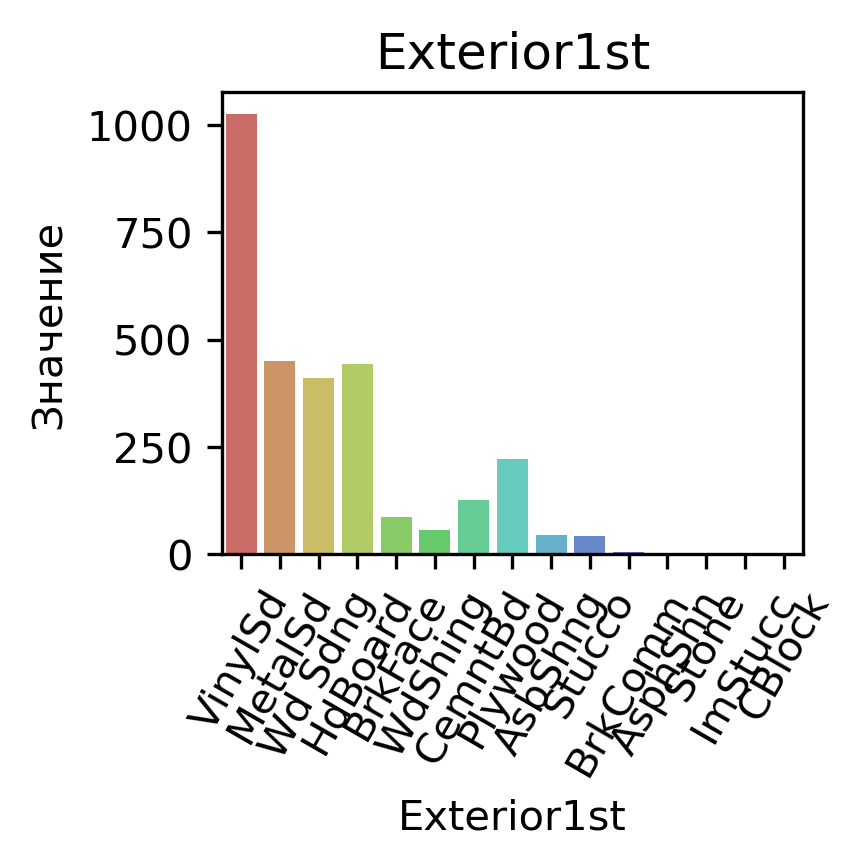

Exterior2nd
VinylSd    0.347498
MetalSd    0.153187
HdBoard    0.139136
Wd Sdng    0.133996
Plywood    0.092529
CmentBd    0.043180
Wd Shng    0.027759
BrkFace    0.016107
Stucco     0.016107
AsbShng    0.013023
Brk Cmn    0.007539
ImStucc    0.005141
Stone      0.002056
AsphShn    0.001371
CBlock     0.001028
Other      0.000343
Name: proportion, dtype: float64


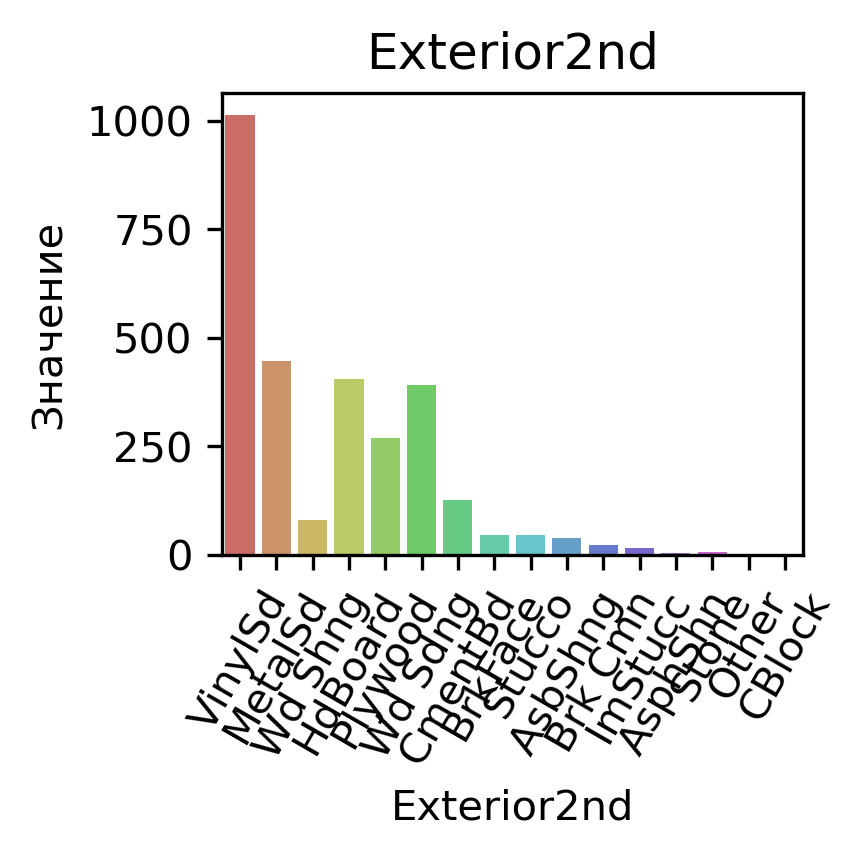

MasVnrType
BrkFace    0.762359
Stone      0.215958
BrkCmn     0.021683
Name: proportion, dtype: float64


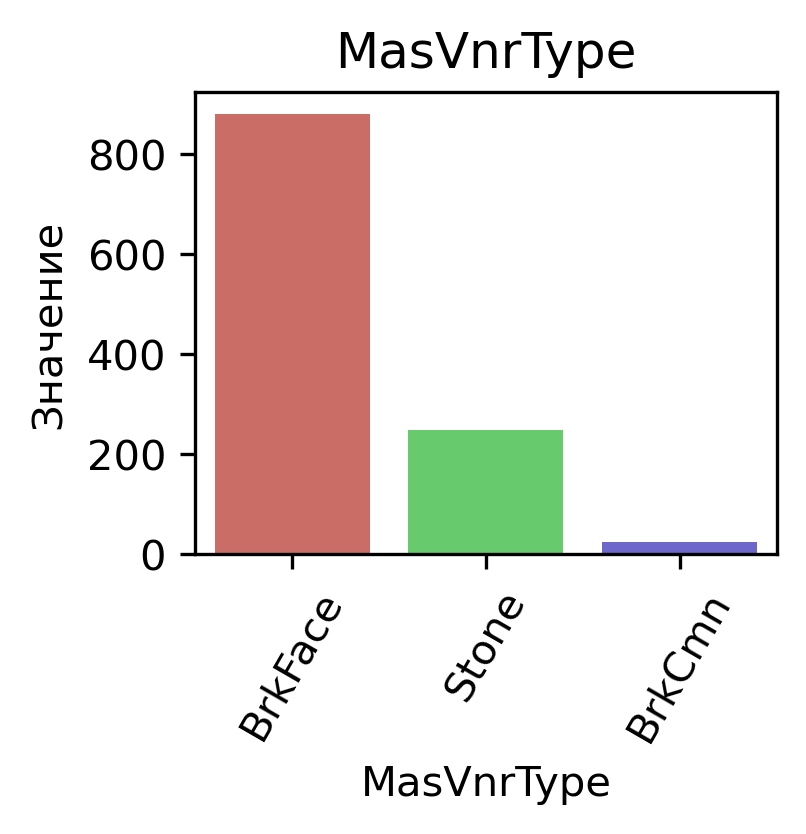

ExterQual
TA    0.615964
Gd    0.335389
Ex    0.036656
Fa    0.011990
Name: proportion, dtype: float64


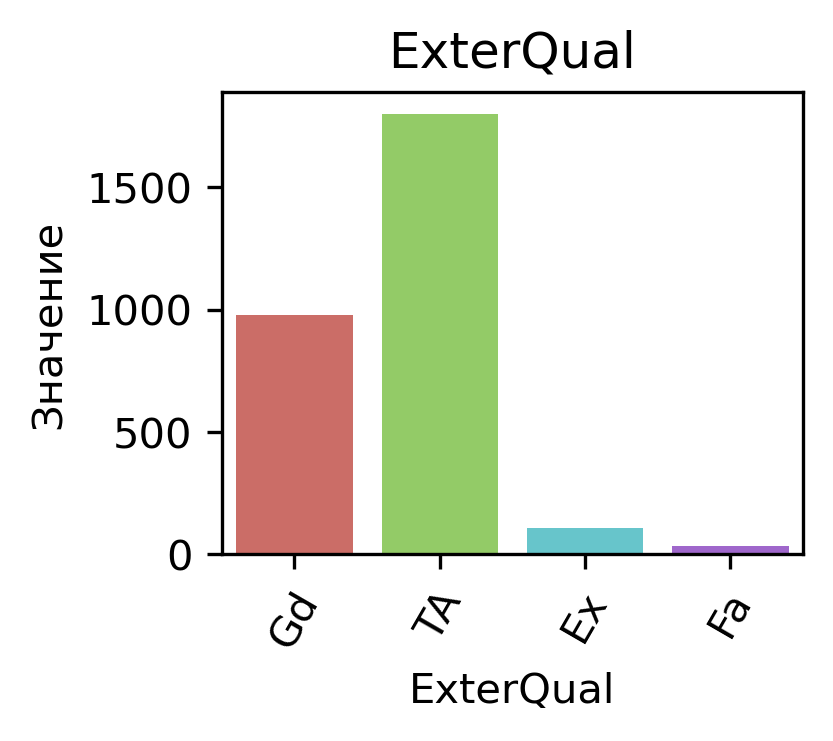

ExterCond
TA    0.869476
Gd    0.102432
Fa    0.022953
Ex    0.004111
Po    0.001028
Name: proportion, dtype: float64


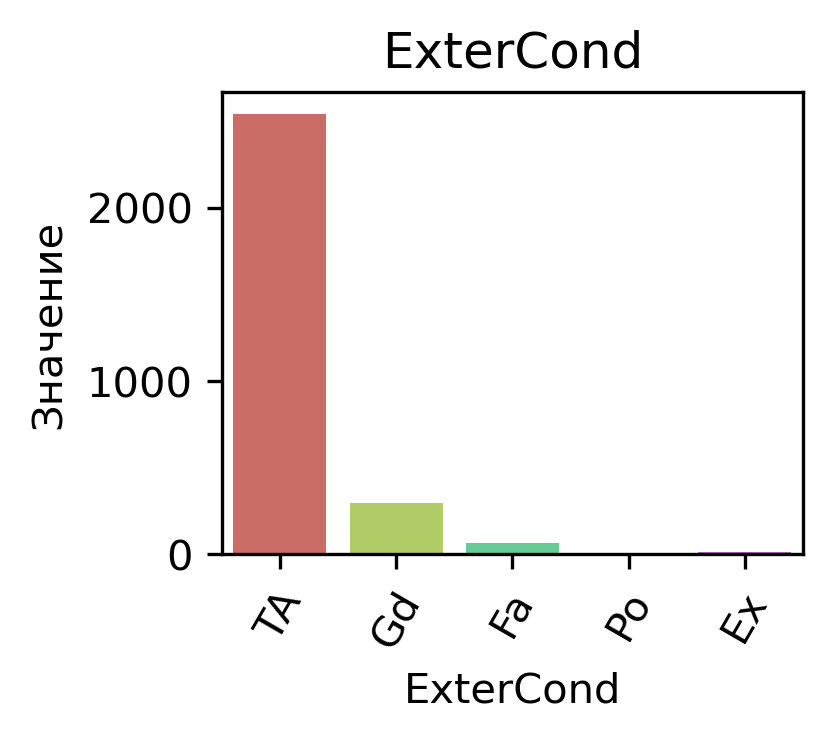

Foundation
PConc     0.448099
CBlock    0.423090
BrkTil    0.106543
Slab      0.016787
Stone     0.003768
Wood      0.001713
Name: proportion, dtype: float64


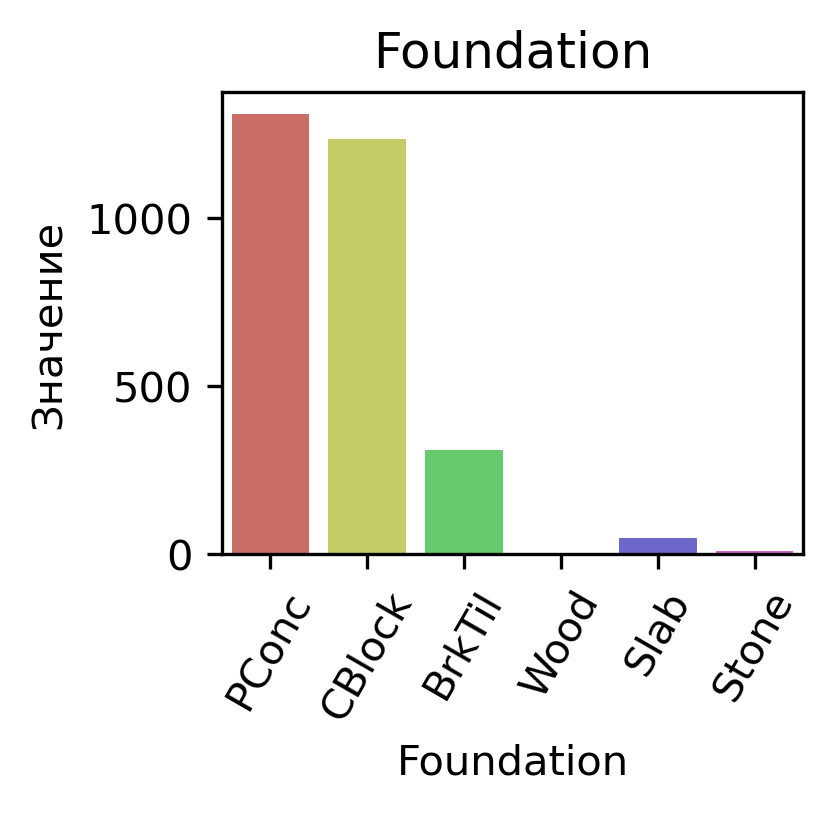

BsmtQual
TA    0.452079
Gd    0.426004
Ex    0.090909
Fa    0.031008
Name: proportion, dtype: float64


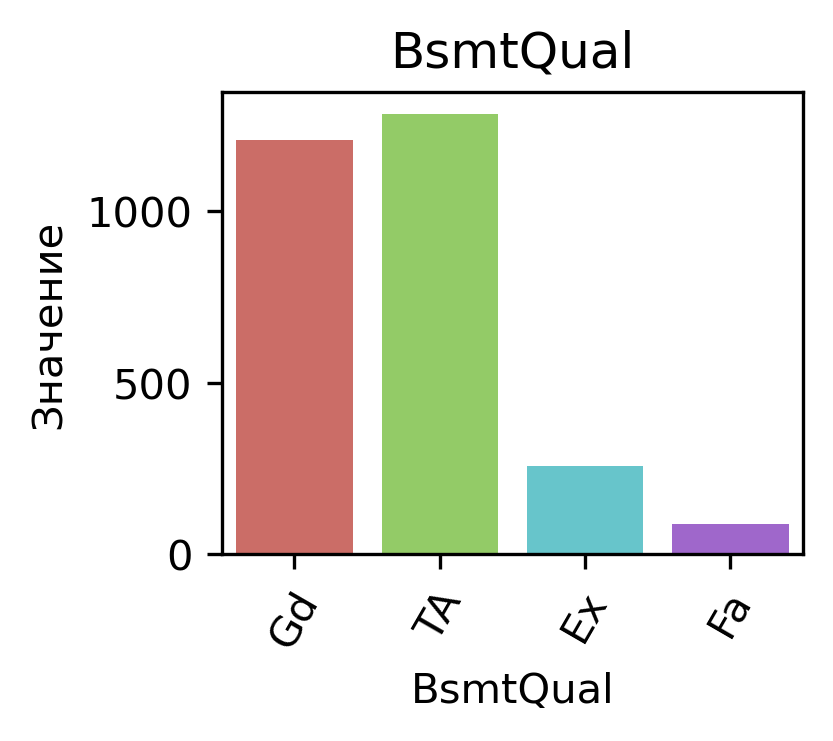

BsmtCond
TA    0.918576
Gd    0.043003
Fa    0.036658
Po    0.001762
Name: proportion, dtype: float64


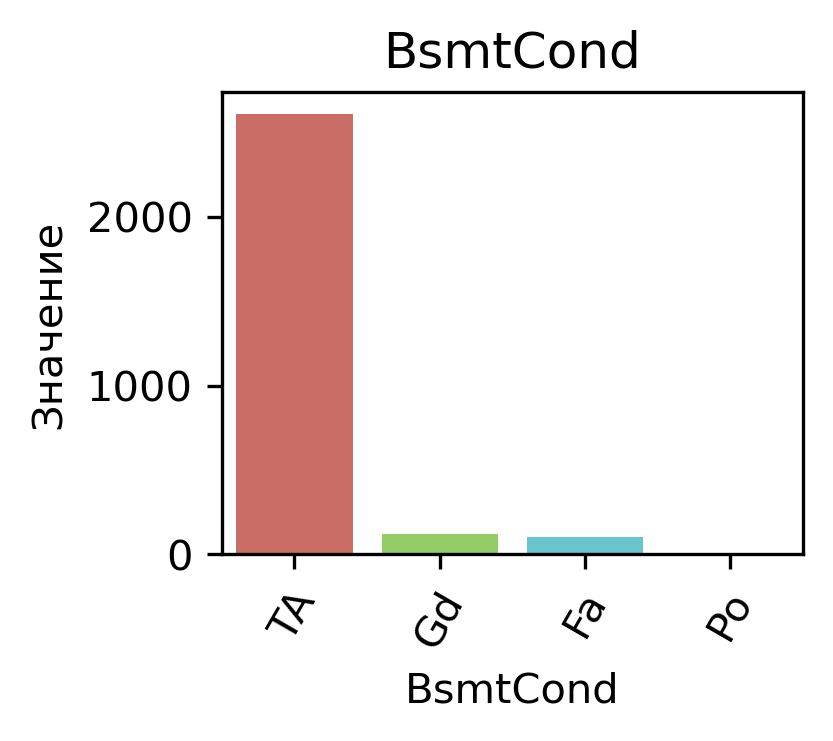

BsmtExposure
No    0.671131
Av    0.147339
Gd    0.097286
Mn    0.084244
Name: proportion, dtype: float64


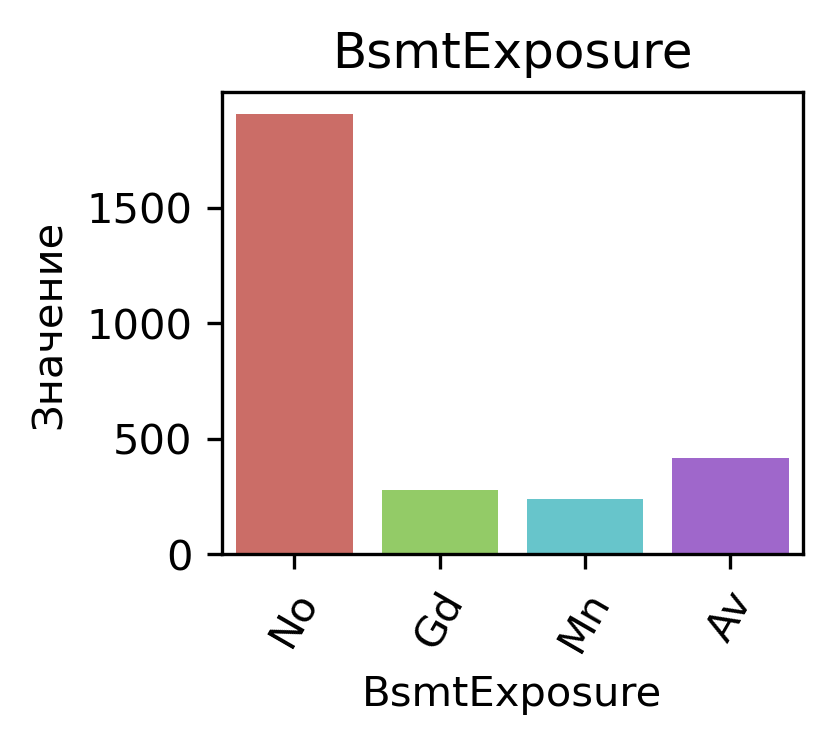

BsmtFinType1
Unf    0.299648
GLQ    0.298944
ALQ    0.151056
Rec    0.101408
BLQ    0.094718
LwQ    0.054225
Name: proportion, dtype: float64


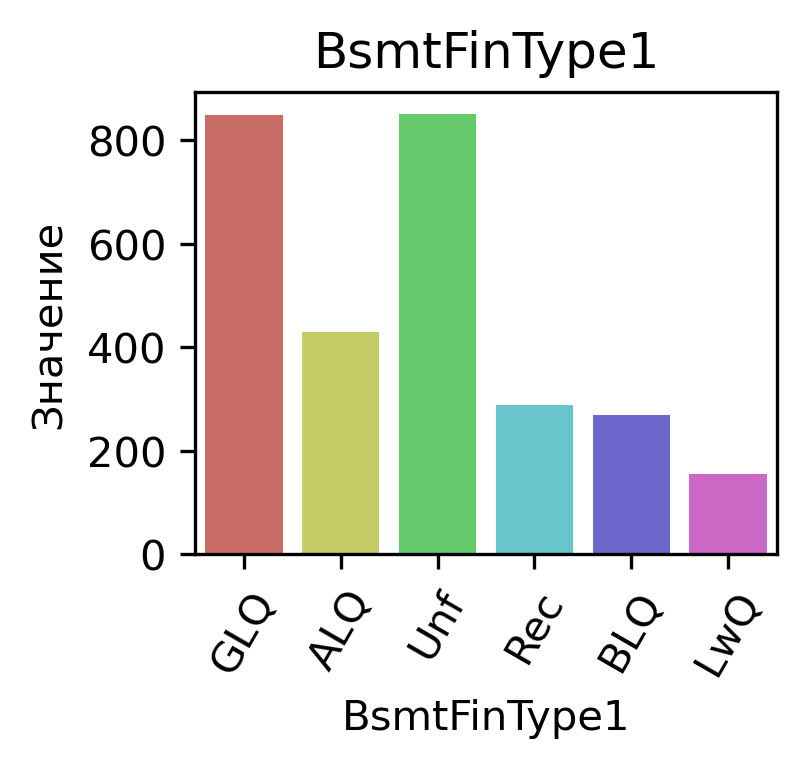

BsmtFinType2
Unf    0.878126
Rec    0.036985
LwQ    0.030645
BLQ    0.023952
ALQ    0.018316
GLQ    0.011976
Name: proportion, dtype: float64


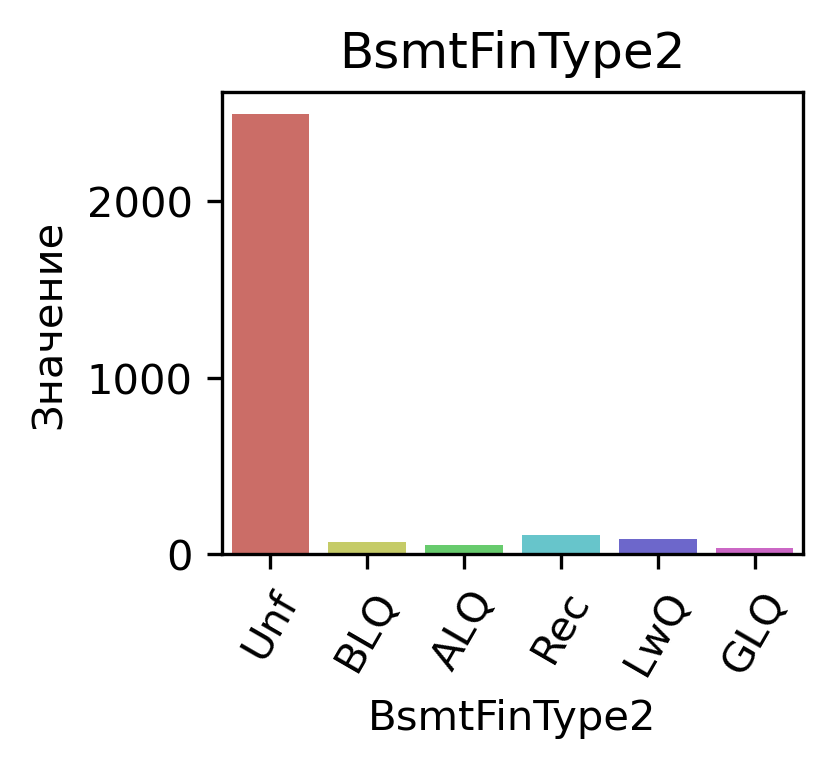

Heating
GasA     0.984584
GasW     0.009250
Grav     0.003083
Wall     0.002055
OthW     0.000685
Floor    0.000343
Name: proportion, dtype: float64


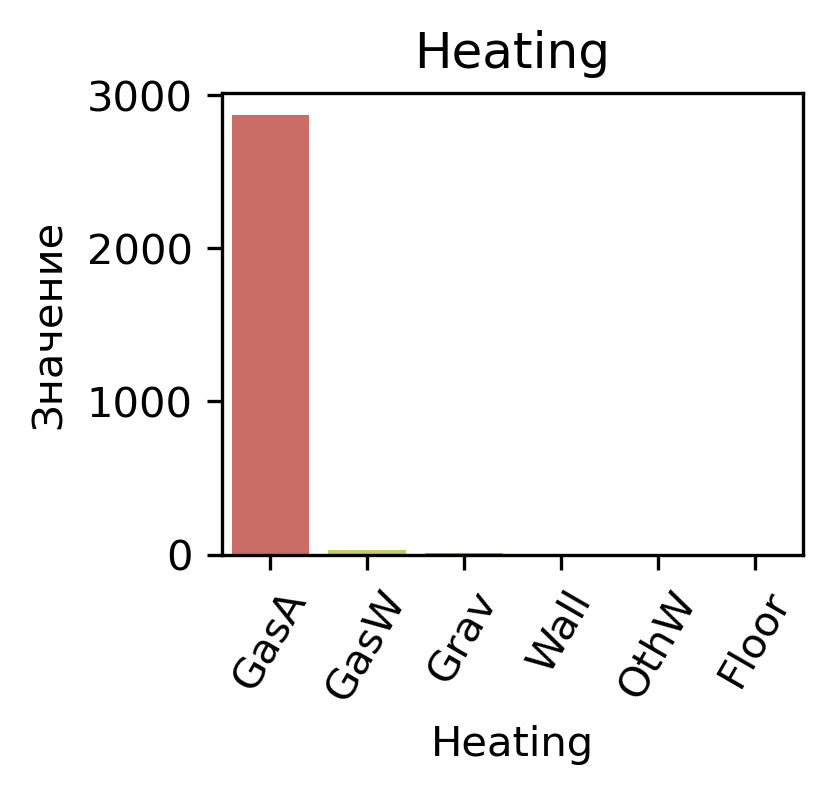

HeatingQC
Ex    0.511477
TA    0.293594
Gd    0.162384
Fa    0.031518
Po    0.001028
Name: proportion, dtype: float64


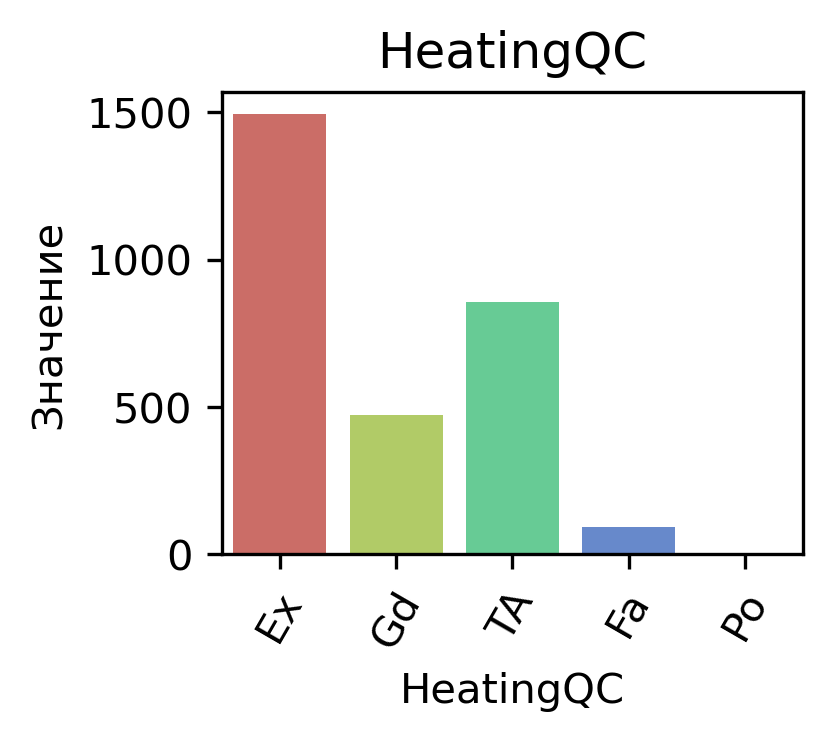

CentralAir
Y    0.932854
N    0.067146
Name: proportion, dtype: float64


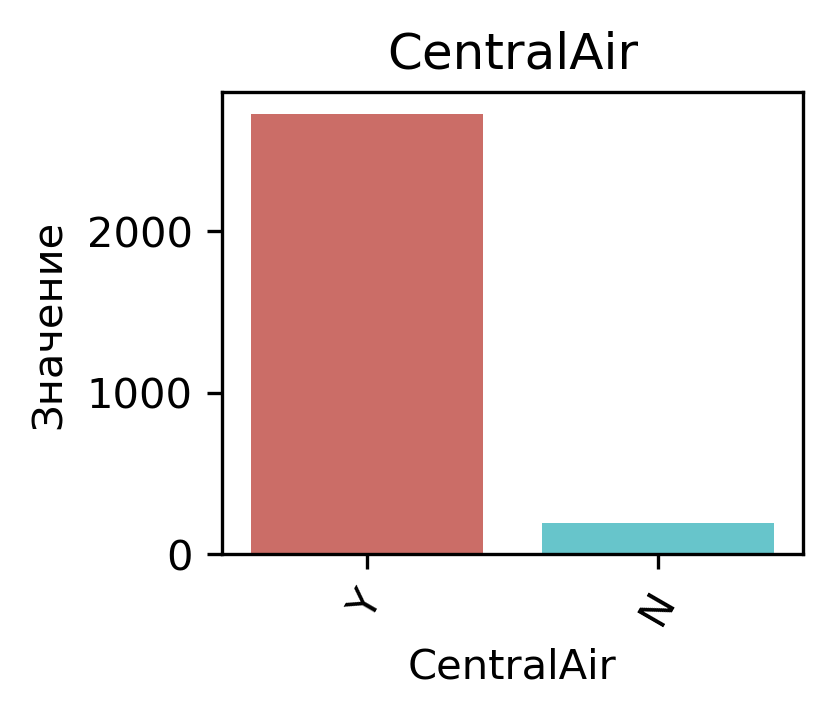

Electrical
SBrkr    0.915353
FuseA    0.064428
FuseF    0.017135
FuseP    0.002742
Mix      0.000343
Name: proportion, dtype: float64


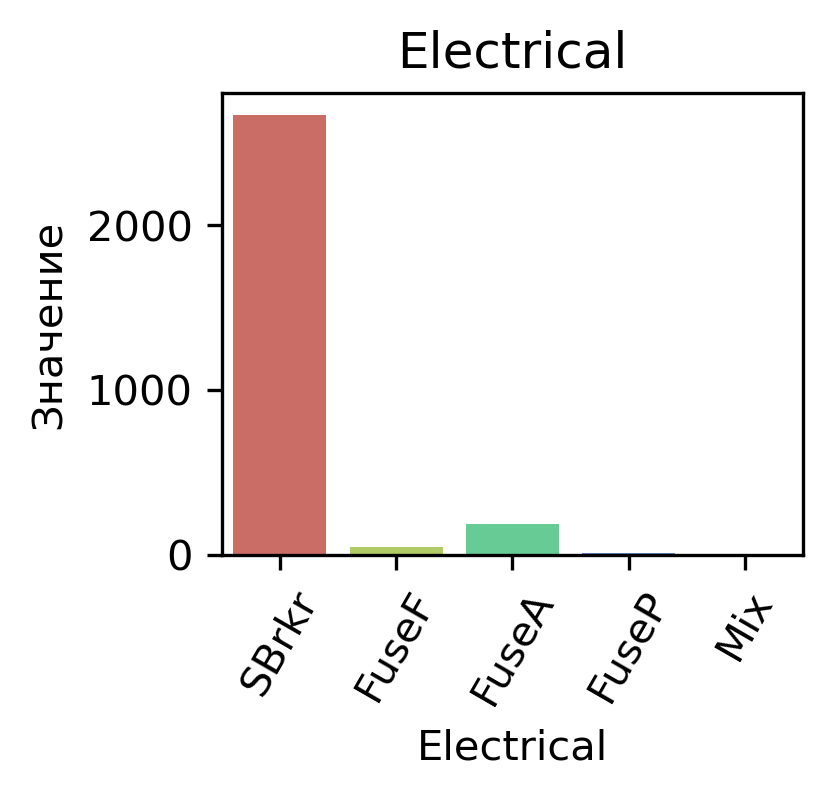

KitchenQual
TA    0.511309
Gd    0.394448
Ex    0.070254
Fa    0.023989
Name: proportion, dtype: float64


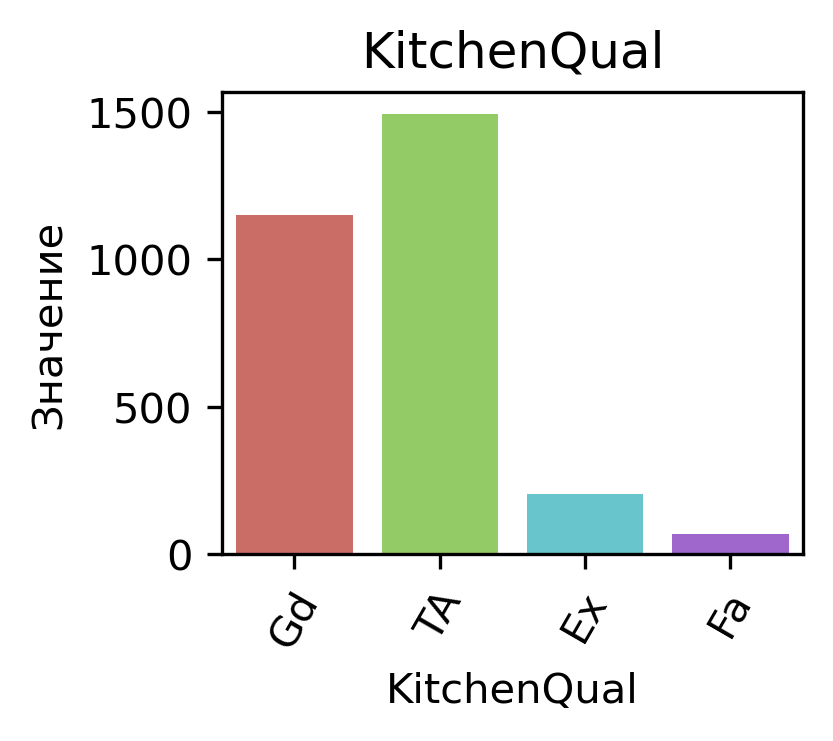

Functional
Typ     0.931436
Min2    0.023997
Min1    0.022283
Mod     0.011999
Maj1    0.006514
Maj2    0.003085
Sev     0.000686
Name: proportion, dtype: float64


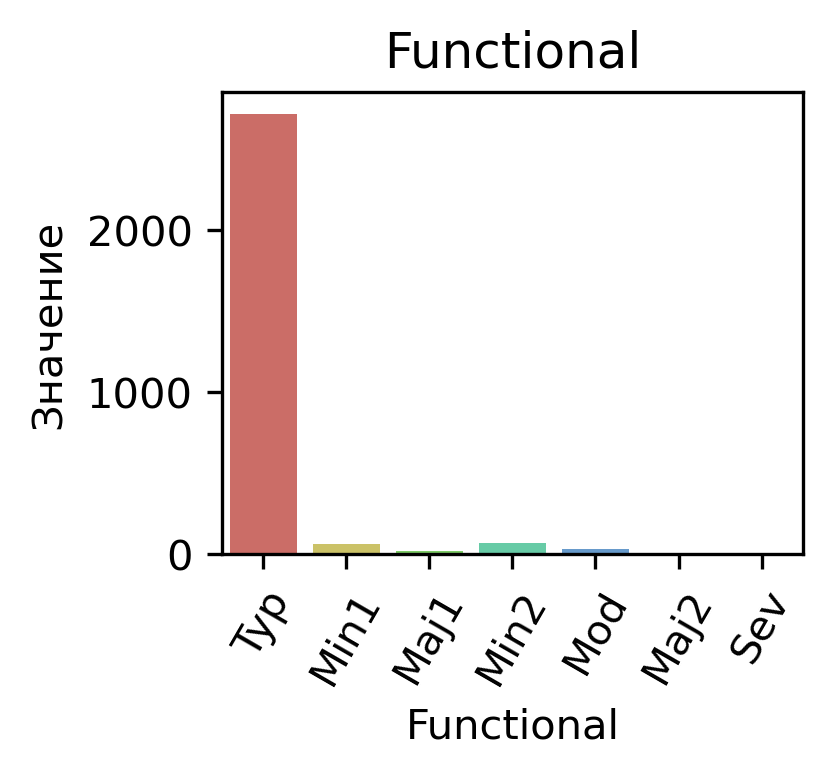

FireplaceQu
Gd    0.496331
TA    0.394930
Fa    0.049366
Po    0.030687
Ex    0.028686
Name: proportion, dtype: float64


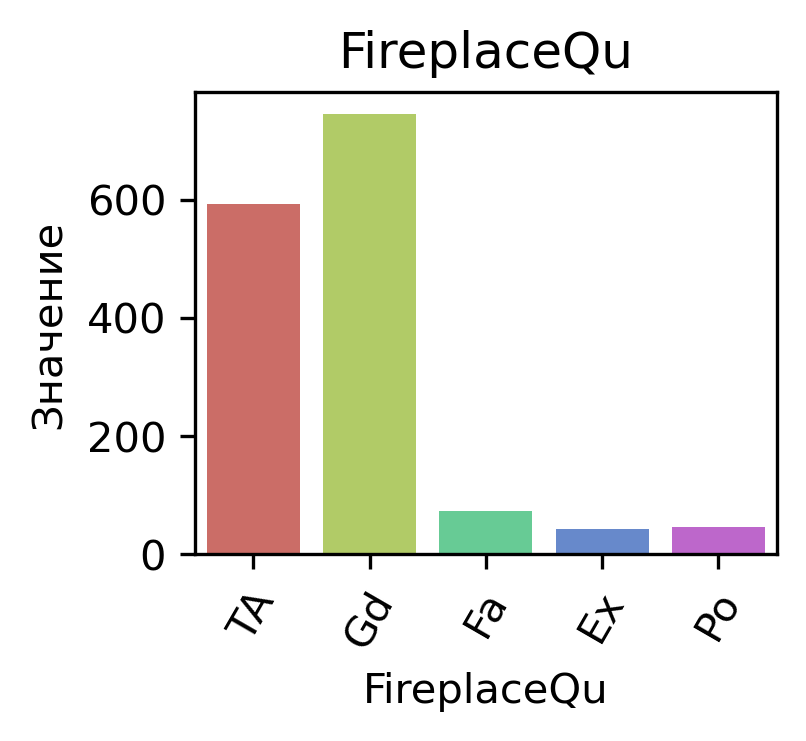

GarageType
Attchd     0.623823
Detchd     0.282042
BuiltIn    0.067343
Basment    0.013034
2Types     0.008327
CarPort    0.005431
Name: proportion, dtype: float64


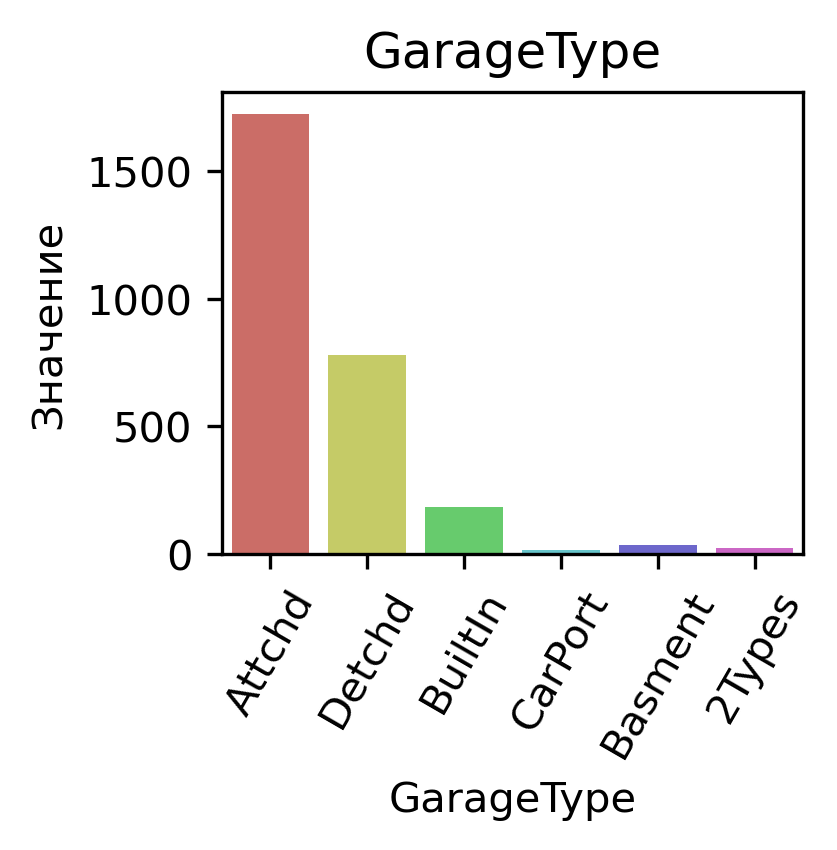

GarageFinish
Unf    0.445652
RFn    0.293841
Fin    0.260507
Name: proportion, dtype: float64


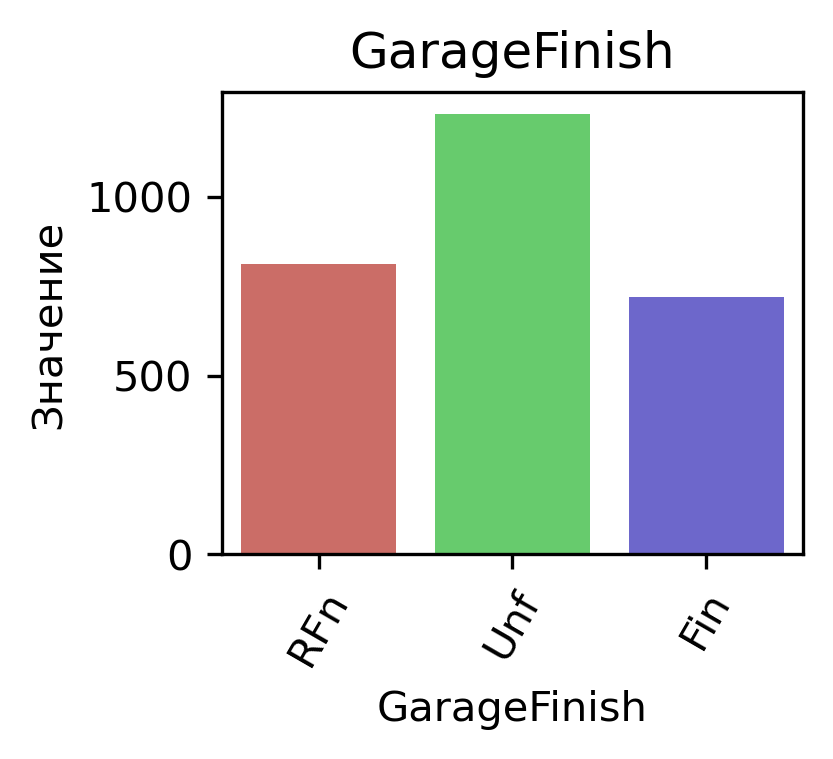

GarageQual
TA    0.943478
Fa    0.044928
Gd    0.008696
Po    0.001812
Ex    0.001087
Name: proportion, dtype: float64


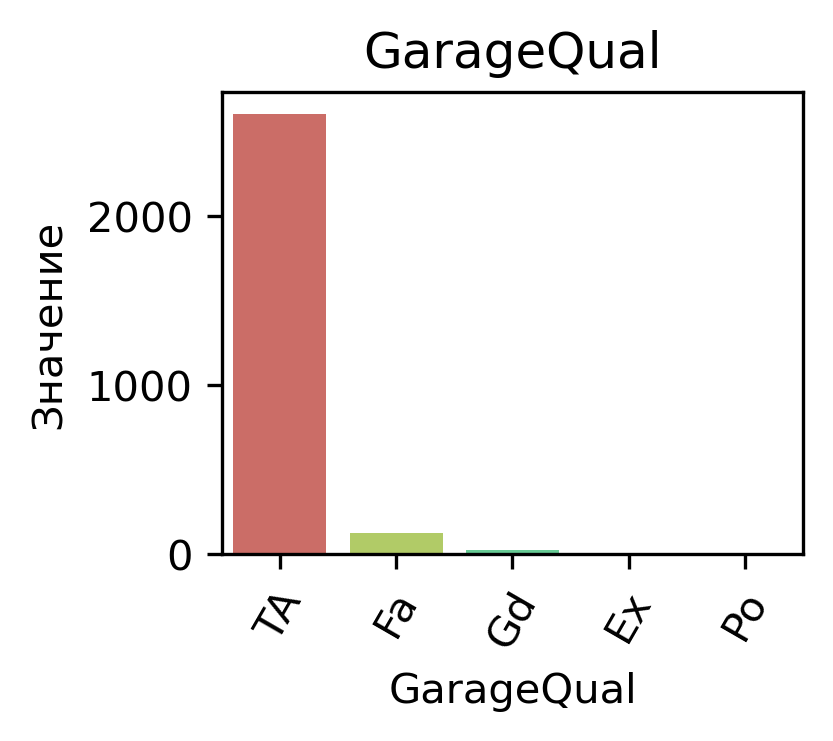

GarageCond
TA    0.961594
Fa    0.026812
Gd    0.005435
Po    0.005072
Ex    0.001087
Name: proportion, dtype: float64


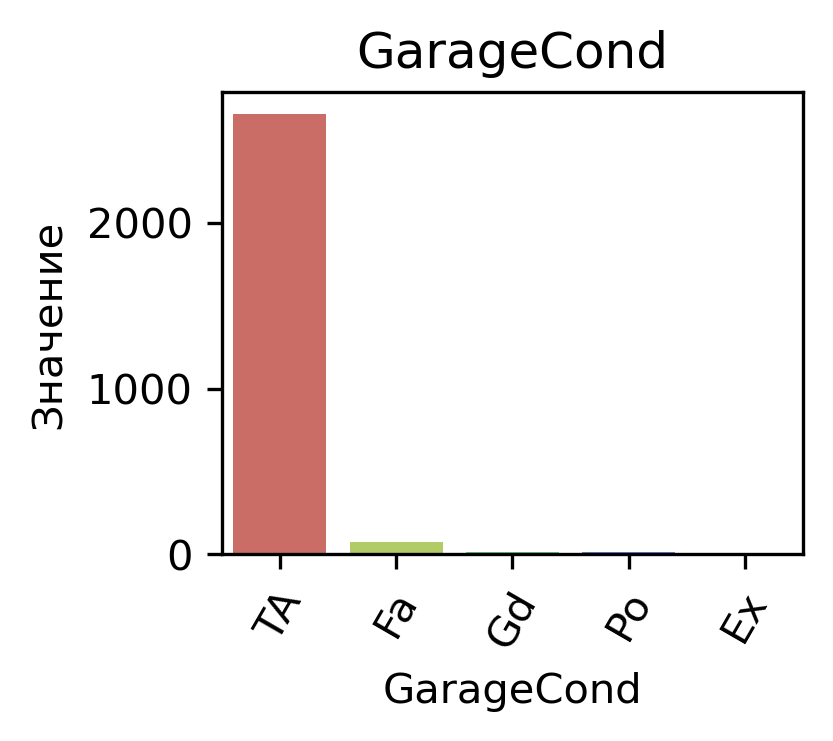

PavedDrive
Y    0.904762
N    0.073998
P    0.021240
Name: proportion, dtype: float64


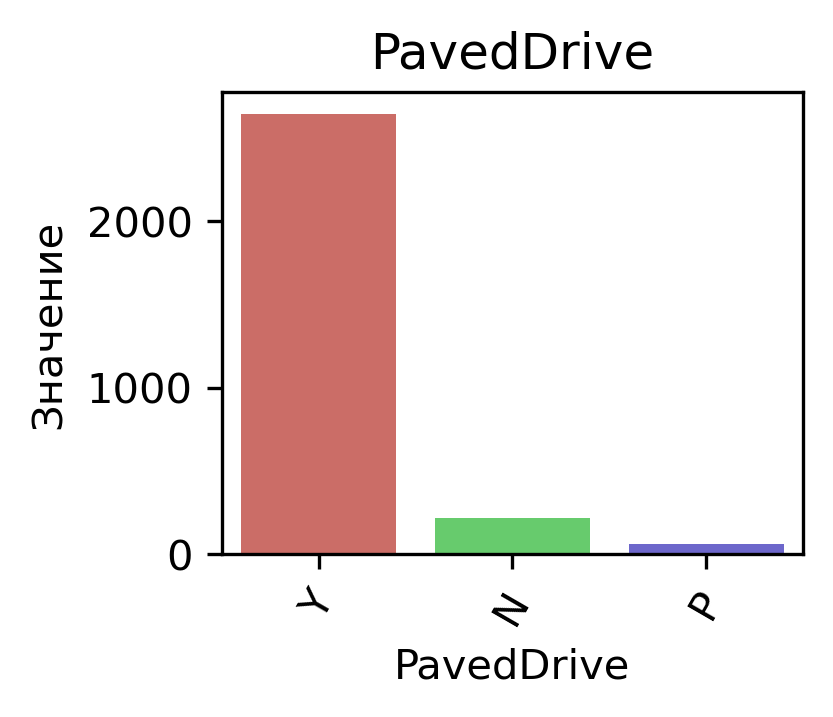

PoolQC
Ex    0.4
Gd    0.4
Fa    0.2
Name: proportion, dtype: float64


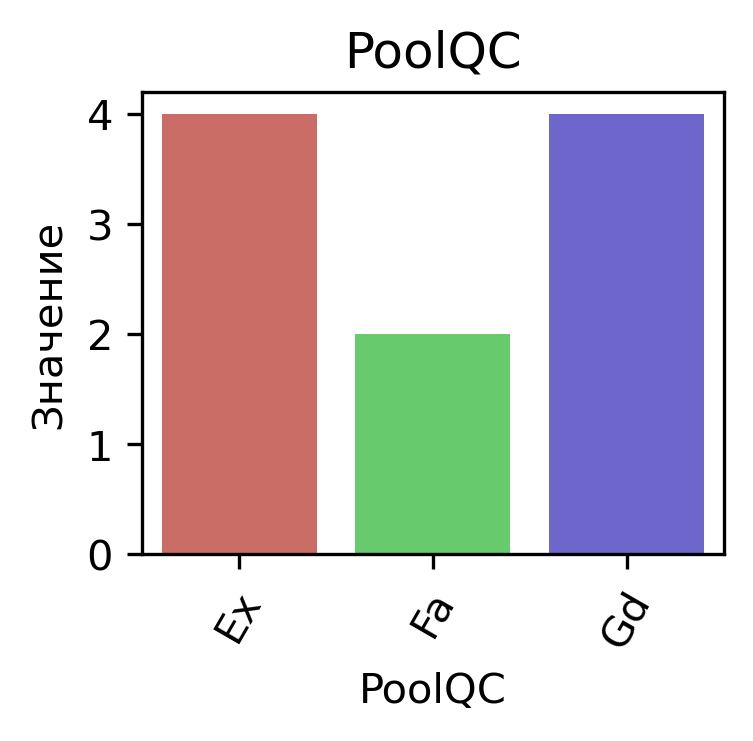

Fence
MnPrv    0.576182
GdPrv    0.206655
GdWo     0.196147
MnWw     0.021016
Name: proportion, dtype: float64


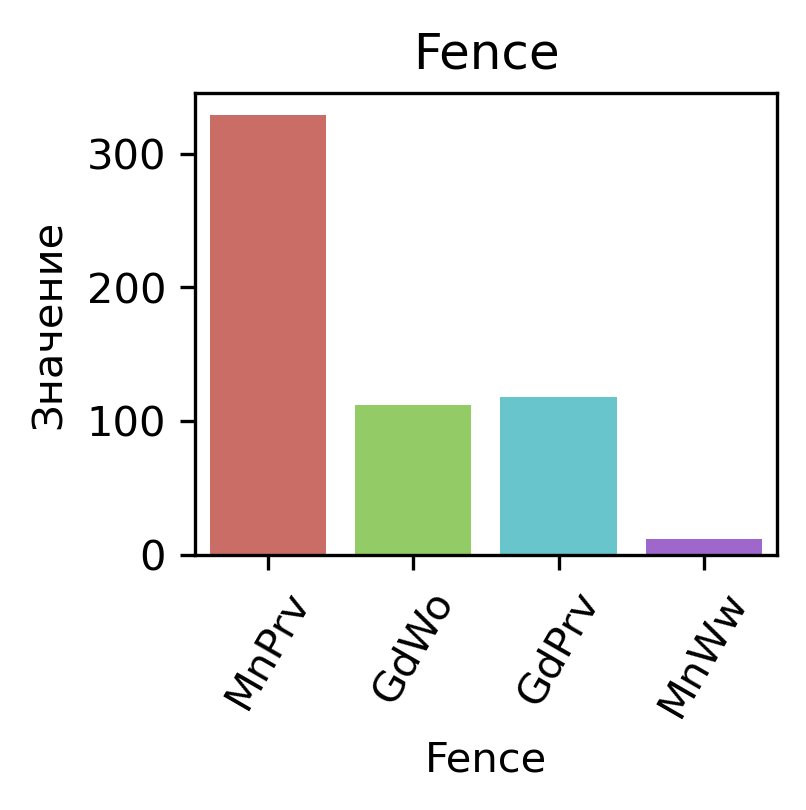

MiscFeature
Shed    0.904762
Gar2    0.047619
Othr    0.038095
TenC    0.009524
Name: proportion, dtype: float64


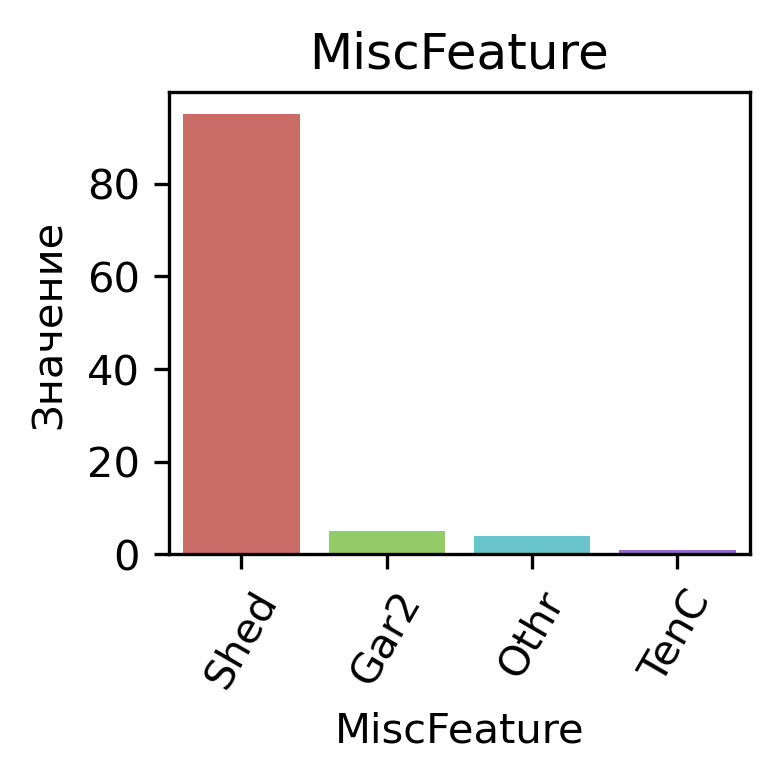

SaleType
WD       0.865319
New      0.081905
COD      0.029815
ConLD    0.008910
CWD      0.004112
ConLI    0.003084
ConLw    0.002742
Oth      0.002399
Con      0.001714
Name: proportion, dtype: float64


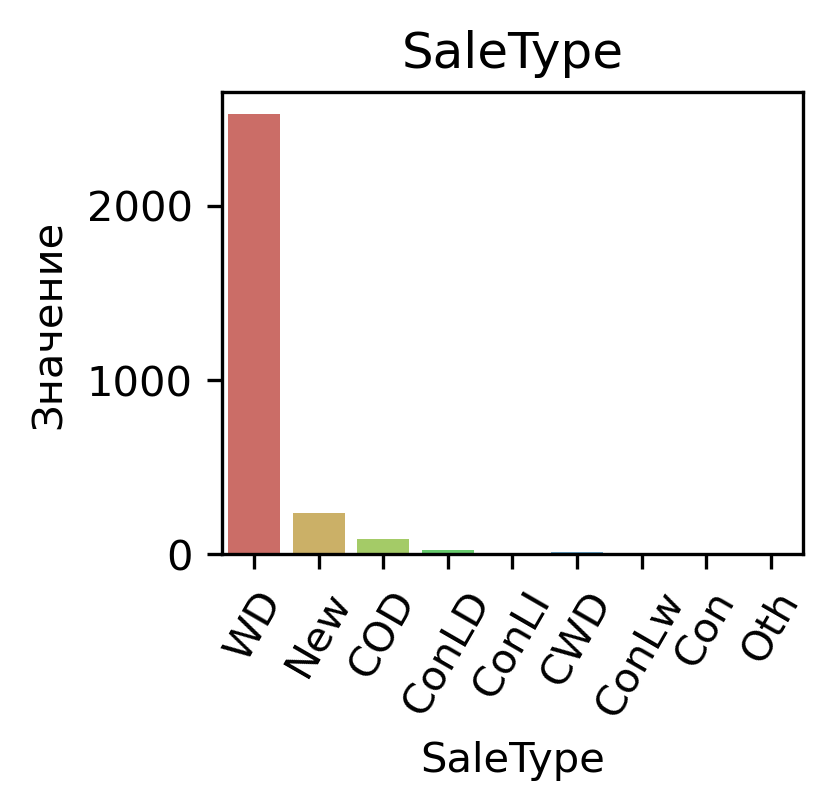

SaleCondition
Normal     0.822885
Partial    0.083933
Abnorml    0.065091
Family     0.015759
Alloca     0.008222
AdjLand    0.004111
Name: proportion, dtype: float64


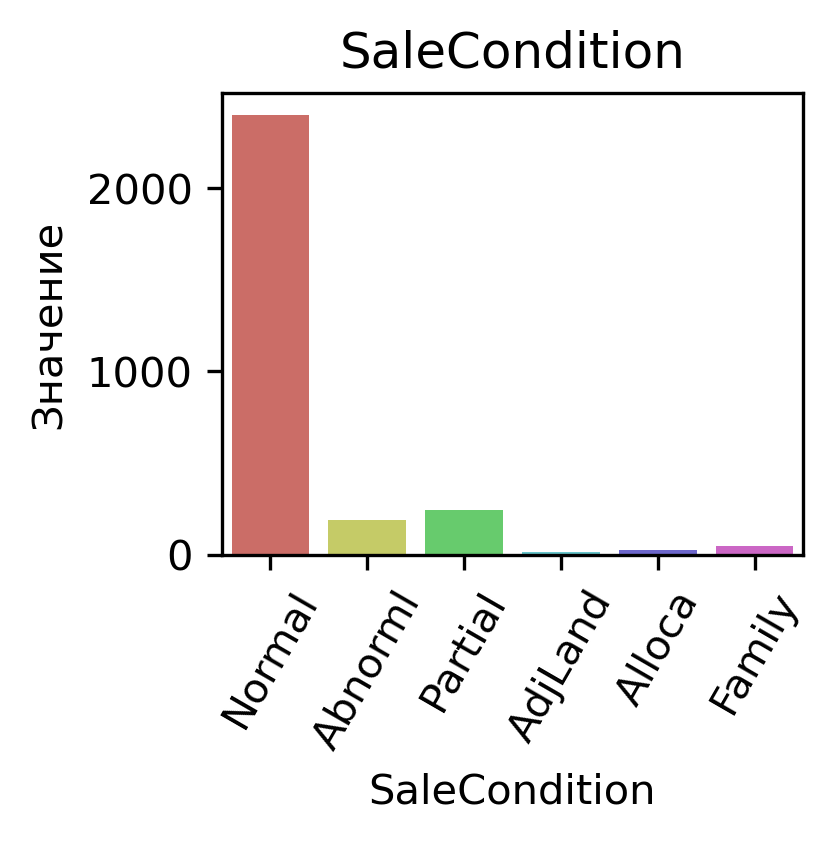

In [742]:
for col in df_cat_columns.drop("SalePrice", axis=1).columns:
    drow_countplot(df, col)

In [743]:
#Колонки, которые имеют очень сильный дисбаланс и которые нужно удалить
potencial_drop_cols = ["Condition2", "RoofMatl", "Heating"]
df_cat_columns.drop(["Street", "Utilities"], axis=1, inplace=True)

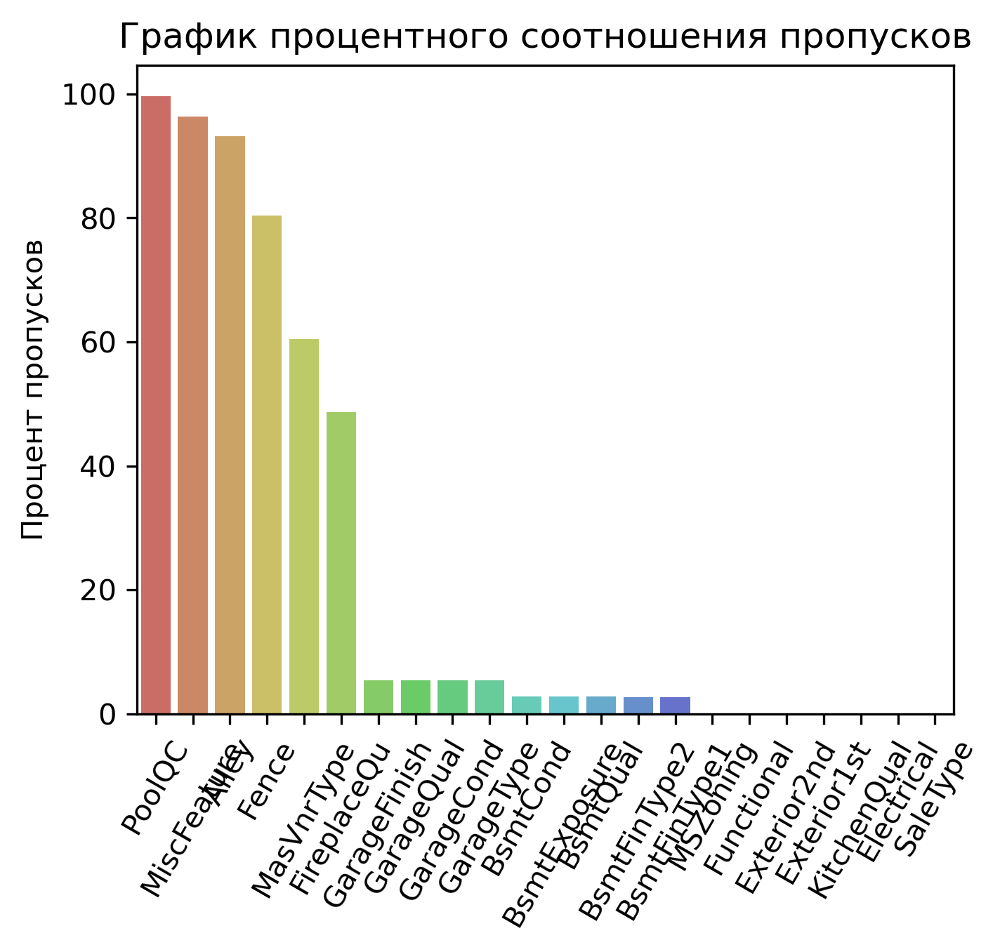

In [744]:
#Посмотрим количество пропусков
is_null_cat_columns = pd.DataFrame({"Пропуски": np.round(df_cat_columns.drop("SalePrice", axis=1).isna().sum() / len(df_cat_columns) * 100, 3)})
is_null_cat_columns = is_null_cat_columns[is_null_cat_columns["Пропуски"]>0].sort_values(by="Пропуски", ascending=False)
drow_barplot(is_null_cat_columns["Пропуски"])

### Анализ
- Если смотреть по документации, то наличие пропусков также является отсутсвие какого-либо отрибута в данных, то есть пропуски логичнее всего заполнять с помощью новой категории

In [673]:
#Удалили бы данные колонки, если бы не документация
'''
#Удалим колонки, в которых пропусков больше 60%
df_cat_columns.drop(is_null_cat_columns[is_null_cat_columns["Пропуски"]>60].index.values, axis=1, inplace=True)
print("Данные колонки были успешно удалены!")
'''

'\n#Удалим колонки, в которых пропусков больше 60%\ndf_cat_columns.drop(is_null_cat_columns[is_null_cat_columns["Пропуски"]>60].index.values, axis=1, inplace=True)\nprint("Данные колонки были успешно удалены!")\n'

In [745]:
for col in is_null_cat_columns[is_null_cat_columns["Пропуски"]>=1].index.values:
    df_cat_columns[col].fillna("None_val", inplace=True)

In [747]:
is_null_cat_columns = pd.DataFrame({"Пропуски": np.round(df_cat_columns.drop("SalePrice", axis=1).isna().sum() / len(df_cat_columns) * 100, 3)})
is_null_cat_columns = is_null_cat_columns[is_null_cat_columns["Пропуски"]>0].sort_values(by="Пропуски", ascending=False)

In [748]:
#Заполним пропуски с помощью KNN, где очень мало пропусков
for col in is_null_cat_columns.index.values:
    train_index, test_index = df_cat_columns[df_cat_columns[col].notna()].index, df_cat_columns[df_cat_columns[col].isnull()].index
    X_train = df_num_columns.drop("SalePrice", axis=1).loc[train_index]
    y_train = df_cat_columns.loc[train_index][col]

    X_missing = df_num_columns.drop("SalePrice", axis=1).loc[test_index]

    fillna_model = KNeighborsClassifier(n_neighbors=3)
    fillna_model.fit(X_train, y_train)
        
    df_cat_columns.loc[test_index, col] = fillna_model.predict(X_missing)
print("Все пропуски были заполнены!")

Все пропуски были заполнены!


In [749]:
#Посмотрим сумарное количество пропусков
print(f"Суммарное количество пропусков: {df_cat_columns.drop("SalePrice", axis=1).isna().sum().sum()}")

Суммарное количество пропусков: 0


In [750]:
#Функция которая отрисовывает ящики с усами для целевой переменной  для различных категорий
#Также в ней будет тест ANOVA, которая показывает, влияет ли категория на целевое значение
def drow_boxplot_cat(df, col):
    categories = df_cat_columns[col].unique()
    category_groups = [
        df_cat_columns[df_cat_columns["SalePrice"].notna()]["SalePrice"][df_cat_columns[col] == category] 
        for category in categories if not pd.isna(category)
    ]
    f_statistic, p_value = f_oneway(*category_groups)
    print("-----------------------------------")
    print(np.round(df.groupby(col)["SalePrice"].mean(), 3))
    print("-----------------------------------")
    print(f"Статистика: {round(f_statistic, 3)}")
    print("-----------------------------------")
    print("Признак важен") if p_value < 0.05 else print("Признак не важен")
    fig = plt.figure(figsize=(3, 2.5), dpi=400)
    plt.title("Значение")
    sns.boxplot(data=df, y="SalePrice", hue=col)
    plt.show()

-----------------------------------
MSZoning
C (all)     74528.000
FV         214014.062
RH         131558.375
RL         191004.995
RM         126316.830
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 43.84
-----------------------------------
Признак важен


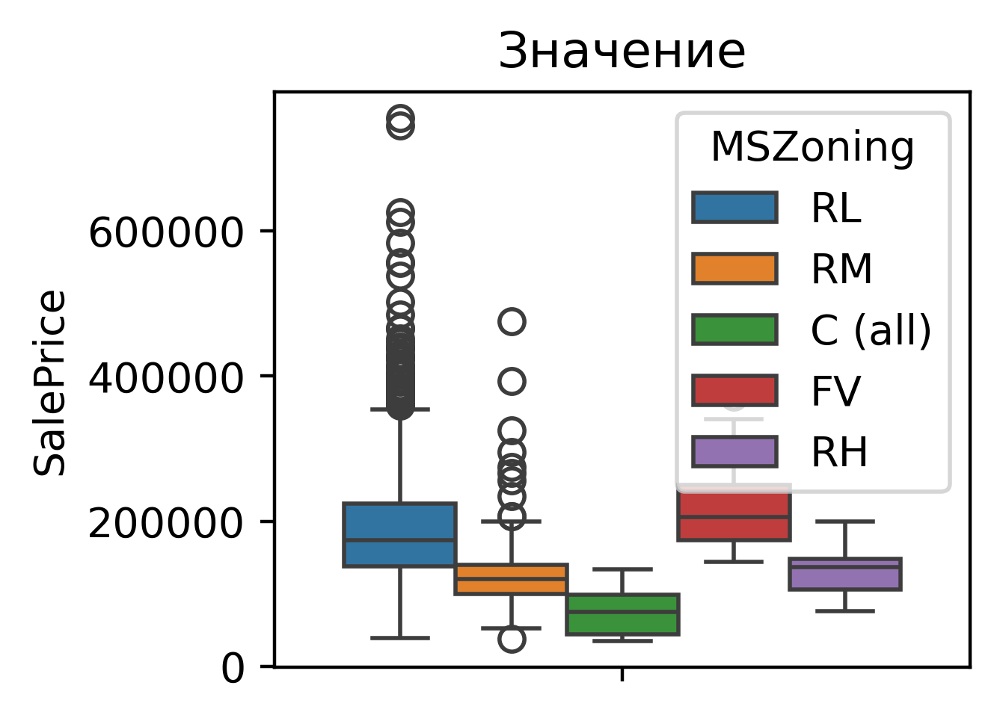

-----------------------------------
Alley
Grvl        122219.080
None_val    183452.131
Pave        168000.585
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 15.177
-----------------------------------
Признак важен


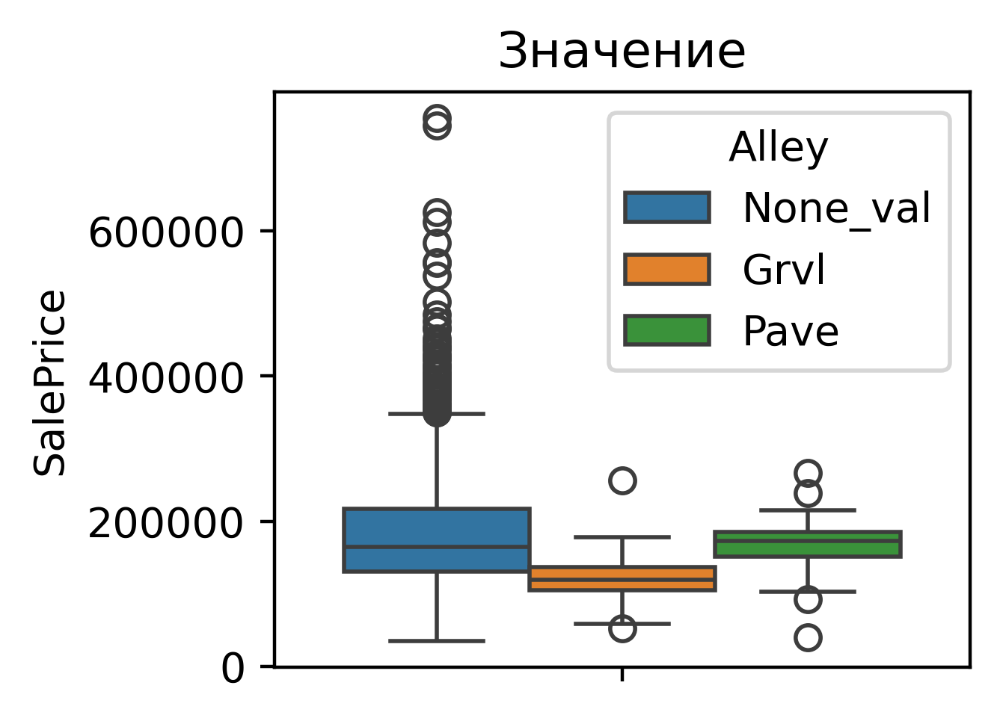

-----------------------------------
LotShape
IR1    206101.665
IR2    239833.366
IR3    216036.500
Reg    164754.818
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 40.133
-----------------------------------
Признак важен


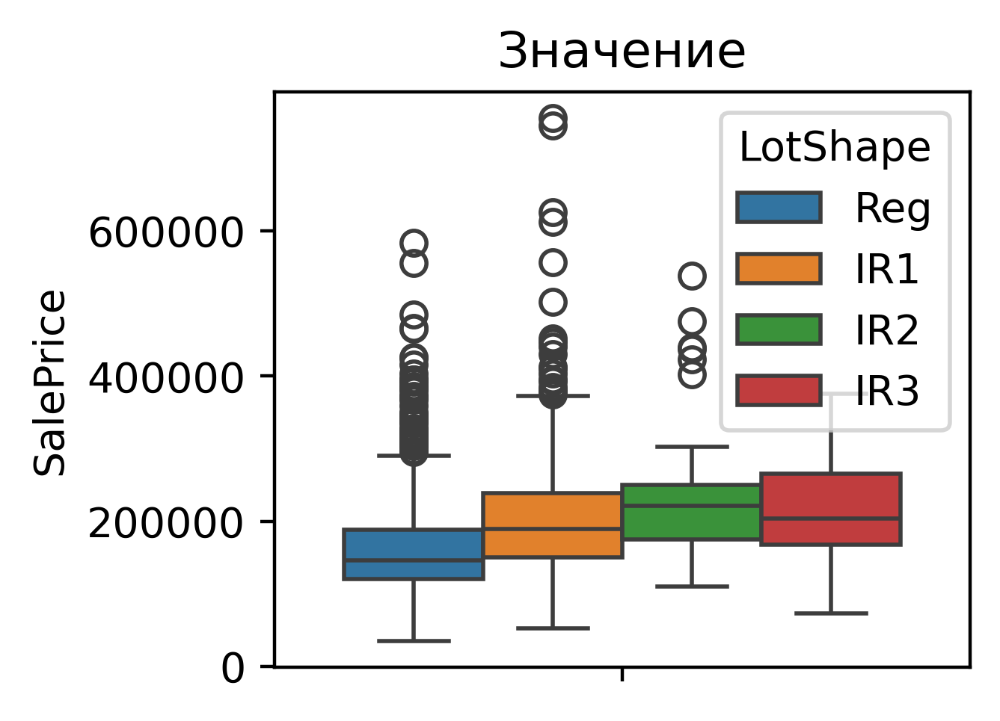

-----------------------------------
LandContour
Bnk    143104.079
HLS    231533.940
Low    203661.111
Lvl    180183.747
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 12.85
-----------------------------------
Признак важен


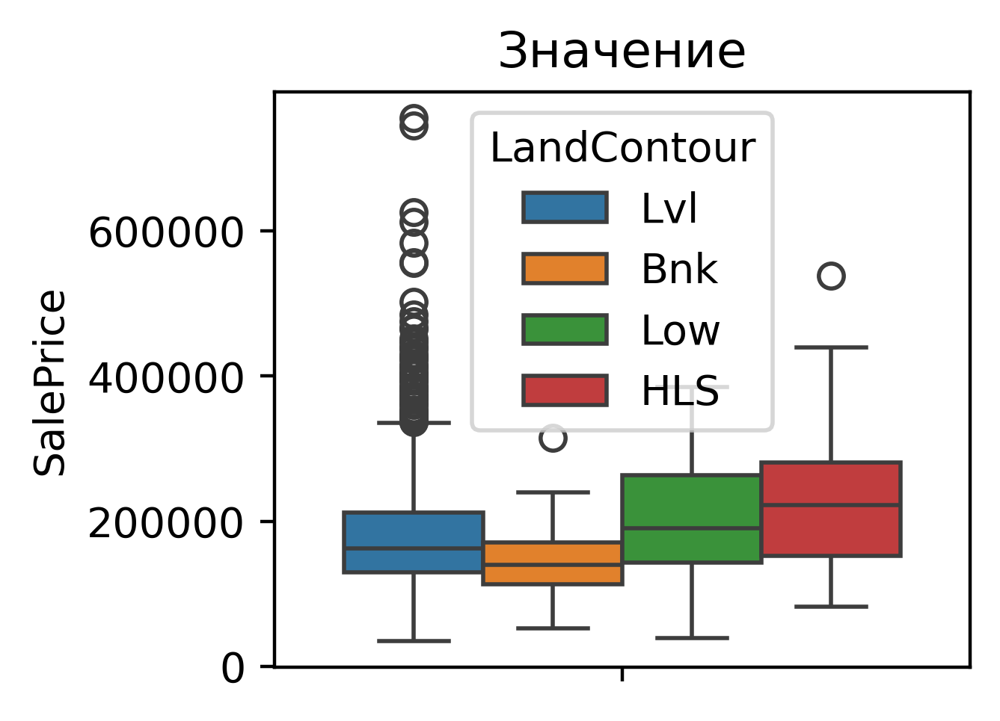

-----------------------------------
LotConfig
Corner     181623.426
CulDSac    223854.617
FR2        177934.574
FR3        208475.000
Inside     176938.048
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 7.81
-----------------------------------
Признак важен


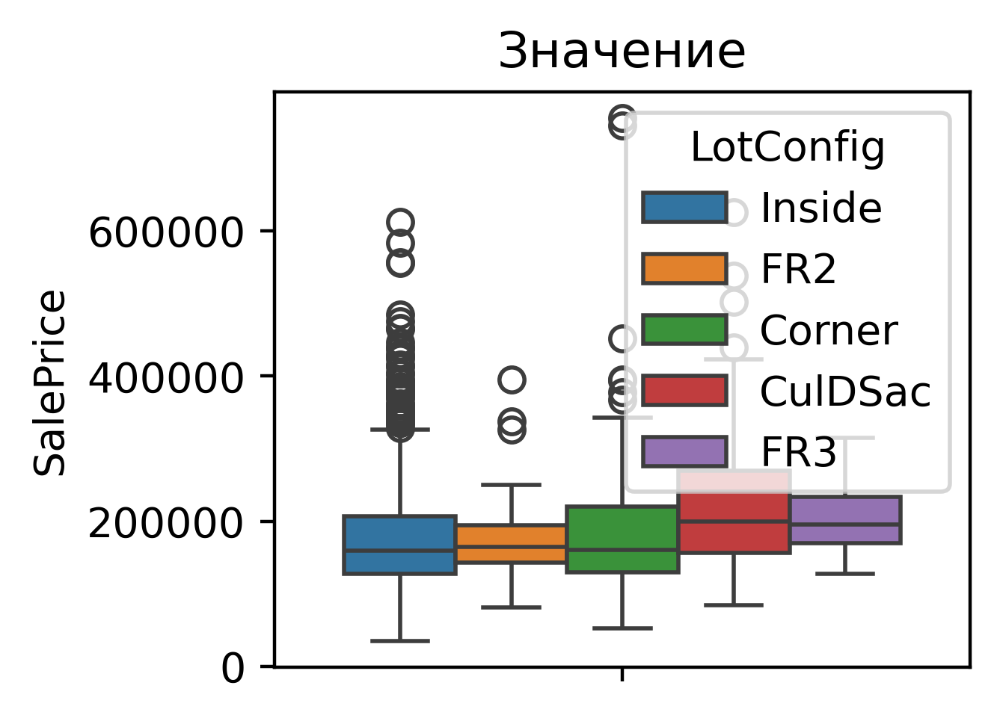

-----------------------------------
LandSlope
Gtl    179956.800
Mod    196734.138
Sev    204379.231
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 1.959
-----------------------------------
Признак не важен


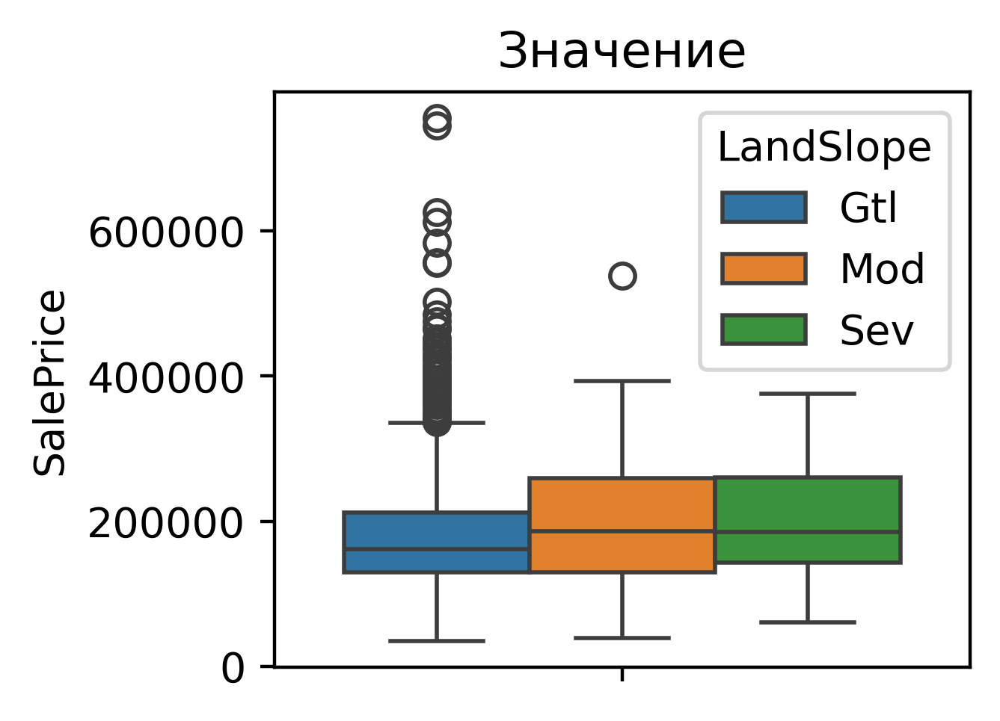

-----------------------------------
Neighborhood
Blmngtn    194870.882
Blueste    137500.000
BrDale     104493.750
BrkSide    124834.052
ClearCr    212565.429
CollgCr    197965.773
Crawfor    210624.725
Edwards    128219.700
Gilbert    192854.506
IDOTRR     100123.784
MeadowV     98576.471
Mitchel    156270.122
NAmes      145847.080
NPkVill    142694.444
NWAmes     189050.068
NoRidge    335295.317
NridgHt    316270.623
OldTown    128225.301
SWISU      142591.360
Sawyer     136793.135
SawyerW    186555.797
Somerst    225379.837
StoneBr    310499.000
Timber     242247.447
Veenker    238772.727
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 71.785
-----------------------------------
Признак важен


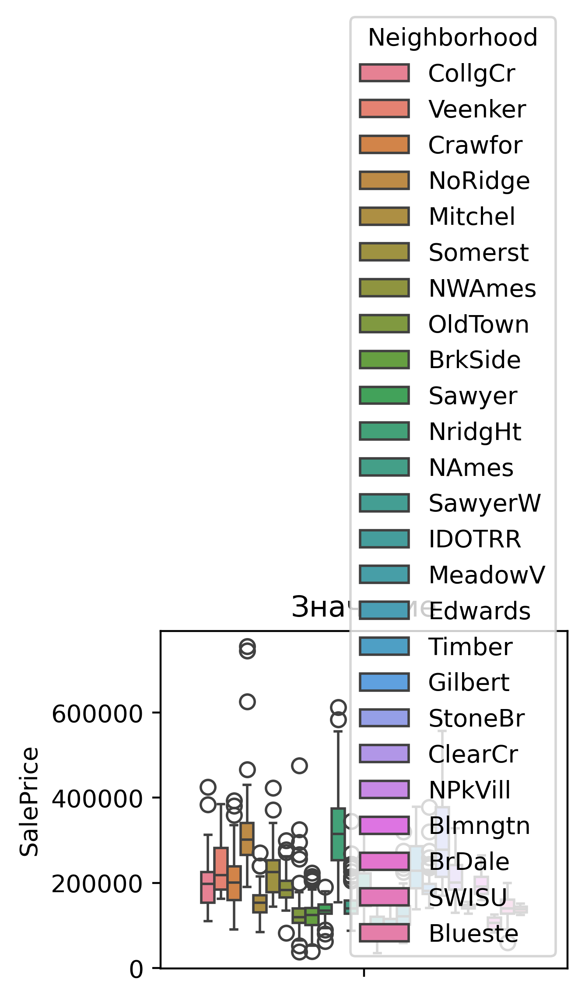

-----------------------------------
Condition1
Artery    135091.667
Feedr     142475.481
Norm      184495.492
PosA      225875.000
PosN      215184.211
RRAe      138400.000
RRAn      184396.615
RRNe      190750.000
RRNn      212400.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 6.118
-----------------------------------
Признак важен


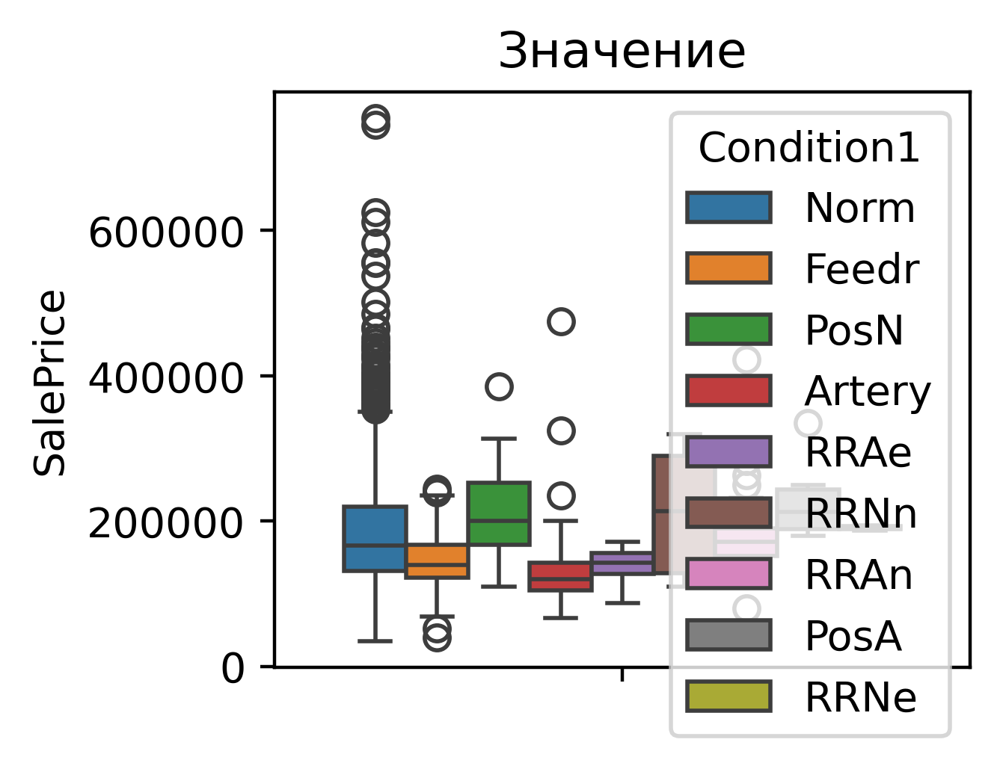

-----------------------------------
Condition2
Artery    106500.000
Feedr     121166.667
Norm      181169.406
PosA      325000.000
PosN      284875.000
RRAe      190000.000
RRAn      136905.000
RRNn       96750.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 2.074
-----------------------------------
Признак важен


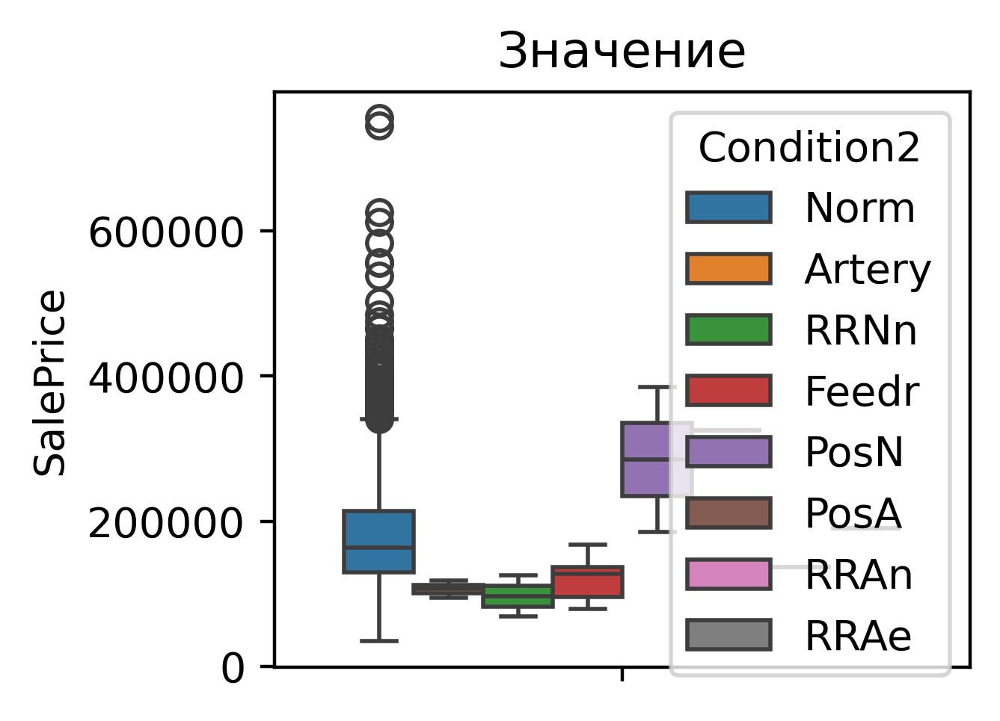

-----------------------------------
BldgType
1Fam      185763.807
2fmCon    128432.258
Duplex    133541.077
Twnhs     135911.628
TwnhsE    181959.342
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 13.011
-----------------------------------
Признак важен


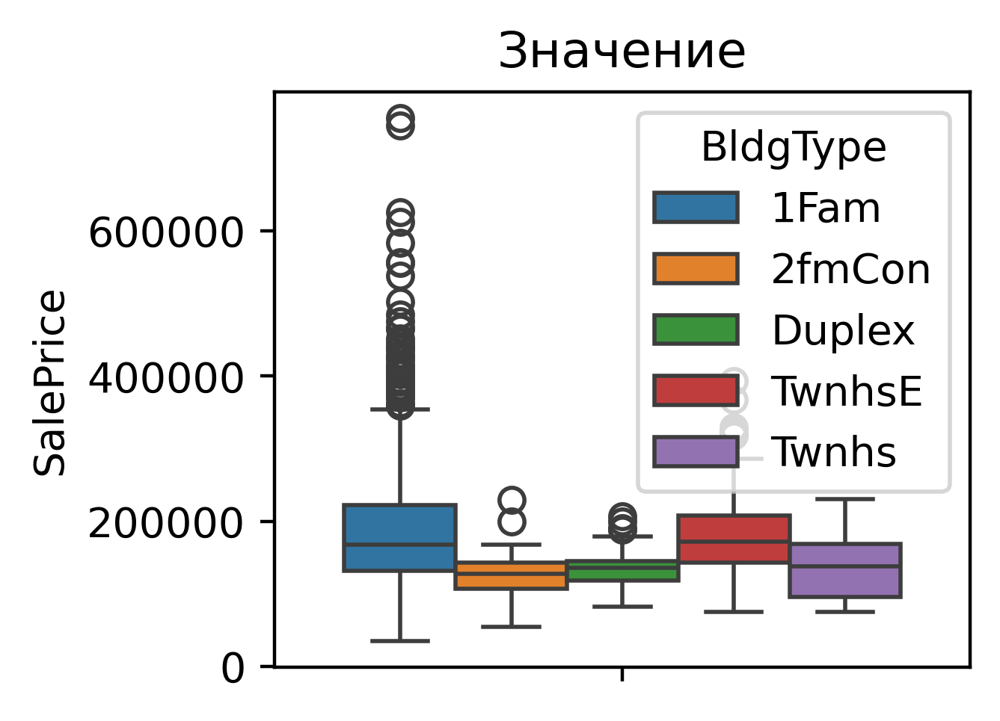

-----------------------------------
HouseStyle
1.5Fin    143116.740
1.5Unf    110150.000
1Story    175985.478
2.5Fin    220000.000
2.5Unf    157354.545
2Story    210051.764
SFoyer    135074.486
SLvl      166703.385
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 19.595
-----------------------------------
Признак важен


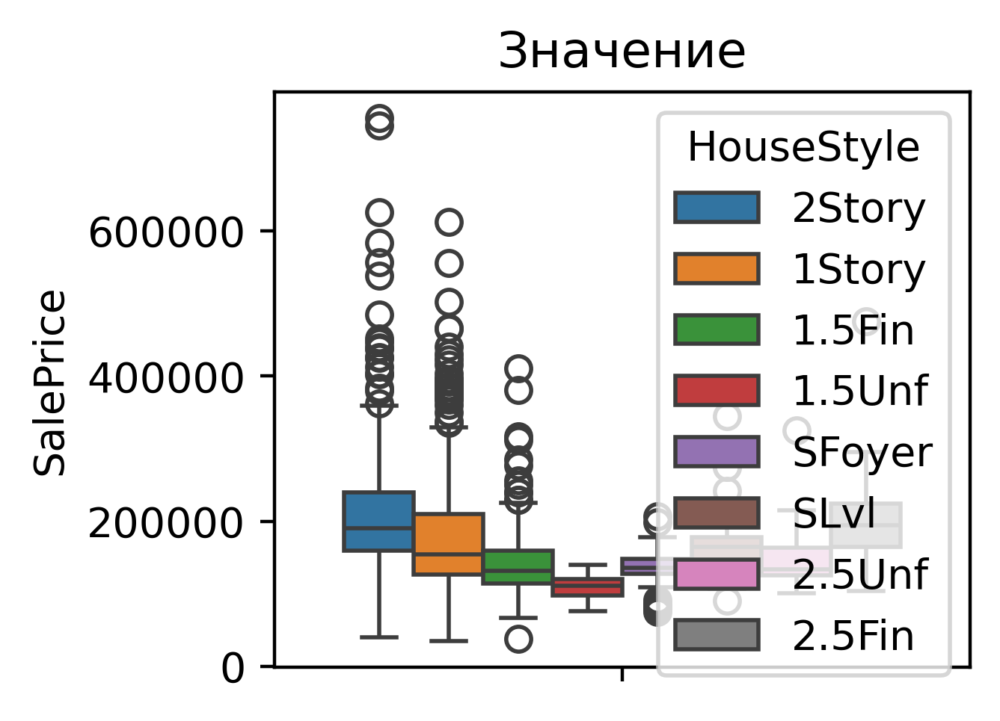

-----------------------------------
RoofStyle
Flat       194690.000
Gable      171483.956
Gambrel    148909.091
Hip        218876.934
Mansard    180568.429
Shed       225000.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 17.805
-----------------------------------
Признак важен


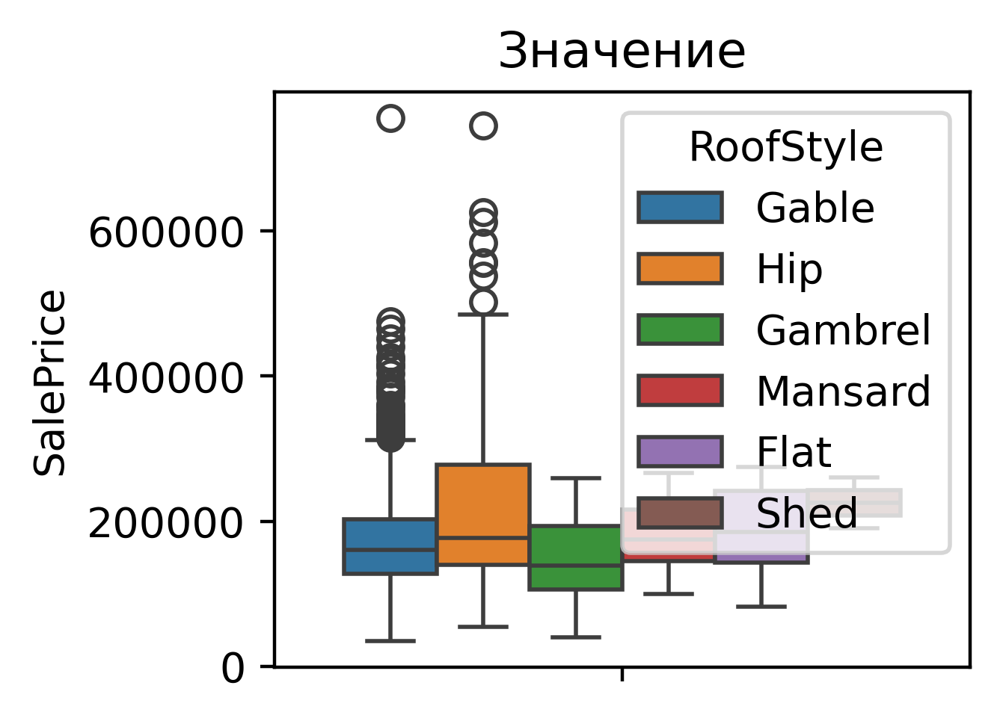

-----------------------------------
RoofMatl
ClyTile    160000.000
CompShg    179803.679
Membran    241500.000
Metal      180000.000
Roll       137000.000
Tar&Grv    185406.364
WdShake    241400.000
WdShngl    390250.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 6.727
-----------------------------------
Признак важен


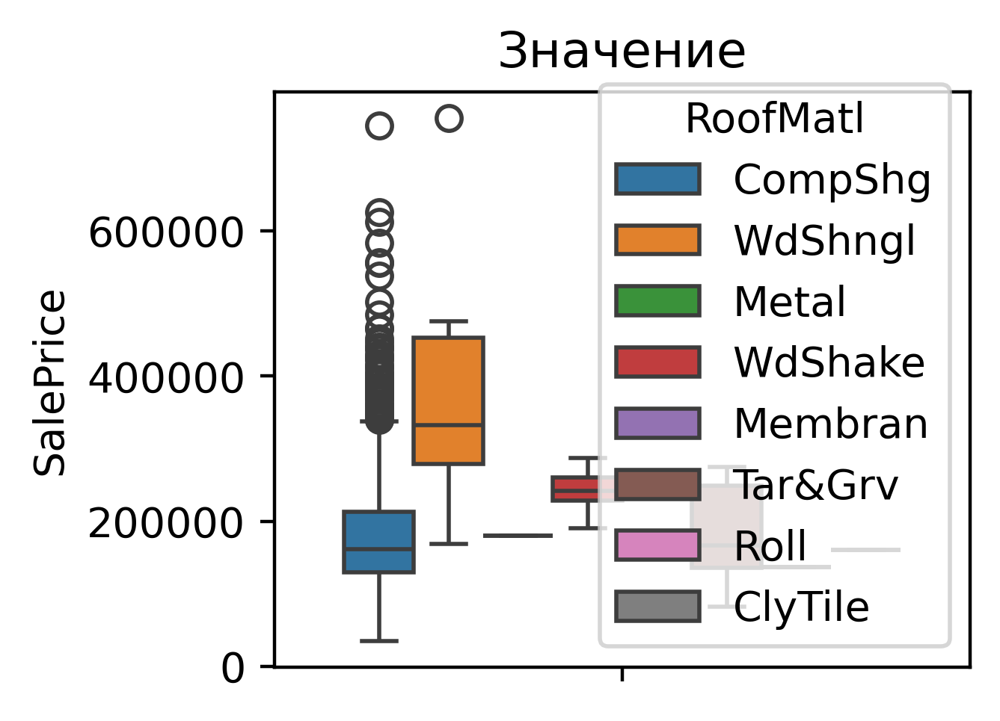

-----------------------------------
Exterior1st
AsbShng    107385.550
AsphShn    100000.000
BrkComm     71000.000
BrkFace    194573.000
CBlock     105000.000
CemntBd    231690.656
HdBoard    163077.450
ImStucc    262000.000
MetalSd    149422.177
Plywood    175942.380
Stone      258500.000
Stucco     162990.000
VinylSd    213732.901
Wd Sdng    149841.646
WdShing    150655.077
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 18.612
-----------------------------------
Признак важен


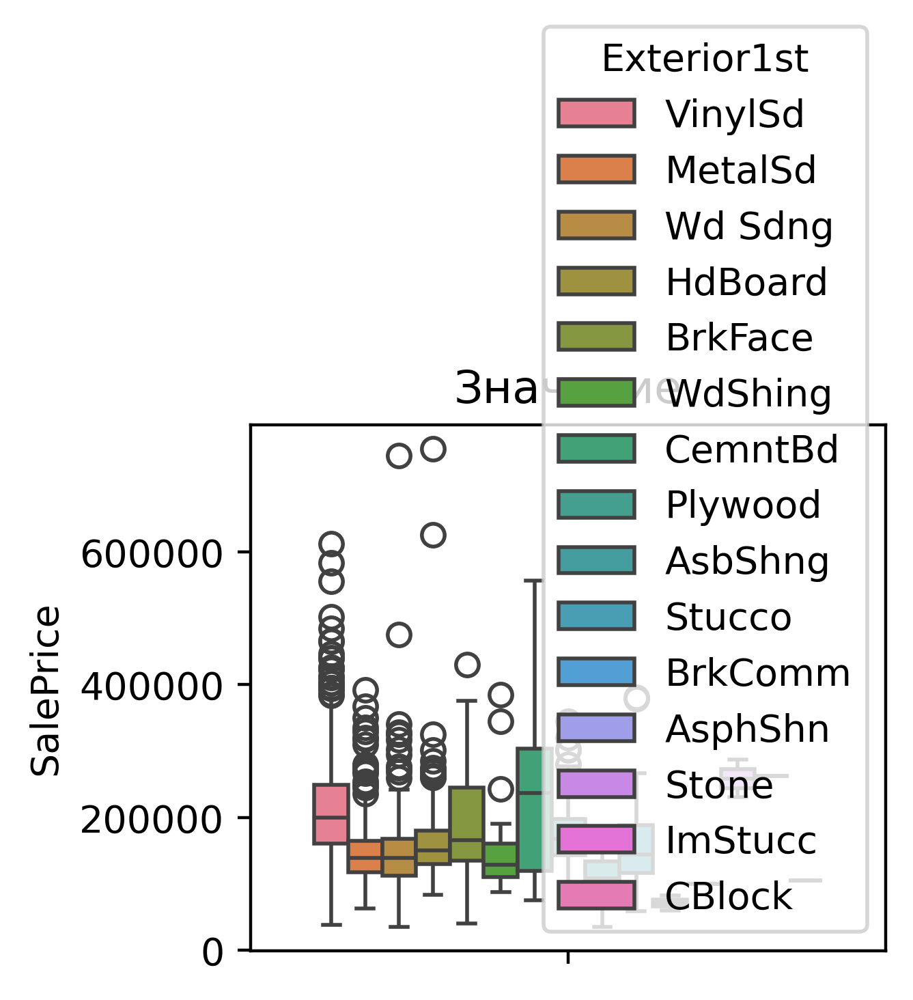

-----------------------------------
Exterior2nd
AsbShng    114060.550
AsphShn    138000.000
Brk Cmn    126714.286
BrkFace    195818.000
CBlock     105000.000
CmentBd    230093.833
HdBoard    167661.565
ImStucc    252070.000
MetalSd    149803.173
Other      319000.000
Plywood    168112.387
Stone      158224.800
Stucco     155905.154
VinylSd    214432.460
Wd Sdng    148386.066
Wd Shng    161328.947
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 17.501
-----------------------------------
Признак важен


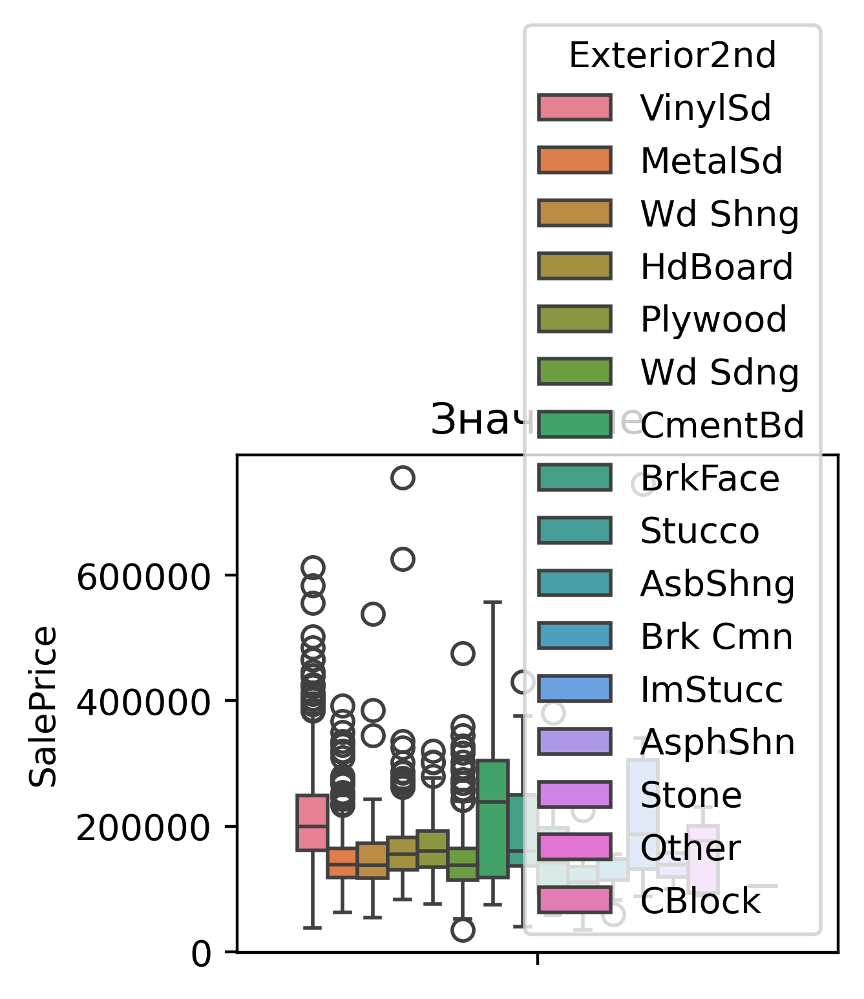

-----------------------------------
MasVnrType
BrkCmn      146318.067
BrkFace     204691.872
None_val    156958.243
Stone       265583.625
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 108.911
-----------------------------------
Признак важен


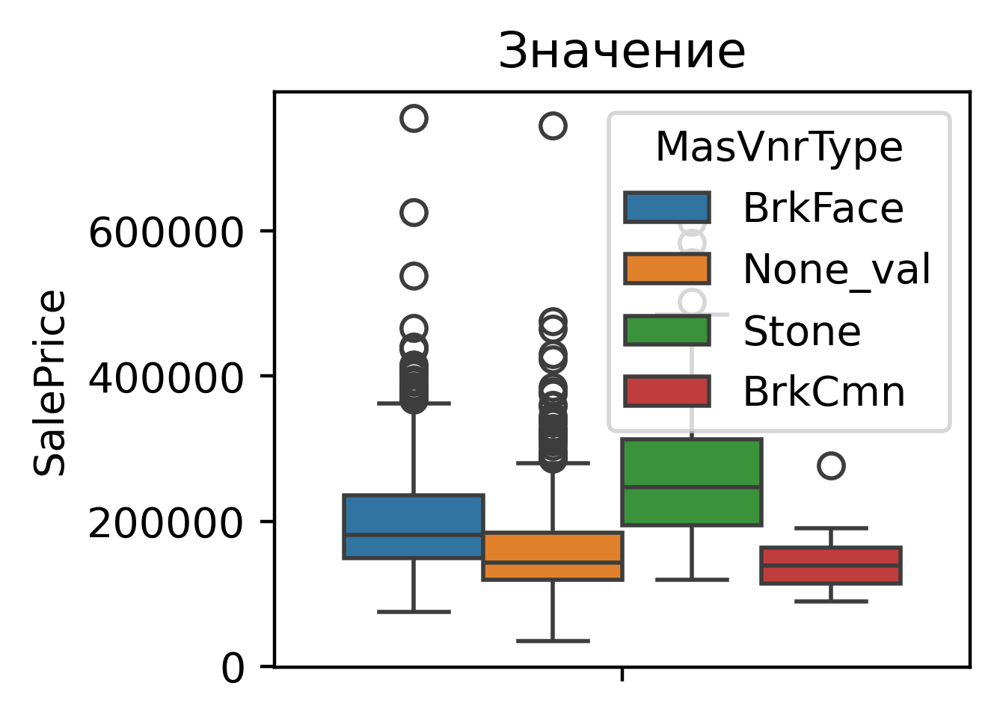

-----------------------------------
ExterQual
Ex    367360.962
Fa     87985.214
Gd    231633.510
TA    144341.313
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 443.335
-----------------------------------
Признак важен


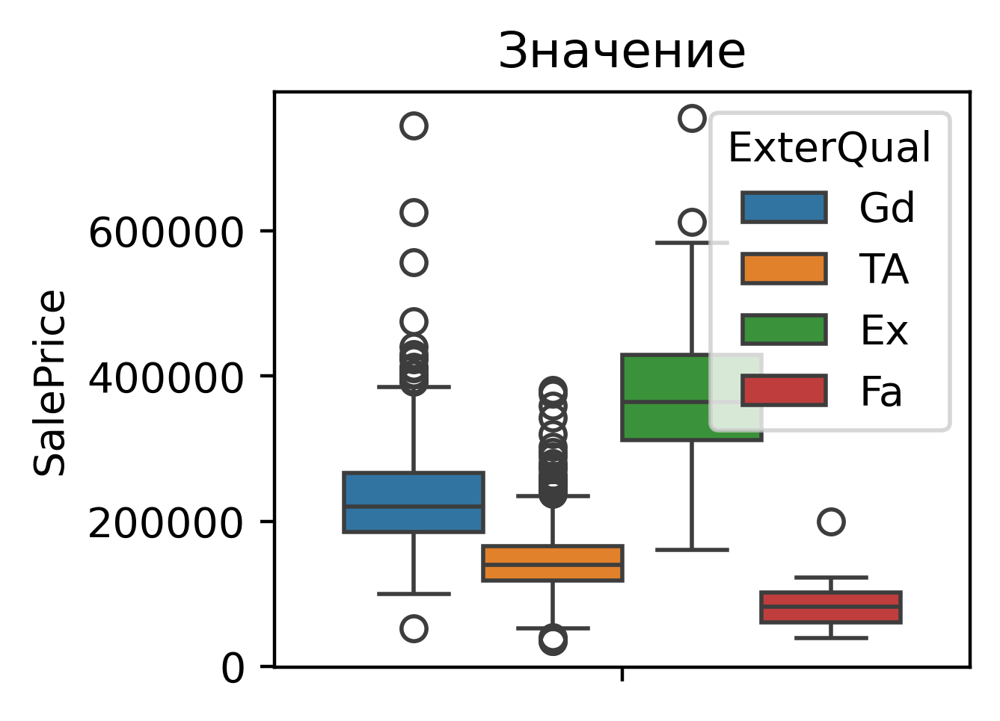

-----------------------------------
ExterCond
Ex    201333.333
Fa    102595.143
Gd    168897.568
Po     76500.000
TA    184034.896
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 8.799
-----------------------------------
Признак важен


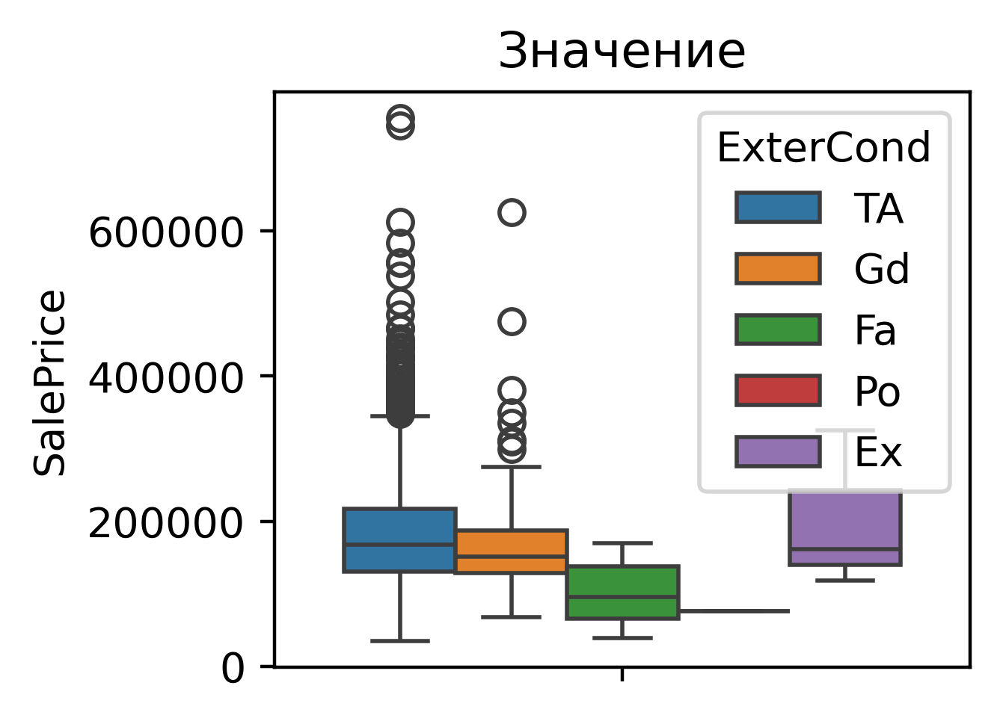

-----------------------------------
Foundation
BrkTil    132291.075
CBlock    149805.715
PConc     225230.442
Slab      107365.625
Stone     165959.167
Wood      185666.667
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 100.254
-----------------------------------
Признак важен


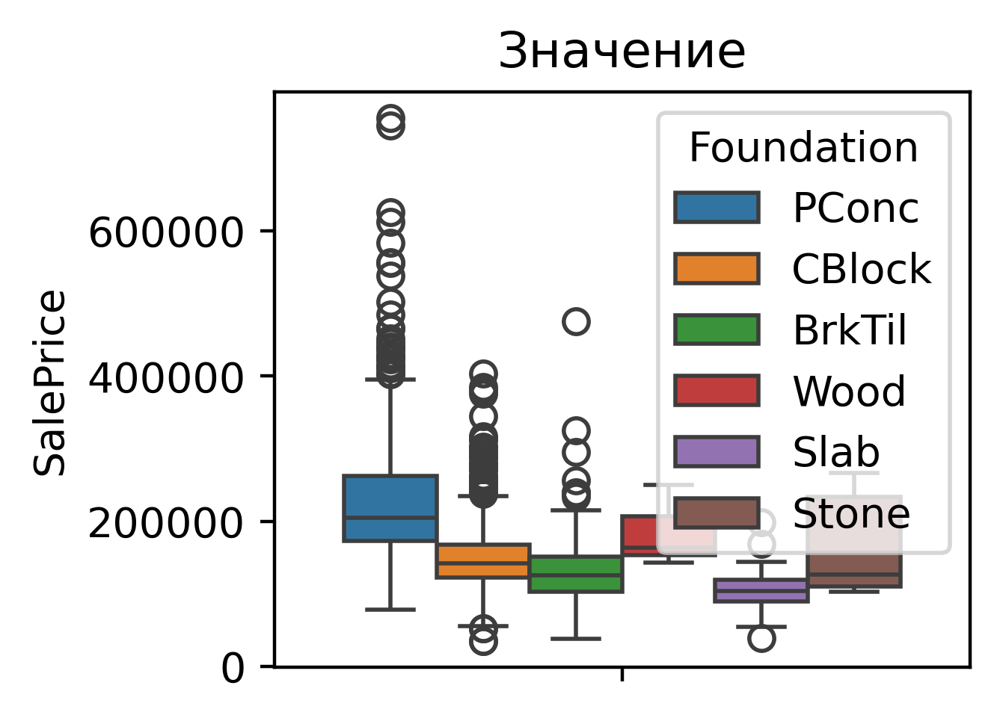

-----------------------------------
BsmtQual
Ex          327041.041
Fa          115692.029
Gd          202688.479
None_val    105652.892
TA          140759.818
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 316.149
-----------------------------------
Признак важен


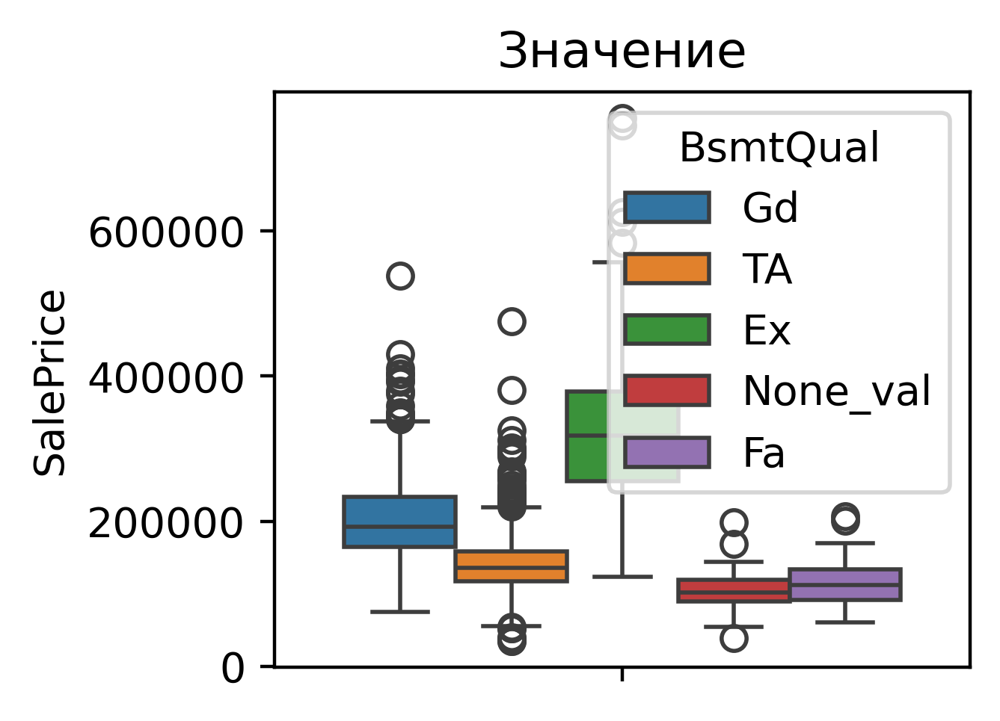

-----------------------------------
BsmtCond
Fa          121809.533
Gd          213599.908
None_val    105652.892
Po           64000.000
TA          183632.621
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 19.708
-----------------------------------
Признак важен


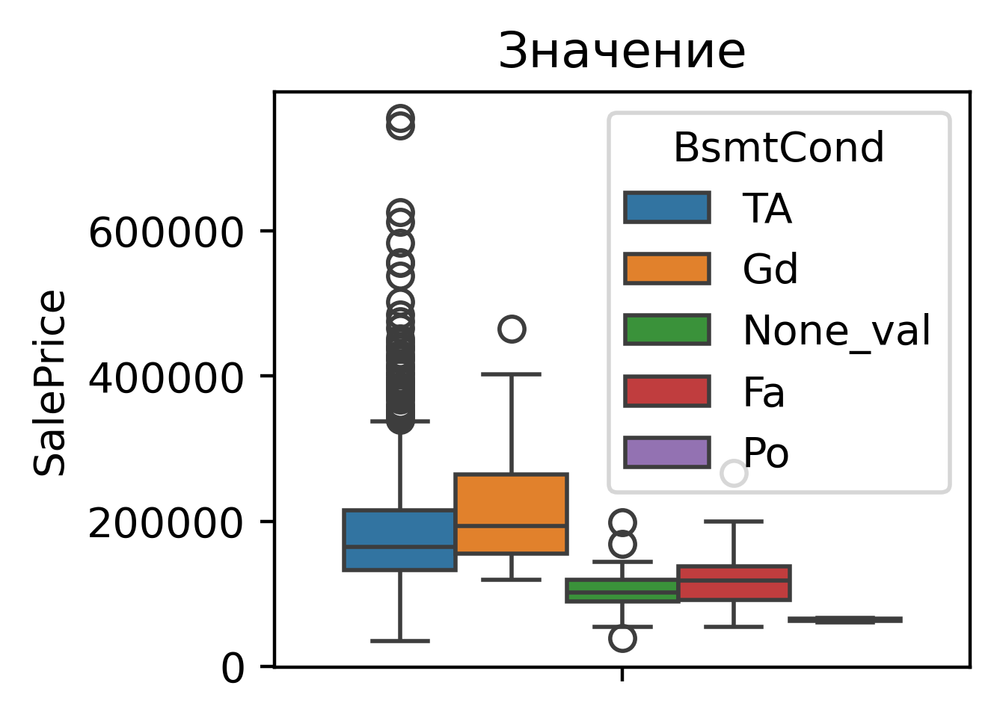

-----------------------------------
BsmtExposure
Av          206643.421
Gd          257689.806
Mn          192789.658
No          165652.296
None_val    107938.342
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 63.94
-----------------------------------
Признак важен


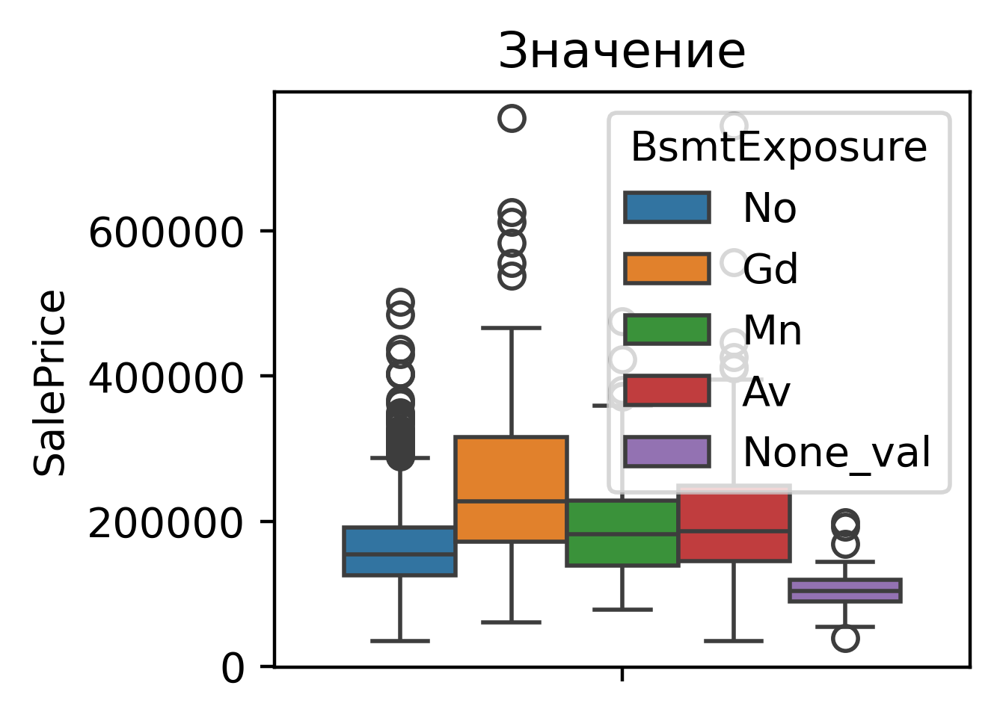

-----------------------------------
BsmtFinType1
ALQ         161573.068
BLQ         149493.655
GLQ         235413.720
LwQ         151852.703
None_val    105652.892
Rec         146889.248
Unf         170670.577
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 64.688
-----------------------------------
Признак важен


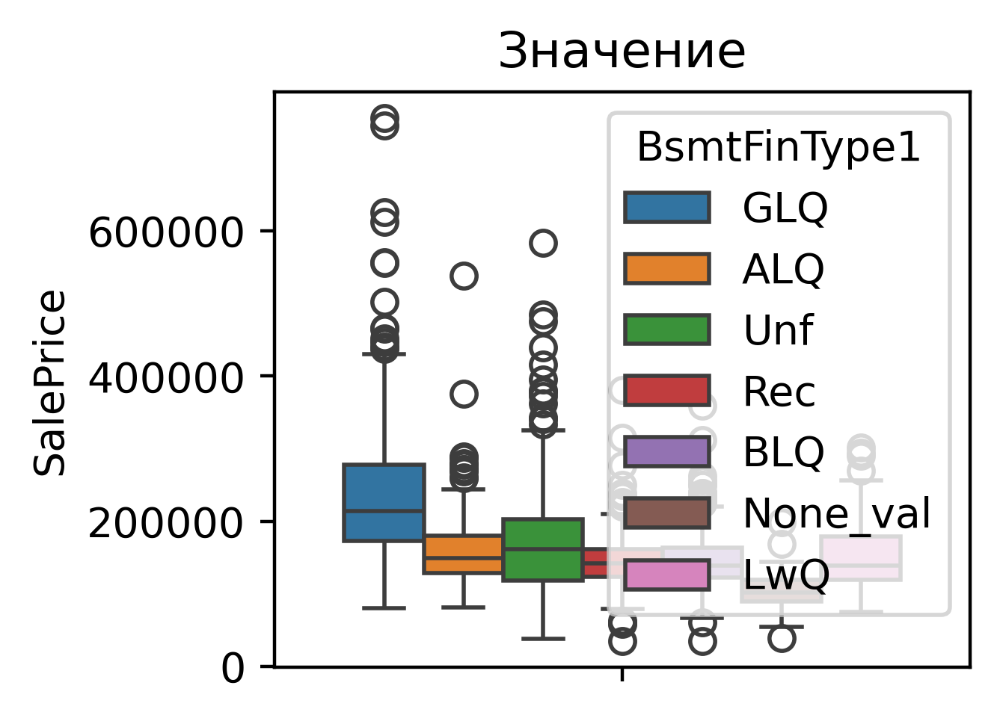

-----------------------------------
BsmtFinType2
ALQ         209942.105
BLQ         151101.000
GLQ         180982.143
LwQ         164364.130
None_val    110346.237
Rec         164917.130
Unf         184694.690
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 7.565
-----------------------------------
Признак важен


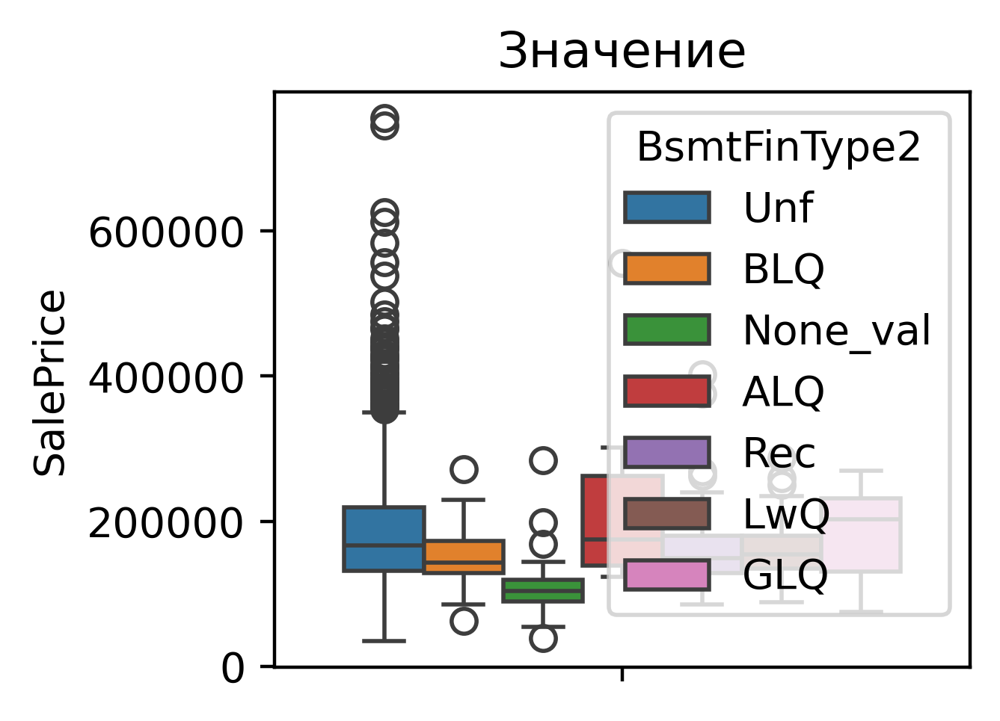

-----------------------------------
Heating
Floor     72500.000
GasA     182021.195
GasW     166632.167
Grav      75271.429
OthW     125750.000
Wall      92100.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 4.26
-----------------------------------
Признак важен


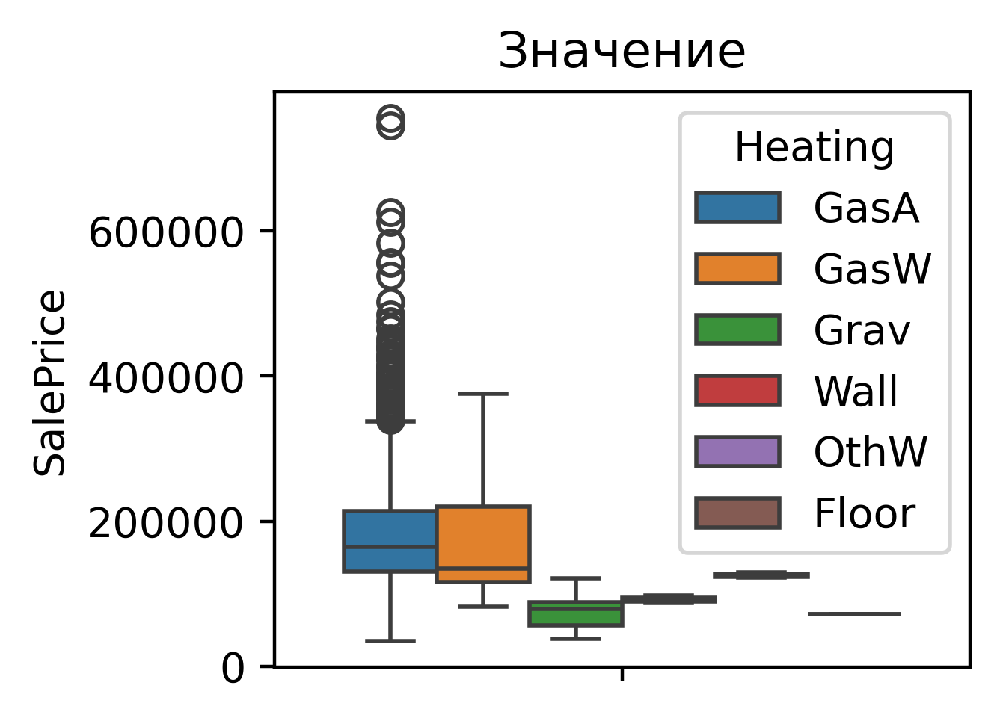

-----------------------------------
HeatingQC
Ex    214914.429
Fa    123919.490
Gd    156858.871
Po     87000.000
TA    142362.876
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 88.394
-----------------------------------
Признак важен


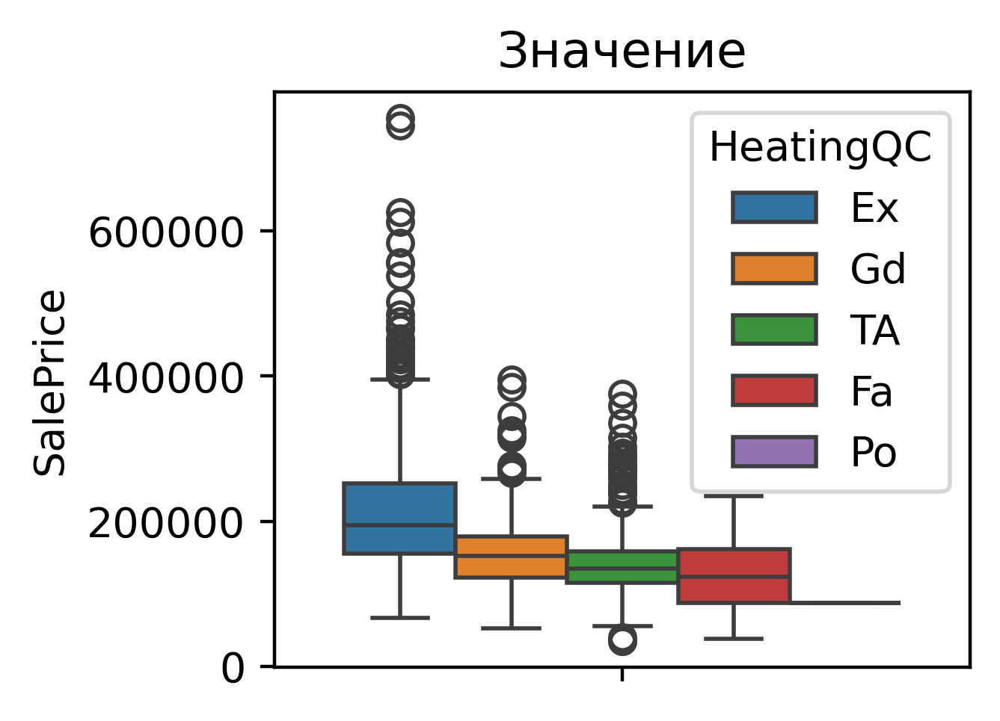

-----------------------------------
CentralAir
N    105264.074
Y    186186.710
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 98.305
-----------------------------------
Признак важен


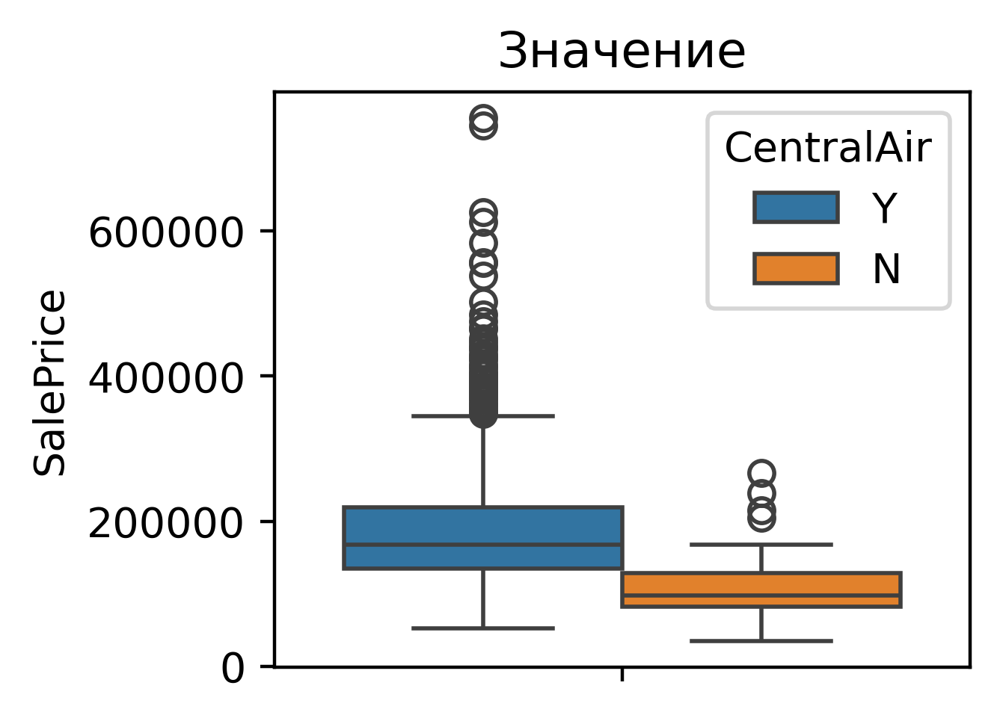

-----------------------------------
Electrical
FuseA    122196.894
FuseF    107675.444
FuseP     97333.333
Mix       67000.000
SBrkr    186810.637
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 23.074
-----------------------------------
Признак важен


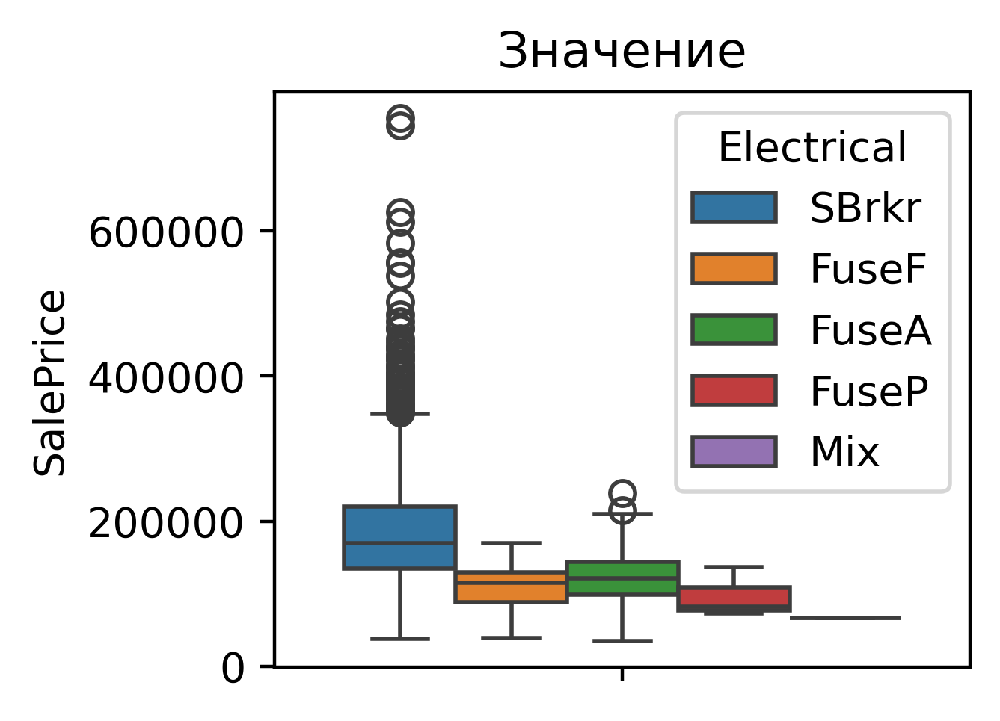

-----------------------------------
KitchenQual
Ex    328554.670
Fa    105565.205
Gd    212116.024
TA    139962.512
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 407.806
-----------------------------------
Признак важен


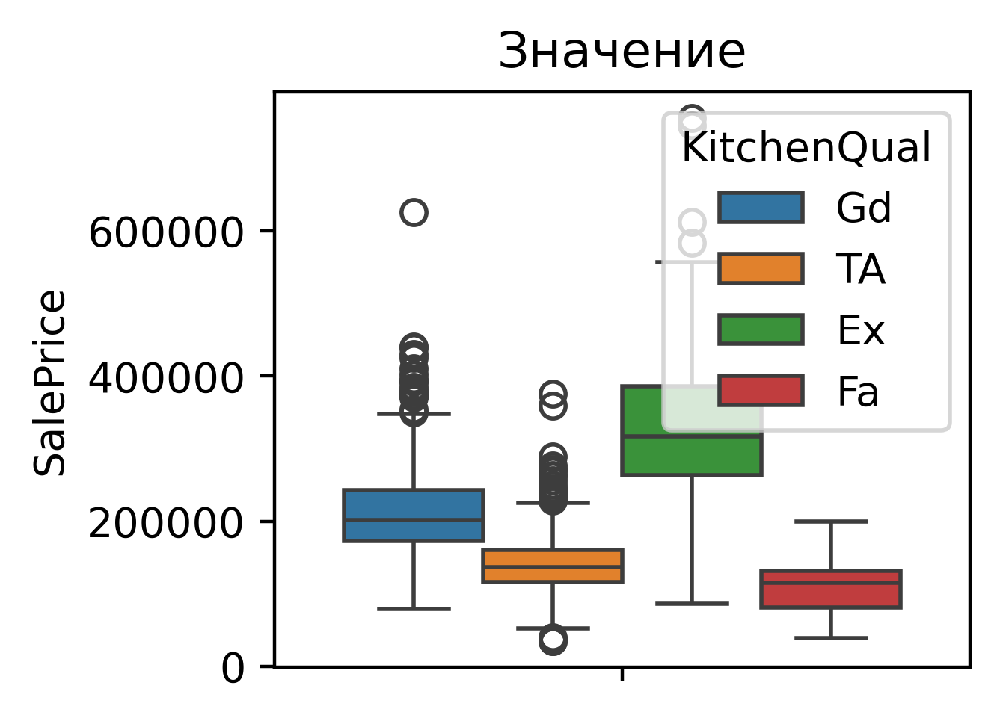

-----------------------------------
Functional
Maj1    153948.143
Maj2     85800.000
Min1    146385.484
Min2    144240.647
Mod     168393.333
Sev     129000.000
Typ     183429.147
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 4.058
-----------------------------------
Признак важен


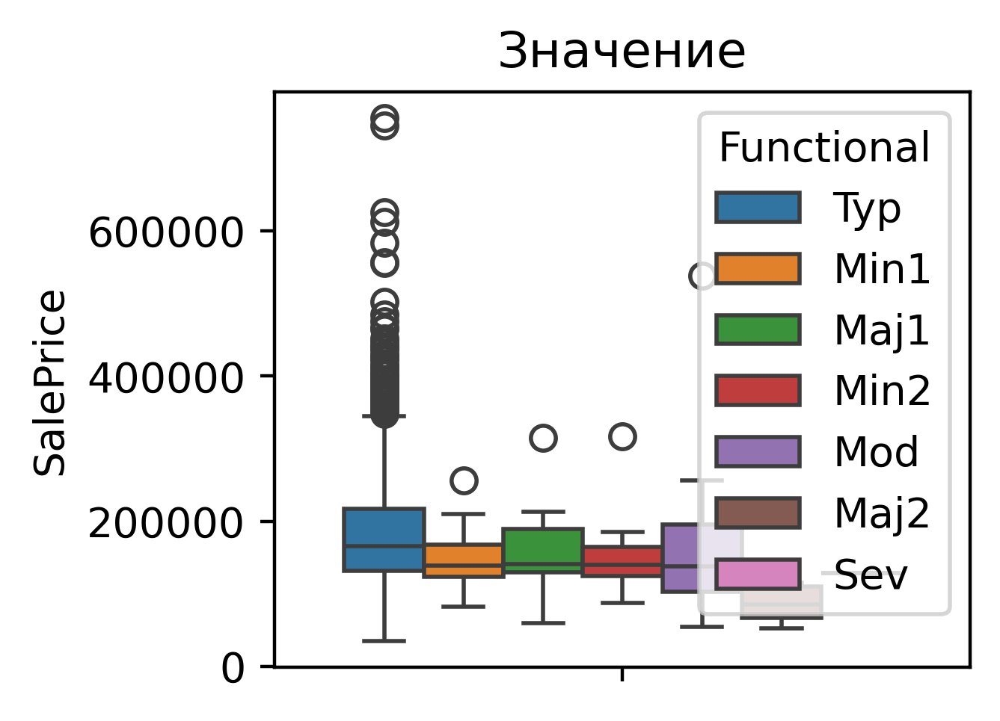

-----------------------------------
FireplaceQu
Ex          337712.500
Fa          167298.485
Gd          226351.416
None_val    141331.483
Po          129764.150
TA          205723.489
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 121.075
-----------------------------------
Признак важен


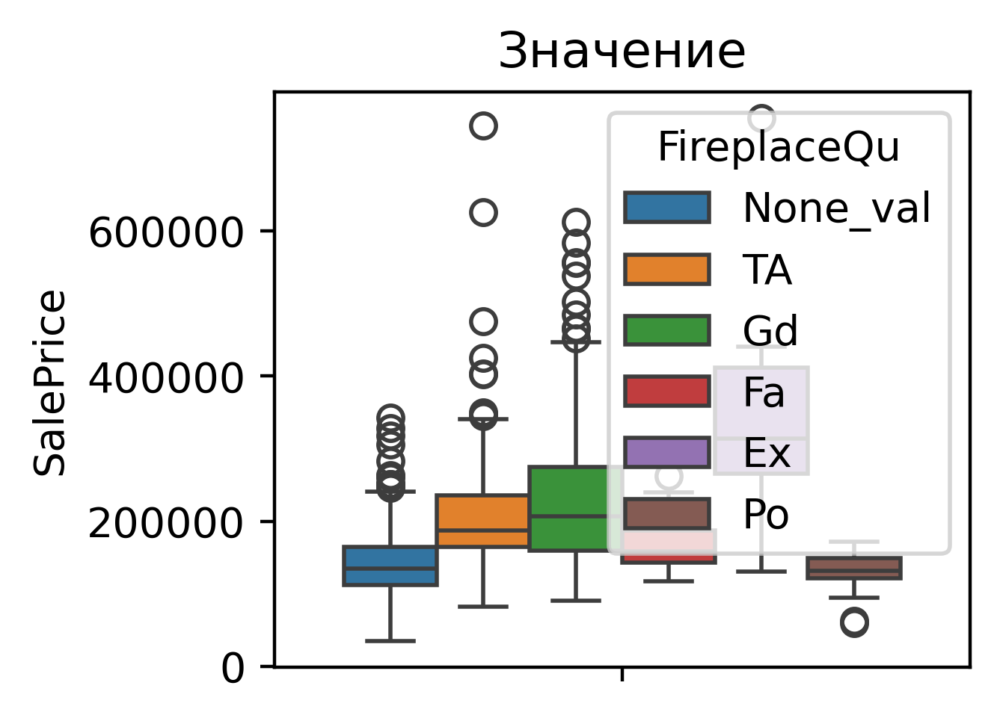

-----------------------------------
GarageType
2Types      151283.333
Attchd      202892.656
Basment     160570.684
BuiltIn     254751.739
CarPort     109962.111
Detchd      134091.163
None_val    103317.284
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 80.38
-----------------------------------
Признак важен


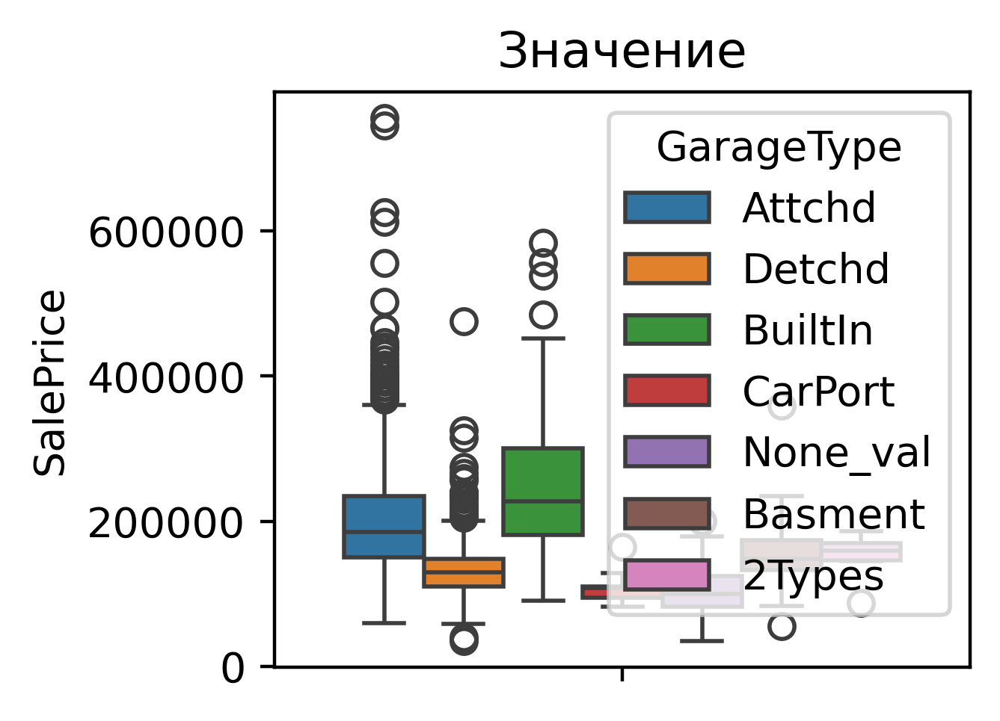

-----------------------------------
GarageFinish
Fin         240052.690
None_val    103317.284
RFn         202068.870
Unf         142156.423
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 213.867
-----------------------------------
Признак важен


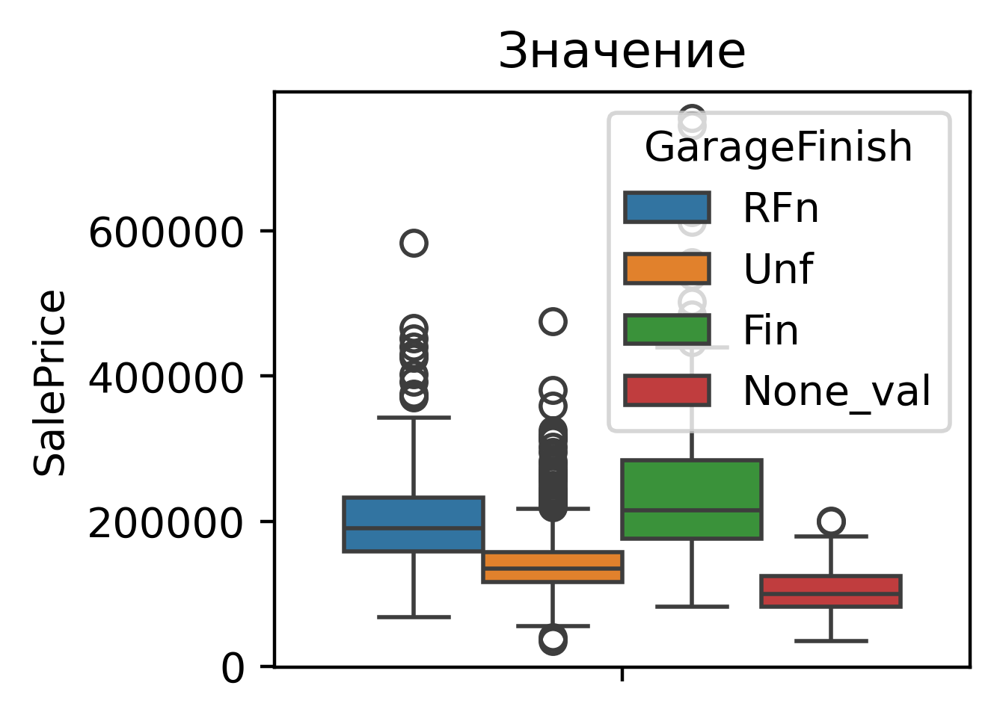

-----------------------------------
GarageQual
Ex          241000.000
Fa          123573.354
Gd          215860.714
None_val    103317.284
Po          100166.667
TA          187489.836
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 25.776
-----------------------------------
Признак важен


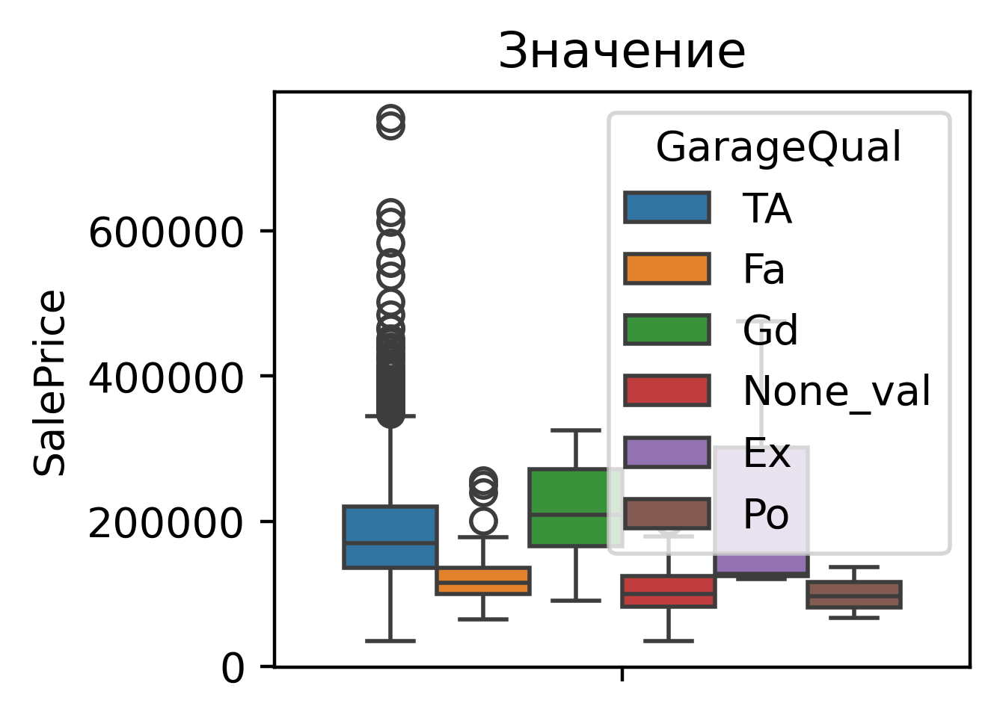

-----------------------------------
GarageCond
Ex          124000.000
Fa          114654.029
Gd          179930.000
None_val    103317.284
Po          108500.000
TA          187885.735
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 25.75
-----------------------------------
Признак важен


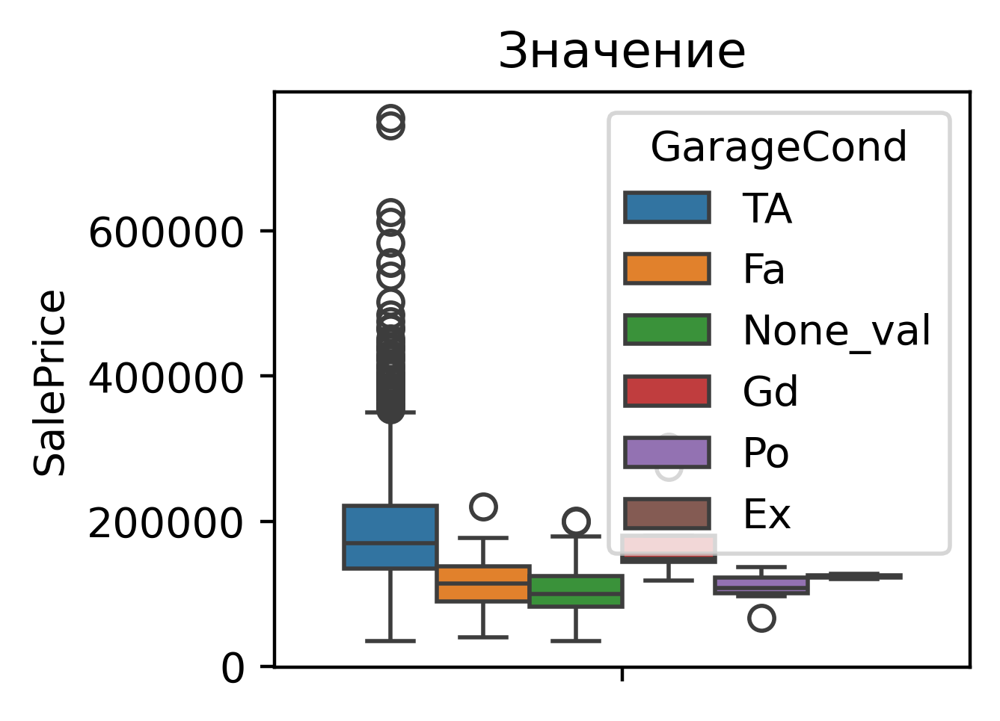

-----------------------------------
PavedDrive
N    115039.122
P    132330.000
Y    186433.974
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 42.024
-----------------------------------
Признак важен


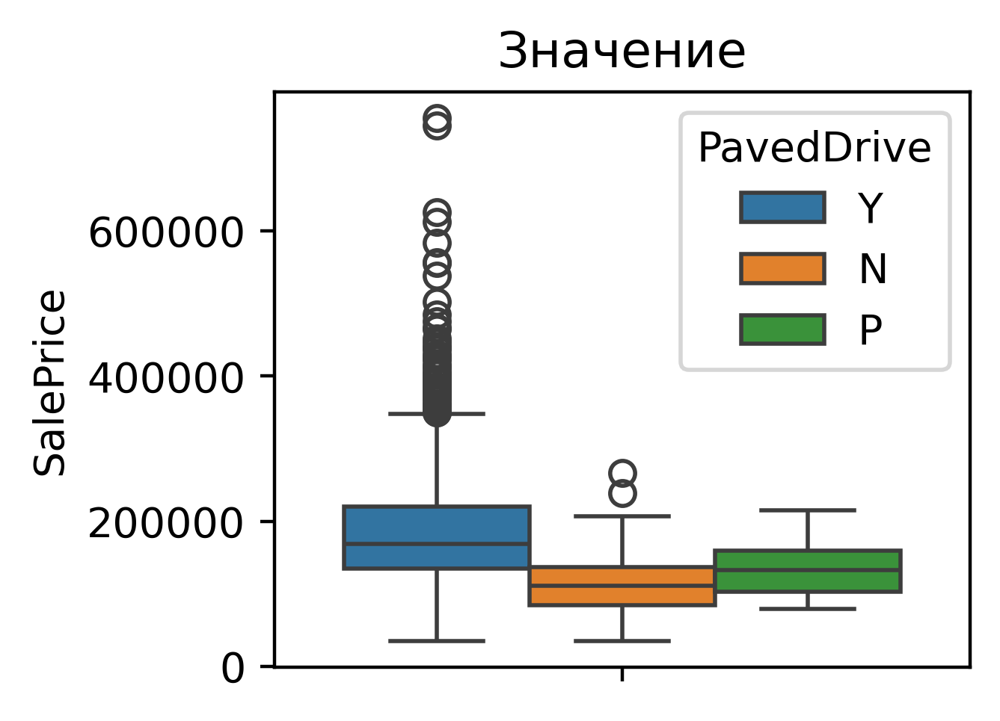

-----------------------------------
PoolQC
Ex          490000.000
Fa          215500.000
Gd          201990.000
None_val    180404.663
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 10.51
-----------------------------------
Признак важен


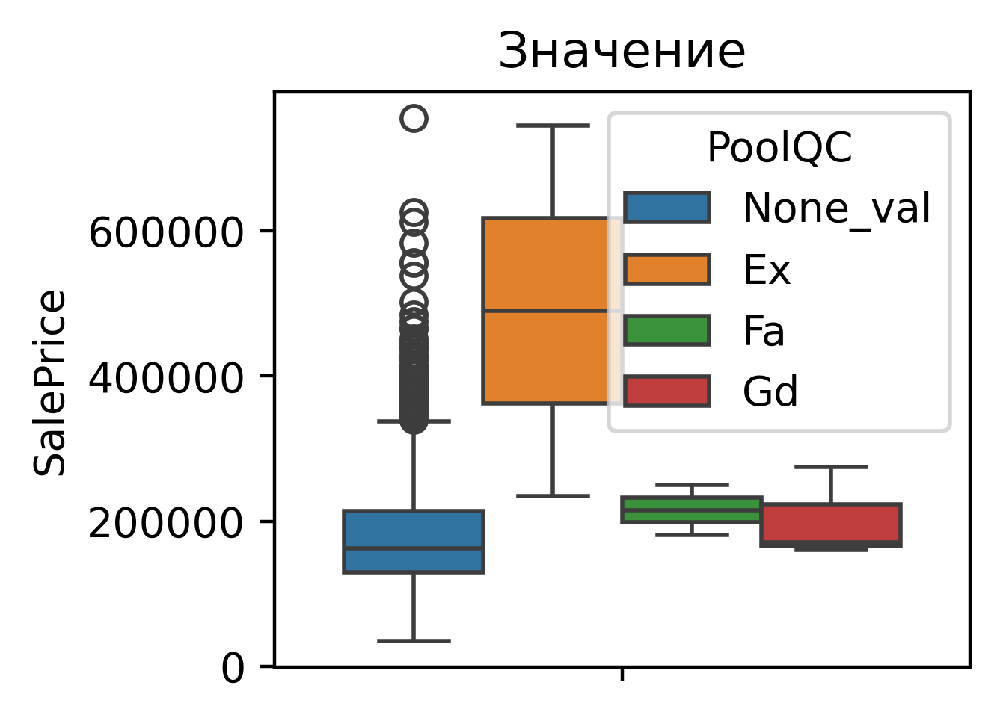

-----------------------------------
Fence
GdPrv       178927.458
GdWo        140379.315
MnPrv       148751.089
MnWw        134286.364
None_val    187596.838
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 13.433
-----------------------------------
Признак важен


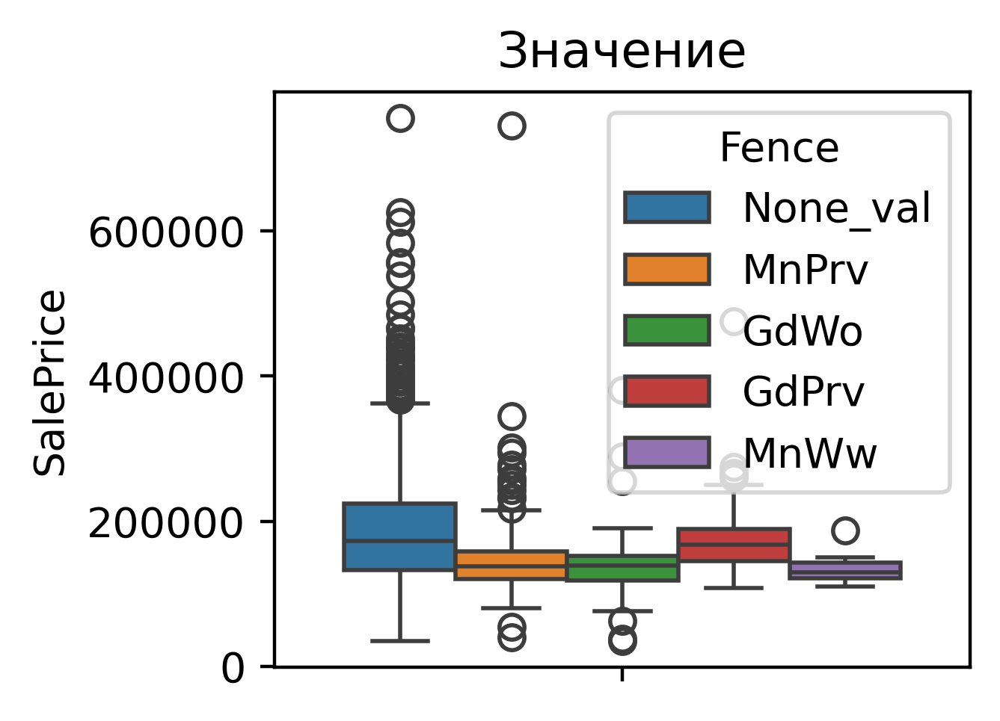

-----------------------------------
MiscFeature
Gar2        170750.000
None_val    182046.410
Othr         94000.000
Shed        151187.612
TenC        250000.000
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 2.594
-----------------------------------
Признак важен


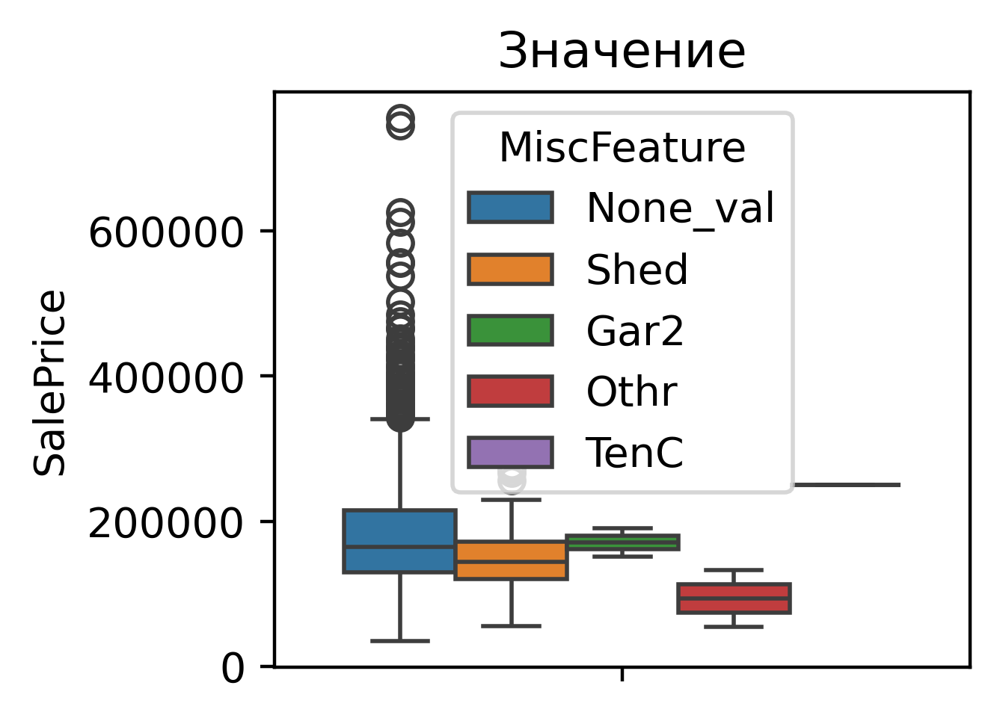

-----------------------------------
SaleType
COD      143973.256
CWD      210600.000
Con      269600.000
ConLD    138780.889
ConLI    200390.000
ConLw    143700.000
New      274945.418
Oth      119850.000
WD       173401.837
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 28.863
-----------------------------------
Признак важен


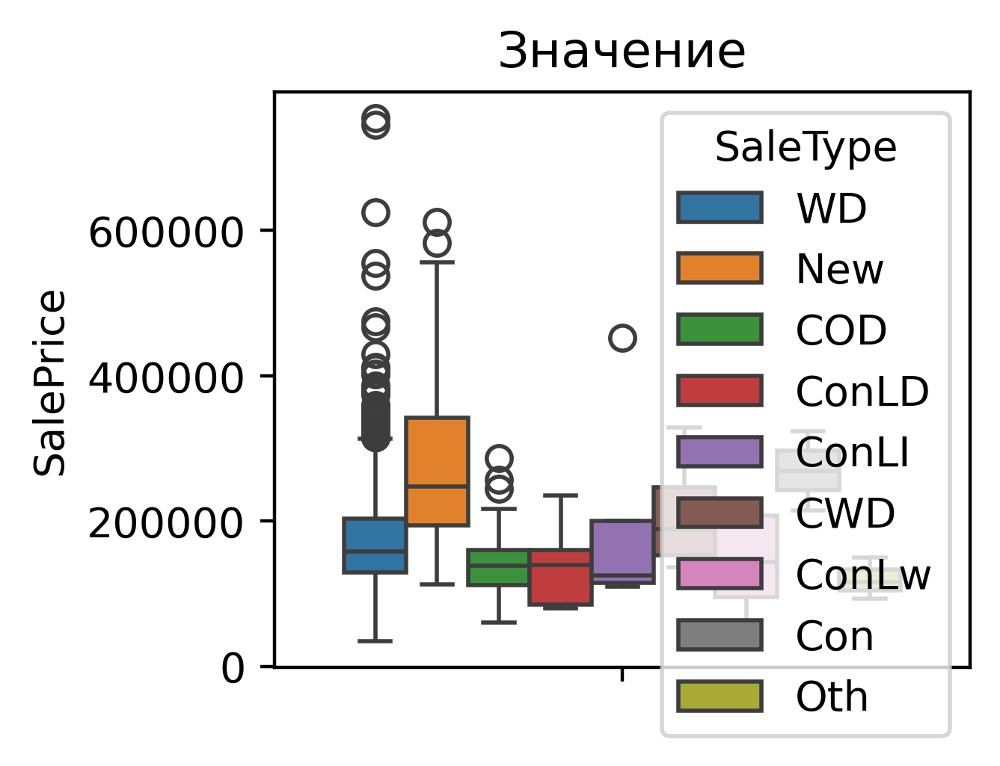

-----------------------------------
SaleCondition
Abnorml    146526.624
AdjLand    104125.000
Alloca     167377.417
Family     149600.000
Normal     175202.220
Partial    272291.752
Name: SalePrice, dtype: float64
-----------------------------------
Статистика: 45.578
-----------------------------------
Признак важен


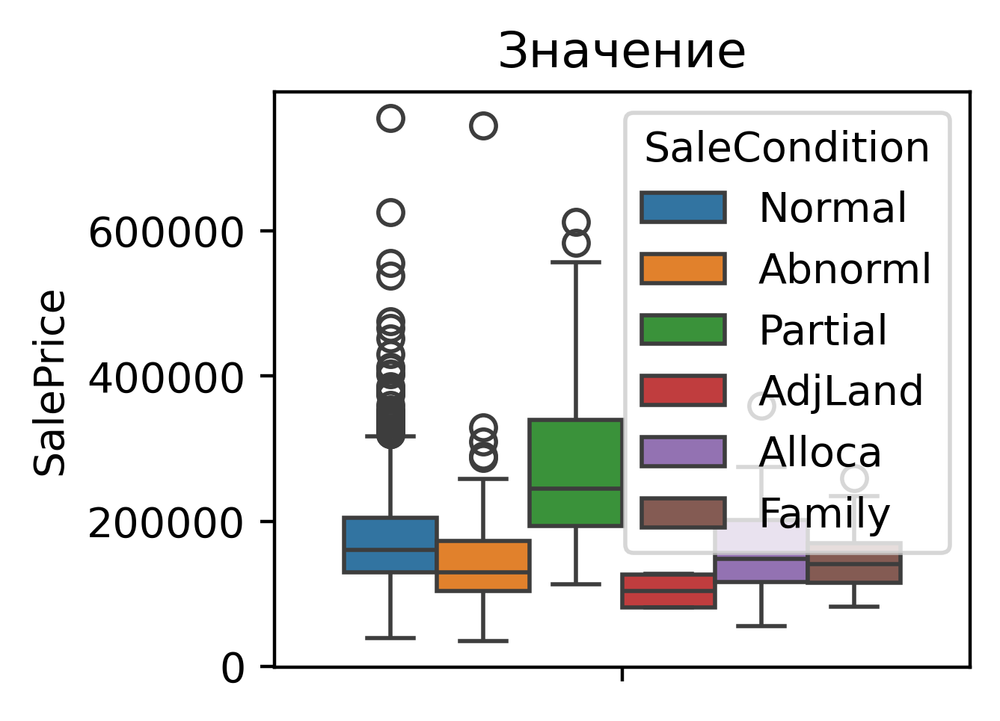

In [751]:
for col in df_cat_columns.drop("SalePrice", axis=1).columns:
    drow_boxplot_cat(df_cat_columns, col)

In [752]:
#Выкинем признак LandSlope, так как критерий показал, что данный признак несет больше шумовой информации
df_cat_columns.drop("LandSlope", axis=1, inplace=True)
print("Данный признак был успешно удалён!")

Данный признак был успешно удалён!


### Кодировка признаков
- Порядковые признаки кодируем с помощью словоря
- Признаки, где уникальных значений меньше 6, кодируем с помощью ohe
- Признаки, где уникальных значений больше 6 кодируем с помощью mte, кодировка происходит с помощью кросс-валидации и добавлнение маленького шума

In [862]:
#Соединим данные в единые
df_cat_columns.drop("SalePrice", axis=1, inplace=True)
new_df = pd.concat([df_num_columns, df_cat_columns], axis=1)

In [863]:
#Кидировака порядковых признаков
# Словарь для оценки качества
quality_map = {
    'Ex': 5,    # Excellent
    'Gd': 4,    # Good
    'TA': 3,    # Typical/Average
    'Fa': 2,    # Fair
    'Po': 1,    # Poor
    'None_val': 0   # Для случаев, когда признак отсутствует
}

# Список признаков, использующих эту шкалу
quality_features = [
    'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
    'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC'
]

In [864]:
# --- СПИСКИ ПРИЗНАКОВ ---
specific_ordinal_features = [
    'LotShape',
    'BsmtExposure',
    'BsmtFinType1',
    'BsmtFinType2',
    'Functional',
    'GarageFinish',
    'Fence',
    'PavedDrive',
    'CentralAir'
]

# --- СЛОВАРИ ДЛЯ НИХ ---

# LotShape: Общая форма свойства
lot_shape_map = {'Reg': 3, 'IR1': 2, 'IR2': 1, 'IR3': 0}

# BsmtExposure: Уровень "открытости" стен подвала
bsmt_exposure_map = {'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'None_val': 0}

# BsmtFinType1 & BsmtFinType2: Качество отделанной зоны в подвале
bsmt_fin_type_map = {'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'None_val': 0}

# Functional: Рейтинг функциональности дома
functional_map = {'Typ': 7, 'Min1': 6, 'Min2': 5, 'Mod': 4, 'Maj1': 3, 'Maj2': 2, 'Sev': 1, 'Sal': 0}

# GarageFinish: Внутренняя отделка гаража
garage_finish_map = {'Fin': 3, 'RFn': 2, 'Unf': 1, 'None_val': 0}

# Fence: Качество забора
fence_map = {'GdPrv': 4, 'MnPrv': 3, 'GdWo': 2, 'MnWw': 1, 'None_val': 0}

# PavedDrive: Асфальтированная подъездная дорога
paved_drive_map = {'Y': 2, 'P': 1, 'N': 0}

# CentralAir: Центральное кондиционирование (бинарный признак)
central_air_map = {'Y': 1, 'N': 0}

all_specific_maps = {
    'LotShape': lot_shape_map,
    'BsmtExposure': bsmt_exposure_map,
    'BsmtFinType1': bsmt_fin_type_map,
    'BsmtFinType2': bsmt_fin_type_map, # Использует тот же словарь
    'Functional': functional_map,
    'GarageFinish': garage_finish_map,
    'Fence': fence_map,
    'PavedDrive': paved_drive_map,
    'CentralAir': central_air_map
}

In [865]:
# Кодируем общие качественные признаки
for col in quality_features:
    new_df[col] = new_df[col].map(quality_map)

# Кодируем специфичные признаки
for col, current_map in all_specific_maps.items():
    new_df[col] = new_df[col].map(current_map)

In [866]:
#Закодируем оставшиеся признаки с помощью ohe и mte
splitter = KFold(n_splits=7, shuffle=True, random_state=42)

cat_columns = new_df.columns[new_df.dtypes==object]

for col in cat_columns:
    if new_df[col].nunique() <= 6:
        ohe_vector = pd.get_dummies(new_df[col], prefix=col, drop_first=True, dtype="int")
        new_df = pd.concat([new_df, ohe_vector], axis=1)
        new_df.drop(col, axis=1, inplace=True)
    else:
        new_col = f"mte_{col}"
        new_df[new_col] = 0.0
        for train_index, test_index in splitter.split(new_df):
            map_dict = new_df.iloc[train_index].groupby(col)["SalePrice"].mean().to_dict()

            map_values = new_df.loc[test_index, col].map(map_dict)
            noise = np.random.uniform(low=0.99, high=1.01, size=len(map_values))
            new_df.loc[test_index, new_col] = map_values * noise

        global_mean_saleprice = new_df["SalePrice"].mean()
        new_df[new_col].fillna(global_mean_saleprice, inplace=True)
        new_df.drop(col, axis=1, inplace=True)

print("Все колонки были закодированы!")

Все колонки были закодированы!


In [867]:
#Посмотрим количество пропусков после кодирования
print(f"Количество пропусков: {new_df.drop("SalePrice", axis=1).isna().sum().sum()}")

Количество пропусков: 0


In [880]:
check_VIF(new_df)

                          VIF
MSSubClass              8.686
TotalBsmtSF             6.454
1stFlrSF                7.238
GrLivArea               8.121
AgeConstruction         8.571
GarageQual             10.526
GarageCond             10.943
MSZoning_FV             8.093
MSZoning_RL            25.109
MSZoning_RM            19.358
RoofStyle_Gable        28.585
RoofStyle_Hip          27.294
mte_Exterior1st         6.374
mte_Exterior2nd         6.475
MasVnrType_BrkFace     26.647
MasVnrType_None_val    30.288
MasVnrType_Stone       10.865
Foundation_CBlock       5.087
Foundation_PConc        6.590
mte_SaleType            8.666
SaleCondition_Partial  11.132


In [879]:
#Удалим колонки MiscFeature_None_val
new_df.drop(["MiscFeature_None_val", "Heating_GasA"], axis=1, inplace=True)
print("Данные колонки были успешно удалены!")

Данные колонки были успешно удалены!


# Этап 3: Анализ целевой переменной

----------------------------------
SalePrice
Ассиметрия равна: 1.8828757597682129
Эксцесс равен: 6.5362818600645305
----------------------------------


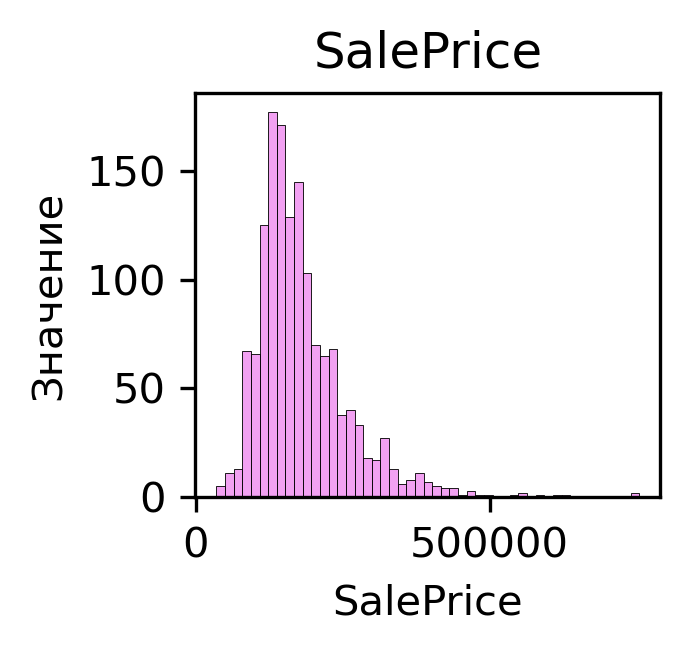

In [851]:
#Посмотрим распределение целевого значения переменной
drow_histplot(new_df, "SalePrice")

----------------------------------
SalePrice
Ассиметрия равна: 0.12134661989685333
Эксцесс равен: 0.809519155707878
----------------------------------


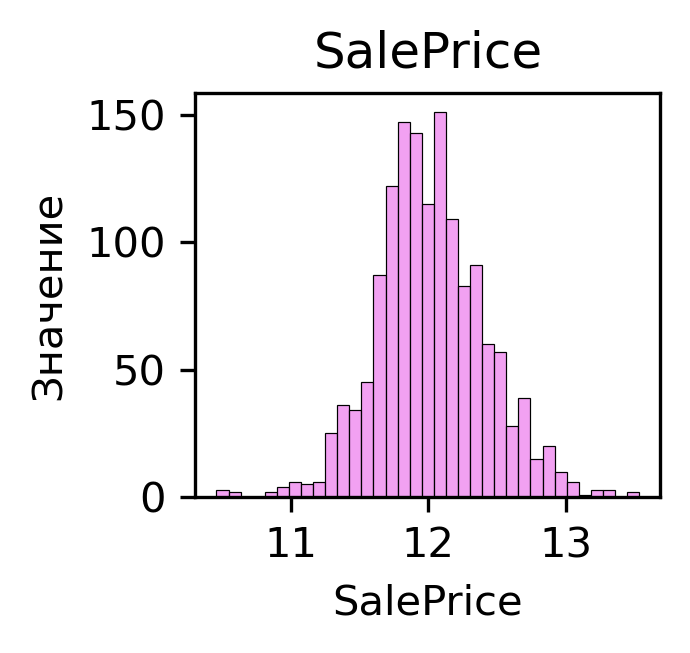

In [852]:
#Посмотрим на значение целевой переменной прологарифмировав её
print("----------------------------------")
print("SalePrice")
print(f"Ассиметрия равна: {np.log1p(df["SalePrice"]).skew()}")
print(f"Эксцесс равен: {np.log1p(df["SalePrice"]).kurt()}")
print("----------------------------------")
fig = plt.figure(figsize=(2, 1.75), dpi=300)
plt.title("SalePrice")
plt.ylabel("Значение")
sns.histplot(data=pd.DataFrame({"SalePrice": np.log1p(df["SalePrice"])}), x="SalePrice", color="violet")
plt.show()
#Видно, что после логаримирования, распредление больше походит на нормальное

### Генерация различных признаков
- Генерация признаков с помощью PolinomialFeature
- Генерация признаков только со степенями, без перемножения признаков, но только для вещественных признаков
### Дальнейшие генерации признаков с помощью различных функций
- квадратичное отклонение
- синус
- косинус
- дисперсия
- отстут от матожидания
- логарифм

# Этап 4: Инжиниринг признаков и финальная валидация

In [881]:
#Разделение данных с целевым значением и без
X_target = new_df.iloc[new_df[new_df["SalePrice"].notna()].index].drop("SalePrice", axis=1)
X_not_target = new_df.iloc[new_df[new_df["SalePrice"].isnull()].index].drop("SalePrice", axis=1)
y_target = new_df.iloc[new_df[new_df["SalePrice"].notna()].index]["SalePrice"]
y_not_target = new_df.iloc[new_df[new_df["SalePrice"].isnull()].index]["SalePrice"]

In [882]:
#Разделение колонок на вещественные и дискретные
num_col = new_df.drop("SalePrice", axis=1).nunique()[new_df.drop("SalePrice", axis=1).nunique() > 30].index.values
discrete_values = new_df.drop("SalePrice", axis=1).nunique()[new_df.drop("SalePrice", axis=1).nunique() <= 30].index.values

In [883]:
#Генерация признаков с помощью PolynomialFeature, но только вещественные признаки
list_errors_1, list_log_errors_1 = [], []
for degree in range(1, 5):
    transfrom = PolynomialFeatures(degree=degree, include_bias=False)
    X_1 = pd.DataFrame(transfrom.fit_transform(X_target[num_col]))
    X_total = pd.concat([X_1, X_target[discrete_values]], axis=1)
    X_total.columns = X_total.columns.astype(str)
    print(f"Номер итерации: {degree}, суммарное количество признаков: {X_total.shape[1]}")
    pipe_model = Pipeline([("scaler", StandardScaler()),
                          ("model", Ridge())])
    mean_score = -float(np.mean(cross_val_score(estimator=pipe_model, X=X_total, y=y_target, n_jobs=-1, scoring="neg_mean_squared_error")))
    list_errors_1.append(mean_score)

    pipe_model = Pipeline([("scaler", StandardScaler()),
                          ("model", Ridge())])
    mean_score = -float(np.mean(cross_val_score(estimator=pipe_model, X=X_total, y=np.log1p(y_target), n_jobs=-1, scoring="neg_mean_squared_error")))
    list_log_errors_1.append(mean_score)

Номер итерации: 1, суммарное количество признаков: 101
Номер итерации: 2, суммарное количество признаков: 401
Номер итерации: 3, суммарное количество признаков: 3001
Номер итерации: 4, суммарное количество признаков: 20551


Ошибка при степени: 1: 1102650154
Ошибка при степени: 2: 1756074620
Ошибка при степени: 3: 5729161918
Ошибка при степени: 4: 14395916189
Ошибка при степени log : 1: 0.01959
Ошибка при степени log : 2: 0.02695
Ошибка при степени log : 3: 0.19428
Ошибка при степени log : 4: 0.6737


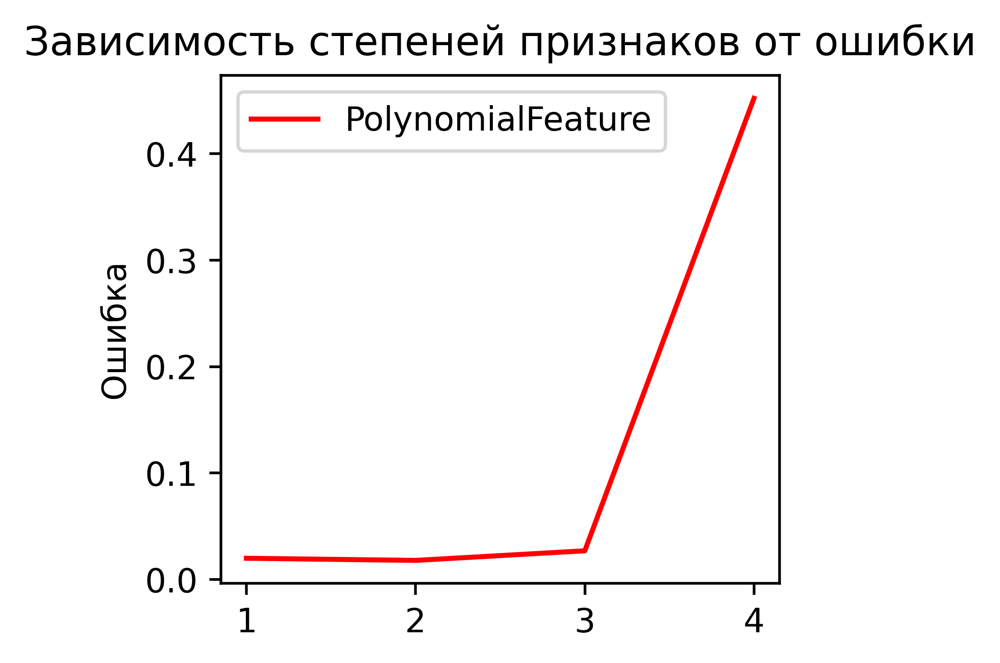

In [884]:
[print(f"Ошибка при степени: {degree}: {round(error)}") for degree, error in zip(list(range(1, 5)), list_errors_1)]
[print(f"Ошибка при степени log : {degree}: {round(error, 5)}") for degree, error in zip(list(range(1, 5)), list_log_errors_1)]
fig = plt.figure(figsize=(3, 2.75), dpi=500)
plt.title("Зависимость степеней признаков от ошибки")
plt.ylabel("Ошибка")
plt.plot(list(range(1, 5)), list_errors, color="red", label="PolynomialFeature", ms=5)
plt.legend()
plt.show()
#Результат, видно, что с добавлением степеней модель только переобучается

In [885]:
#Генерация признаков только с помощью степеней, без добавлений коомбинаций признаков
list_errors_2, list_log_errors_2 = [], []
X_target_copy = X_target.copy()
for degree in range(1, 5):
    if degree != 1:
        for col in num_col:
            X_target_copy[f"{col}_degree_{degree}"] = X_target[col]**degree
    print(f"Номер итерации: {degree}, суммарное количество признаков: {X_target_copy.shape[1]}")
    pipe_model = Pipeline([("scaler", StandardScaler()),
                          ("model", Ridge())])
    mean_score = -float(np.mean(cross_val_score(estimator=pipe_model, X=X_target_copy, y=y_target, n_jobs=-1, scoring="neg_mean_squared_error")))
    list_errors_2.append(mean_score)

    pipe_model = Pipeline([("scaler", StandardScaler()),
                          ("model", Ridge())])
    mean_score = -float(np.mean(cross_val_score(estimator=pipe_model, X=X_target_copy, y=np.log1p(y_target), n_jobs=-1, scoring="neg_mean_squared_error")))
    list_log_errors_2.append(mean_score)

Номер итерации: 1, суммарное количество признаков: 101
Номер итерации: 2, суммарное количество признаков: 125
Номер итерации: 3, суммарное количество признаков: 149
Номер итерации: 4, суммарное количество признаков: 173


Ошибка при степени: 1: 1102650154
Ошибка при степени: 2: 1609979243
Ошибка при степени: 3: 2757373996
Ошибка при степени: 4: 55923529177
Ошибка при степени: 1: 0.01959
Ошибка при степени: 2: 0.01747
Ошибка при степени: 3: 0.02685
Ошибка при степени: 4: 0.45116


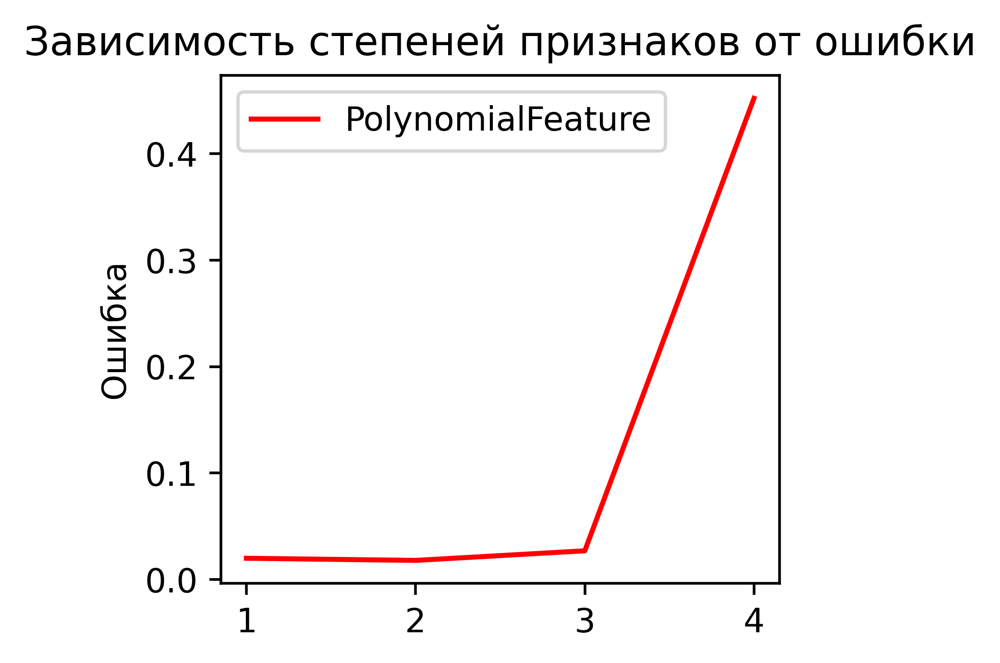

In [886]:
[print(f"Ошибка при степени: {degree}: {round(error)}") for degree, error in zip(list(range(1, 5)), list_errors_2)]
[print(f"Ошибка при степени: {degree}: {round(error, 5)}") for degree, error in zip(list(range(1, 5)), list_log_errors_2)]
fig = plt.figure(figsize=(3, 2.75), dpi=500)
plt.title("Зависимость степеней признаков от ошибки")
plt.ylabel("Ошибка")
plt.plot(list(range(1, 5)), list_errors, color="red", label="PolynomialFeature", ms=5)
plt.legend()
plt.show()
#Результат, видно, что с добавлением степеней модель только переобучается

### Результат
- Получили интересную зависимость для линейной модели, без логарифмирования лучше работает первый эксперимент, а с логарифмированием второй

### Генерация признаков с помощью различных функций

In [898]:
X_target_copy = X_target.copy()
#Генерация признаков дисперсии, синус, косинус, логарифм
for col in num_col:
    X_target_copy[f"var_{col}"] = (X_target_copy[col].mean() - X_target_copy[col])**2
    X_target_copy[f"sin_{col}"] = np.sin(X_target_copy[col])
    X_target_copy[f"cos_{col}"] = np.cos(X_target_copy[col])
    X_target_copy[f"log1p_{col}"] = np.log1p(X_target_copy[col] + 10**(-6))
pipe_model = Pipeline([("scaler", StandardScaler()),
                          ("model", Ridge())])
mean_score = -float(np.mean(cross_val_score(estimator=pipe_model, X=X_target_copy, y=y_target, n_jobs=-1, scoring="neg_mean_squared_error")))
print(f"Ошибка: {round(mean_score)}")
#Ошибка стала гораздо выше

Ошибка: 3054591244


### Перебор различных гиперпараметров для различных моделей

In [911]:
#Переберем различные гиперпараметры для различных моделей
#Для начала для линейной регрессии, а именно для ElasticNet
#Сначала без логарифмирования и признаками первой степени
split = KFold(n_splits=8, shuffle=True, random_state=True)

pipe = Pipeline([("scaler", StandardScaler()), ("model", ElasticNet())])

param_grid = {
    "model__alpha": [18, 19, 20, 21, 22, 23, 24, 25],
    "model__l1_ratio": [0.97, 0.98, 0.99, 1],
}

grid = GridSearchCV(estimator=pipe, param_grid=param_grid, n_jobs=-1, verbose=10, scoring="neg_mean_squared_error", cv=split)

In [913]:
print("Лучшие параметры:", grid.best_params_)
print("Лучший MSE:", round((-grid.best_score_)**0.5))

Лучшие параметры: {'model__alpha': 20, 'model__l1_ratio': 0.99}
Лучший MSE: 34388


In [927]:
#Обучим модель KNN
split = KFold(n_splits=8, shuffle=True, random_state=True)

pipe = Pipeline([("scaler", StandardScaler()), ("model", KNeighborsRegressor(n_jobs=-1))])

param_grid = {
    "model__n_neighbors": [1, 2, 3, 4, 5, 7, 9, 11, 13, 15, 20],
    "model__weights": ["uniform", "distance"],
    "model__p": [1, 2, 3, 4, 5]
}

grid = GridSearchCV(estimator=pipe, param_grid=param_grid, n_jobs=-1, verbose=10, scoring="neg_mean_squared_error", cv=split)

In [928]:
%%time
grid.fit(X_target, y_target)

Fitting 8 folds for each of 110 candidates, totalling 880 fits
CPU times: total: 1.62 s
Wall time: 16.4 s


GridSearchCV(cv=KFold(n_splits=8, random_state=True, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model',
                                        KNeighborsRegressor(n_jobs=-1))]),
             n_jobs=-1,
             param_grid={'model__n_neighbors': [1, 2, 3, 4, 5, 7, 9, 11, 13, 15,
                                                20],
                         'model__p': [1, 2, 3, 4, 5],
                         'model__weights': ['uniform', 'distance']},
             scoring='neg_mean_squared_error', verbose=10)

In [929]:
print("Лучшие параметры:", grid.best_params_)
print("Лучший MSE:", round((-grid.best_score_)**0.5))

Лучшие параметры: {'model__n_neighbors': 7, 'model__p': 1, 'model__weights': 'distance'}
Лучший MSE: 36318


In [955]:
#Обучим модель решающих деревьев
split = KFold(n_splits=8, shuffle=True, random_state=True)

pipe = Pipeline([("scaler", StandardScaler()), ("model", DecisionTreeRegressor())])
param_grid = {
    "model__max_depth": list(range(5, 20)),
    "model__min_samples_split": list(range(10, 31)),
    "model__min_samples_leaf": list(range(15, 35))
}

grid = GridSearchCV(estimator=pipe, param_grid=param_grid, n_jobs=-1, verbose=10, scoring="neg_mean_squared_error", cv=split)

In [956]:
%%time
grid.fit(X_target, y_target)

Fitting 8 folds for each of 6300 candidates, totalling 50400 fits
CPU times: total: 1min 26s
Wall time: 2min 24s


GridSearchCV(cv=KFold(n_splits=8, random_state=True, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', DecisionTreeRegressor())]),
             n_jobs=-1,
             param_grid={'model__max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14,
                                              15, 16, 17, 18, 19],
                         'model__min_samples_leaf': [15, 16, 17, 18, 19, 20, 21,
                                                     22, 23, 24, 25, 26, 27, 28,
                                                     29, 30, 31, 32, 33, 34],
                         'model__min_samples_split': [10, 11, 12, 13, 14, 15,
                                                      16, 17, 18, 19, 20, 21,
                                                      22, 23, 24, 25, 26, 27,
                                                      28, 29, 30]},
             scoring='neg_mean_squared_error', verbose=10)

In [957]:
print("Лучшие параметры:", grid.best_params_)
print("Лучший MSE:", round((-grid.best_score_)**0.5))

Лучшие параметры: {'model__max_depth': 10, 'model__min_samples_leaf': 22, 'model__min_samples_split': 10}
Лучший MSE: 37196


In [979]:
#Теперь используем Bagging
split = KFold(n_splits=8, shuffle=True, random_state=True)

pipe = Pipeline([("scaler", StandardScaler()), ("model", BaggingRegressor(estimator=DecisionTreeRegressor(), n_estimators=500))])
param_grid = {
    "model__max_samples": [0.85],
    "model__max_features": [0.6]
}
grid = GridSearchCV(estimator=pipe, param_grid=param_grid, n_jobs=-1, verbose=10, scoring="neg_mean_squared_error", cv=split)

In [980]:
%%time
grid.fit(X_target, y_target)

Fitting 8 folds for each of 1 candidates, totalling 8 fits
CPU times: total: 6.31 s
Wall time: 14.1 s


GridSearchCV(cv=KFold(n_splits=8, random_state=True, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model',
                                        BaggingRegressor(estimator=DecisionTreeRegressor(),
                                                         n_estimators=500))]),
             n_jobs=-1,
             param_grid={'model__max_features': [0.6],
                         'model__max_samples': [0.85]},
             scoring='neg_mean_squared_error', verbose=10)

In [981]:
print("Лучшие параметры:", grid.best_params_)
print("Лучший MSE:", round((-grid.best_score_)**0.5))

Лучшие параметры: {'model__max_features': 0.6, 'model__max_samples': 0.85}
Лучший MSE: 27941


In [997]:
#Обучение LightGBM
split = KFold(n_splits=8, shuffle=True, random_state=True)
pipe = Pipeline([("scaler", StandardScaler()), ("model", lightgbm.LGBMRegressor())])
param_grid = {
    "model__num_leaves": [35, 40],
    "model__n_estimators": [120, 150],
    "model__learning_rate": [0.01, 0.03, 0.05, 0.07, 0.1],
    "model__subsample": [0.7, 0.75, 0.8]
}
grid = GridSearchCV(estimator=pipe, param_grid=param_grid, n_jobs=-1, verbose=10, scoring="neg_mean_squared_error", cv=split)

In [998]:
%%time
grid.fit(X_target, y_target)

Fitting 8 folds for each of 60 candidates, totalling 480 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4695
[LightGBM] [Info] Number of data points in the train set: 1460, number of used features: 82
[LightGBM] [Info] Start training from score 180921.195890
CPU times: total: 3.62 s
Wall time: 54.6 s


GridSearchCV(cv=KFold(n_splits=8, random_state=True, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('model', LGBMRegressor())]),
             n_jobs=-1,
             param_grid={'model__learning_rate': [0.01, 0.03, 0.05, 0.07, 0.1],
                         'model__n_estimators': [120, 150],
                         'model__num_leaves': [35, 40],
                         'model__subsample': [0.7, 0.75, 0.8]},
             scoring='neg_mean_squared_error', verbose=10)

In [996]:
print("Лучшие параметры:", grid.best_params_)
print("Лучший MSE:", round((-grid.best_score_)**0.5))

Лучшие параметры: {'model__learning_rate': 0.05, 'model__n_estimators': 100, 'model__num_leaves': 35, 'model__reg_alpha': 0, 'model__reg_lambda': 0, 'model__subsample': 0.8}
Лучший MSE: 27126


In [ ]:
#Класс для Линейней регрессии с регуляризацией
class LinearRegressionCustom:
    def __init__(self, bias=True, learning_rate=0.01, verbose=1000, max_iter = 1000, penalty=None, alpha=1, l1_ratio=0.5):
        self.bias = bias
        self.learning_rate = learning_rate
        self.verbose = verbose
        self.max_iter = max_iter
        self.penalty = penalty
        self.alpha = alpha
        self.l1_ratio =  l1_ratio
        self.W = None
        self.b = 0
#Метод обучения
    def fit(self, X, y):
        self.n_rows, self.n_cols = X.shape

        self.W = np.zeros(self.n_cols)
        self.b = 0
        
        for i in range(self.max_iter):
            y_pred = np.dot(X, self.W) + self.b
            error = y_pred - y
            #Выбор модели с регуляризацией или без неё
            if self.penalty == "l1":
                dW = (2 / self.n_rows) * np.dot(X.T, error) + (self.alpha / self.n_rows) * np.sign(self.W)
            elif self.penalty == "l2":
                dW = (2 / self.n_rows) * np.dot(X.T, error) + (2 * self.alpha / self.n_rows) * self.W
            elif self.penalty == "elasticnet":
                l1 = self.l1_ratio * (self.alpha / self.n_rows) * np.sign(self.W)
                l2 = (1 - self.l1_ratio) * (2 * self.alpha / self.n_rows) * self.W
                dW = (2 / self.n_rows) * np.dot(X.T, error) + l1 + l2
            else:
                dW = (2 / self.n_rows) * np.dot(X.T, error)

            db = (2 / self.n_rows) * np.sum(error)
            #Обновление весов с помощью вектора градиента 
            self.W = self.W - self.learning_rate * dW
            self.b = self.b - self.learning_rate * db
            #Вывод информации
            if i % self.verbose == 0 and i != 0:
                RMSE = (np.mean(error**2))**0.5
                print(f"На {i} итерации RMSE = {RMSE}")
    #Метод предсказания
    def predict(self, X):
        if self.bias:
            return np.dot(X, self.W) + self.b
        return np.dot(X, self.W)

In [ ]:
#Сравнение результатов модели 
sklearn_model = LinearRegression()
custom_model = LinearRegressionCustom()
X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)
sklearn_model.fit(X_train_scaler, y_train_log)
custom_model.fit(X_train_scaler, y_train_log)
print(f"MAE sklearn-овской линейной регрессии {MAE(np.exp(y_train_log), np.exp(sklearn_model.predict(X_train_scaler)))}")
print(f"MSE sklearn-овской линейной регрессии {MSE(np.exp(y_train_log), np.exp(sklearn_model.predict(X_train_scaler)))}")
print(f"MAE custom-ной линейной регрессии {MAE(np.exp(y_train_log), np.exp(custom_model.predict(X_train_scaler)))}")
print(f"MSE custom-ной линейной регрессии {MSE(np.exp(y_train_log), np.exp(custom_model.predict(X_train_scaler)))}")

### Результат
- Видно, что различные модели, дают различные результат, лучше всего в данной задаче показал себя LightGMB
- Поэтому для обучения логичее взять его, так как он быстрый и точный